In [32]:
import numpy as np
import math as m
import matplotlib.pyplot as plt
import matplotlib
from matplotlib.backends.backend_pdf import PdfPages
import edmcmc as edm
import multiprocessing as mp
import corner
import time
import pandas as pd
from astropy.time import Time
import radvel
from random import sample
from datetime import *
import os
from edmcmc_plot_ttv import *
import wobble_edmcmc_ttv
#import wobble_edmcmc_extra_orders

# import own functions/packages
from Mass_K_convert import *

#globally change font size for plots
plt.rcParams['font.size'] =17
plt.rcParams['mathtext.fontset'] = 'stix'
plt.rcParams['font.family'] = 'STIXGeneral'
#from matplotlib import rc
#rc('text', usetex=False)

# Index

### Table 1
- [Modular Stable Orbit Model, 1 Planet](#1planet_stable)
- [Modular Stable Orbit Model, 2 Planet Model (2nd companion = Keplerian)](#2planet_stable)
- [Modular Stable Orbit Model, 2 Planet Model (2nd companion = Quadratic)](#2planet_stable_quad)

### Table 2
- [1 Planet Model, evolving orbit model for primary](#1planet_evolving)
- [2 Planet Model, evolving orbit model for primary, 2nd companion = Keplerian](#2planet_evolving_kep)
- [2 Planet Model, evolving orbit model for primary, 2nd companion = Quadratic](#2planet_evolving_quad)

### Table 3
- [1 Planet Model, evolving orbit model for primary, 2nd companion = None](#1planet_evolving)
- [2 Planet Model, evolving orbit model for primary, 2nd companion = Linear](#2planet_evolving_lin)
- [2 Planet Model, evolving orbit model for primary, 2nd companion = Quadratic](#2planet_evolving_quad)
- [2 Planet Model, evolving orbit model for primary, 2nd companion = Keplerian](#2planet_evolving_kep)

In [33]:
# define function that converts bjd dates to UTC times
def time_bjd_isot(time_array):
    tm = Time(time_array-2400000, format='mjd')
    return tm.isot

def get_periastron_time(period, w_attt, e_attt, tt):
    '''Calculated the time of periastron passage given the period, angle of periastron, eccentricity and time of transit'''
    
    f = np.pi/2 - w_attt
    ea = 2*np.arctan(np.sqrt((1-e_attt)/(1+e_attt))*np.tan(f/2))       
    te = period/(2*np.pi)*(ea-e_attt*np.sin(ea))    
    tp = tt-te 
    return tp


In [34]:
# Choose universal

nwalkers = 200
nlinks = 5000#10000 #4000#4000#5000#7000#5000#2000 #0
nburnin = 1250#2500#8000 #3000#4000#5000#4000#500#1000#00

freeze_jitter =True # False #True #
jit1 = 3.562e1 #35.684232503321894
jit2 = 6.334e1 #63.647707639431516
jit3 = 4.003e1 #40.01458771106574

num_cpus_to_use = mp.cpu_count()-1

In [35]:
# Load 5 RV datasets without RM measurements

# open npz file
outfile = 'data/Five_RV_datasets.npz'#'NEW_DRS2_3_1_10s_norm.npz'

min_time_sub = 2455000#3980

npzfile = np.load(outfile, allow_pickle=True)
npzfile.files

data = {npzfile.files[0]: npzfile[npzfile.files[0]],
       npzfile.files[1]: npzfile[npzfile.files[1]],
       npzfile.files[2]: npzfile[npzfile.files[2]],
       npzfile.files[3]: npzfile[npzfile.files[3]],
       npzfile.files[4]: npzfile[npzfile.files[4]]}
df_used = pd.DataFrame(data=data)
df_used.head(10)
df_used = df_used[df_used['instrument_merged']!="Lick"][df_used['instrument_merged']!="SOPHIE"]
df_used = df_used.reset_index(drop=True)
df_used = df_used.sort_values(by=['bjd_merged']).reset_index(drop=True)
print(np.unique(df_used['instrument_merged']))


# format data for mcmc fit
rv_np = np.array(list(df_used["mnvel_merged"]-np.mean(df_used["mnvel_merged"])))
s_rv_np = np.array(list(df_used["errvel_merged"]))
time_np = np.array(df_used["bjd_merged"])-min_time_sub#-np.min(df_used["bjd_merged"])
time_min = np.min(df_used["bjd_merged"])
time_np_plus_min = time_np+time_min
instrument = df_used["instrument_merged"]



['HARPS-N GAPS 2013-2015' 'HARPS-N GAPS 2015-2017' 'HIRES']


In [36]:
# Make a quick csv for paper submission of data used

bjd_2450000 = df_used['bjd_merged']-2450000
rv_ms = df_used['mnvel_merged']
sigma_rv_ms =  df_used['errvel_merged']
instrument_rv = df_used['instrument_merged']

data_paper_table4 = {'BJD-2450000':bjd_2450000, 
       'RV (m/s)': rv_ms,
       '\sigma_{RV}': sigma_rv_ms,
       'Instrument': instrument_rv}
df_paper_table4 = pd.DataFrame(data = data_paper_table4)
df_paper_table4.to_csv("Table4.csv")

<a id='1planet_stable'></a>
## Modular Stable Orbit Model, 1 Planet

In [37]:
# Load 5 RV datasets without RM measurements

# open npz file
outfile = 'data/Five_RV_datasets.npz'#'NEW_DRS2_3_1_10s_norm.npz'

min_time_sub = 2455000#3980

npzfile = np.load(outfile, allow_pickle=True)
npzfile.files

data = {npzfile.files[0]: npzfile[npzfile.files[0]],
       npzfile.files[1]: npzfile[npzfile.files[1]],
       npzfile.files[2]: npzfile[npzfile.files[2]],
       npzfile.files[3]: npzfile[npzfile.files[3]],
       npzfile.files[4]: npzfile[npzfile.files[4]]}
df_used = pd.DataFrame(data=data)
df_used.head(10)
df_used = df_used[df_used['instrument_merged']!="Lick"][df_used['instrument_merged']!="SOPHIE"]
df_used = df_used.reset_index(drop=True)
df_used = df_used.sort_values(by=['bjd_merged']).reset_index(drop=True)
print(np.unique(df_used['instrument_merged']))


# format data for mcmc fit
rv_np = np.array(list(df_used["mnvel_merged"]-np.mean(df_used["mnvel_merged"])))
s_rv_np = np.array(list(df_used["errvel_merged"]))
time_np = np.array(df_used["bjd_merged"])-min_time_sub#-np.min(df_used["bjd_merged"])
time_min = np.min(df_used["bjd_merged"])
time_np_plus_min = time_np+time_min
instrument = df_used["instrument_merged"]

len(df_used)

['HARPS-N GAPS 2013-2015' 'HARPS-N GAPS 2015-2017' 'HIRES']


103

In [38]:
# Change this
num_instr = len(np.unique(instrument))
#freeze_jitter = False#True
fast_run = False #True #
use_mass_parametrization = True # False

if num_instr ==1:
    eval_method = "Stable, 1 Planet Model, No Background Trends, %.f Instrument"%num_instr#"Stable, 1 Planet Model, %.f Instrument(s), BJ DRS"%num_instr
else:
    eval_method = "Stable, 1 Planet Model, No Background Trends"#, %.f Instruments"%num_instr#"Stable, 1 Planet Model, %.f Instrument(s), BJ DRS"%num_instr

# Set fixed params 
#jitterpar = 40#80#41.808
M1 = 1.34 # Msolar
#nwalkers = 200

# if fast_run:
#     nlinks = 3000
#     nburnin = 2000
# else:
#     nlinks = 5000#4000 #0
#     nburnin = 4000#1000#500#1000#00


#days Tc,0 = 2455288.84969±0.00039 BJ

# params that go into theta
K = 925.6799325047316
Mp = 9.021+0.025
logP = np.log10(5.63346961) # Ivshina & Winn 2022  #5.63346961±0.00000064
e0 = 0.51023#0.50833#0.5058640617808413 #0.52 # 0.50833 - Bonomo et al 2017
om0 = 188.01*(np.pi/180) #(Ment et al 2018) #187.890*(np.pi/180)#3.280893202442646
tp =  get_periastron_time(5.63346961, om0, e0, 2455288.84910)-min_time_sub#2463982.4915-min_time_sub-0.5#(Ment et al 2018) #get_periastron_time(10**logP, om0, e0, 2455288.84969-min_time_sub)#288.0376218364072-0.11 #289.9##-0.2#289.7#-2# -1.8#-0.1# 288.1-0.2#

#logP = np.log10(5.633473128700384)
#e0 = 0.5058640617808413 #0.52
#om0 = 188.01*(np.pi/180) #(Ment et al 2018) #187.890*(np.pi/180)#3.280893202442646
#tp =  get_periastron_time(10**logP, om0, e0, 2455288.84910)-min_time_sub#2463982.4915-min_time_sub-0.5#(Ment et al 2018) #get_periastron_time(10**logP, om0, e0, 2455288.84969-min_time_sub)#288.0376218364072-0.11 #289.9##-0.2#289.7#-2# -1.8#-0.1# 288.1-0.2#

extra_offset = 0 # 0 for no quad trend # otherwise 120

D1 = 69-100 + extra_offset#69.48684878396841+70#140.88431672328488#1.485e2#152.86247321588866 #120#-35#-5#25.48987114398128
D2 = 129.56572438802945-100 + extra_offset#1.386e2#+120
D3 = 69.48684878396841-100 + extra_offset#7.685e1#70

#D1=1.485𝑒+021.680𝑒+01−1.685𝑒+01
#D2=1.386𝑒+022.367𝑒+01−2.387𝑒+01
#D3=7.685𝑒+011.012𝑒+01−9.748𝑒+00

# jit1 = 37.45343836780902#40
# jit2 = 68.41894749724969#40
# jit3 = 37.28477499406473#40
lin = 0#-1.174e-1#-0.12012280074458673#-1.1e-1
quad = 0#1.949e-5#2.008e-05 #2.0065437331192983e-05#2e-5

tp2 =0


#theta =  np.array([K,logP, tp, e0, om0, D1,D2,D3, jit1, jit2, jit3, lin, quad])
#nfree_params = len(theta)

# priors
#pr_K=[800,1000]
pr_Mp = [Mp-1, Mp+1]
pr_logP=[np.nan, np.nan]#[0, np.log10(10)]
pr_tp=[tp-1.5, tp+1.5]#[np.nan, np.nan]#[tp-1.5, tp+1.5]
pr_e=[0.2,0.7]
pr_D1=[-500, 500]
pr_D2 = [-500, 500]
pr_D3 = [-500, 500]#[np.nan, np.nan]
pr_jit1 = [0,100]#[0,100]
pr_jit2 = [0,100]
pr_jit3 = [0,100]
pr_om=[0, 6.28]

# gauss priors
gausspriors =True      #P, tp, D1, 'jit1', 'lin', 'quad'
gauss_theta_indexes = [1,2]#, 16, 19, 22, 23]#, 3]
gauss_theta_priors =[5.63346961, tp]#, D1, jit1, lin, quad]#, e0]#, 0.50833] # Ivshina & Winn 2022, Bonomo et al. 2017
gauss_theta_err = [6.4e-07,3.4e-4]#, 1.076e+01, 4.371e+00, 1.883e-02, 5.574e-06]#, 4.2e-4] #8.2e-4 Ivshina & Winn 2022, de Wit et al. 2017, Bonomo et al. 2017


# widths
w_K=0.01*K
w_Mp = 0.01*Mp
w_logP =1e-6#0.1*10**(logP)*1e-5
w_tp = 2e-6
w_e = 0.02
w_om = 0.01
w_lin=0#1e-2 #0
w_quad=0#1e-5 #0
w_D1 = 5
w_jit1 = 5

if num_instr ==1:
    w_D2 = 0
    w_D3 = 0
    w_jit2 = 0
    w_jit3 = 0
elif num_instr ==2:
    w_D2 = 5
    w_D3 = 0
    w_jit2 = 5
    w_jit3 = 0
else:
    w_D2 = 5
    w_D3 = 5
    w_jit2 = 5
    w_jit3 = 5
    
if freeze_jitter:
    #jit1 = 35.15721038710301
    # jit2 = 62.63228448817992
    # jit3 = 40.76037629904555
    w_jit1 = 0
    w_jit2 = 0
    w_jit3 = 0
    
    

widths = np.array([w_Mp, w_logP, w_tp, w_e, w_om, w_lin, w_quad, w_D1, w_D2, w_D3, w_jit1, w_jit2, w_jit3])
nfree_params = len(widths[np.nonzero(widths)])
print("num free params = ", nfree_params)
    
print("widths:",[w_Mp, w_D1, w_logP, w_tp, w_e, w_om, w_D1, w_lin, w_quad])

labels = ["Mp", "LogP", "Tp", "e0", "de/dt","om0","dom/dt","de^2/dt^2", "dom^2/dt^2",
          "Mp2", "LogP2", "Tp2", "e02", "de/dt_2","om02","dom/dt_2",
          "D1","D2","D3", "jit1","jit2","jit3","lin", "quad"]
len(labels)

np.nonzero(widths)

len(['Amplitude',
 'LogP',
 'Tp',
 'e0',
 'om0',
 'D1',
 'D2',
 'jit1',
 'jit2',
 'lin',
 'quad'])

tp


num free params =  8
widths: [0.09046000000000001, 5, 1e-06, 2e-06, 0.02, 0.01, 5, 0, 0]


289.46979310456663

[-1018.221759 -1018.121759 -1018.021759 ...  4092.478241  4092.578241
  4092.678241]


array([9.046e-02, 1.000e-06, 2.000e-06, 2.000e-02, 0.000e+00, 1.000e-02,
       0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00,
       0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 5.000e+00, 5.000e+00,
       5.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00, 0.000e+00])

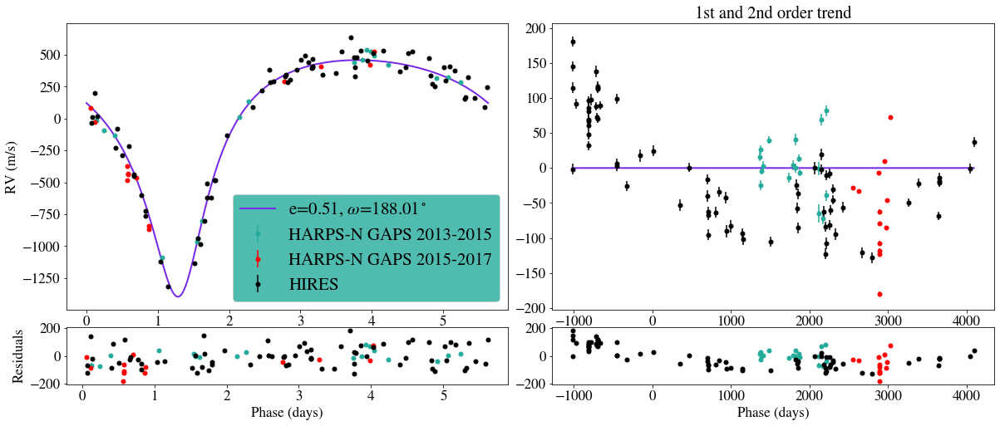

In [39]:
#fair_draws_plot(time_np, rv_np, s_rv_np, out, 100, 10, instrument, time_chunk, eval_method)

#np.shape(out.get_chains(nthin =5, nburnin = nburnin, flat=True))

wobble = wobble_edmcmc_ttv.wobble_edmcmc(time_np, rv_np, s_rv_np,labels,
                                    M1, nwalkers, nlinks, nburnin,nfree_params, ncores=num_cpus_to_use,
                                    w_Mp=w_Mp, w_K=w_K, w_logP=w_logP, w_tp=w_tp, w_e=w_e, w_om=w_om, w_D1=w_D1,w_D2=w_D2, w_D3=w_D3,
                                    w_jit1=w_jit1, w_jit2=w_jit2, w_jit3=w_jit3,
                                    w_lin = w_lin, w_quad = w_quad, 
                                    K=K, Mp=Mp, logP=logP, tp=tp, e0=e0,jit1=jit1, jit2=jit2, jit3=jit3,
                                    D1=D1, D2 = D2, D3=D3,
                                    om0=om0,lin=lin, quad=quad,
                                    pr_Mp=pr_Mp, pr_logP = pr_logP,pr_tp = pr_tp,pr_e=pr_e, pr_D1=pr_D1, pr_D2=pr_D2,  pr_D3=pr_D3, 
                                    pr_jit1=pr_jit1, pr_jit2=pr_jit2, pr_jit3=pr_jit3, 
                                    pr_om=pr_om,
                                    telescopes = instrument, phase_plot =0.15,
                                    gausspriors =gausspriors, gauss_theta_indexes=gauss_theta_indexes,
                                    gauss_theta_priors=gauss_theta_priors, gauss_theta_err=gauss_theta_err,
                                    use_mass_parametrization = use_mass_parametrization)

df1, df2 = wobble.initial_guess_plot()
#np.unique(wobble.telescopes)
wobble.width

In [40]:
theta = wobble.theta
wobble.loglikelihood(theta, time_np, rv_np, s_rv_np, nfree_params)[1]

2.878205472764424

In [41]:
# Run mcmc
out = wobble.wobble_mcmc()

# write results to file

# create a folder and file structure based on eval_method and date_time
date = datetime.today()#.isoformat()
dir_day = "Results/csvs_"+date.strftime("%y_%m_%d")

# check if directory exists. Otherwise, create directory
if not os.path.isdir(dir_day):
    os.mkdir(dir_day)
    
if use_mass_parametrization:
    extra_file_name = "mass_parametrization_"
else:
    extra_file_name = "K_parametization_"

if freeze_jitter:
    time_name = date.strftime("%H_%M_%S%p")   
    csv_name = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+".csv"
    csv_name_p = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.csv"
    npz_name_chains = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_chains.npz"
    pdf_name = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+".pdf"
    png_name = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+".png"
    png_name_p = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.png"
    signif_name_p = dir_day+"/signif_"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.png"
else:
    time_name = date.strftime("%H_%M_%S%p")   
    csv_name = dir_day+"/"+eval_method+" "+extra_file_name+time_name+".csv"
    csv_name_p = dir_day+"/"+eval_method+" "+extra_file_name+time_name+"_PAPER.csv"
    npz_name_chains = dir_day+"/"+eval_method+" "+extra_file_name+time_name+"_chains.npz"
    pdf_name = dir_day+"/"+eval_method+" "+extra_file_name+time_name+".pdf"
    png_name = dir_day+"/"+eval_method+" "+extra_file_name+time_name+".png"
    png_name_p = dir_day+"/"+eval_method+" "+extra_file_name+time_name+"_PAPER.png"
    signif_name_p = dir_day+"/signif_"+eval_method+" "+extra_file_name+time_name+"_PAPER.png"

Process ForkPoolWorker-13:


Process ForkPoolWorker-15:
Traceback (most recent call last):
Process ForkPoolWorker-16:
Process ForkPoolWorker-17:
Process ForkPoolWorker-19:
Process ForkPoolWorker-18:
Process ForkPoolWorker-14:


KeyboardInterrupt: 

Traceback (most recent call last):
  File "/Users/zdebeurs/opt/anaconda3/lib/python3.9/site-packages/multiprocess/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/zdebeurs/opt/anaconda3/lib/python3.9/site-packages/multiprocess/process.py", line 315, in _bootstrap
    self.run()
Traceback (most recent call last):
Traceback (most recent call last):
  File "/Users/zdebeurs/opt/anaconda3/lib/python3.9/site-packages/multiprocess/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
Traceback (most recent call last):
Traceback (most recent call last):
  File "/Users/zdebeurs/opt/anaconda3/lib/python3.9/site-packages/multiprocess/process.py", line 315, in _bootstrap
    self.run()
  File "/Users/zdebeurs/opt/anaconda3/lib/python3.9/site-packages/multiprocess/process.py", line 108, in run
    self._target(*self._args, **self._kwargs)
Traceback (most recent call last):
  File "/Users/zdebeurs/opt/anaconda3/lib/python3.9/site-packages/multiprocess/process.

  File "/Users/zdebeurs/opt/anaconda3/lib/python3.9/pickle.py", line 560, in save
    f(self, obj)  # Call unbound method with explicit self
  File "/Users/zdebeurs/opt/anaconda3/lib/python3.9/site-packages/pandas/core/ops/array_ops.py", line 283, in comparison_op
    res_values = comp_method_OBJECT_ARRAY(op, lvalues, rvalues)
  File "/Users/zdebeurs/opt/anaconda3/lib/python3.9/site-packages/pandas/core/series.py", line 3017, in _construct_result
    out = self._constructor(result, index=self.index)
  File "/Users/zdebeurs/opt/anaconda3/lib/python3.9/site-packages/pandas/core/ops/array_ops.py", line 73, in comp_method_OBJECT_ARRAY
    result = libops.scalar_compare(x.ravel(), y, op)
  File "/Users/zdebeurs/opt/anaconda3/lib/python3.9/pickle.py", line 886, in save_tuple
    save(element)
KeyboardInterrupt
  File "/Users/zdebeurs/opt/anaconda3/lib/python3.9/site-packages/pandas/core/series.py", line 459, in __init__
    NDFrame.__init__(self, data)
  File "/Users/zdebeurs/opt/anaconda3/l

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

_____________________________


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

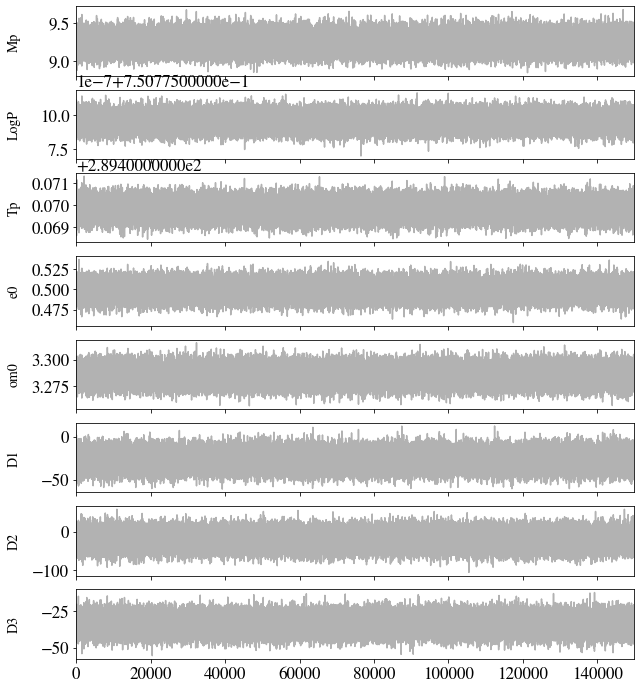

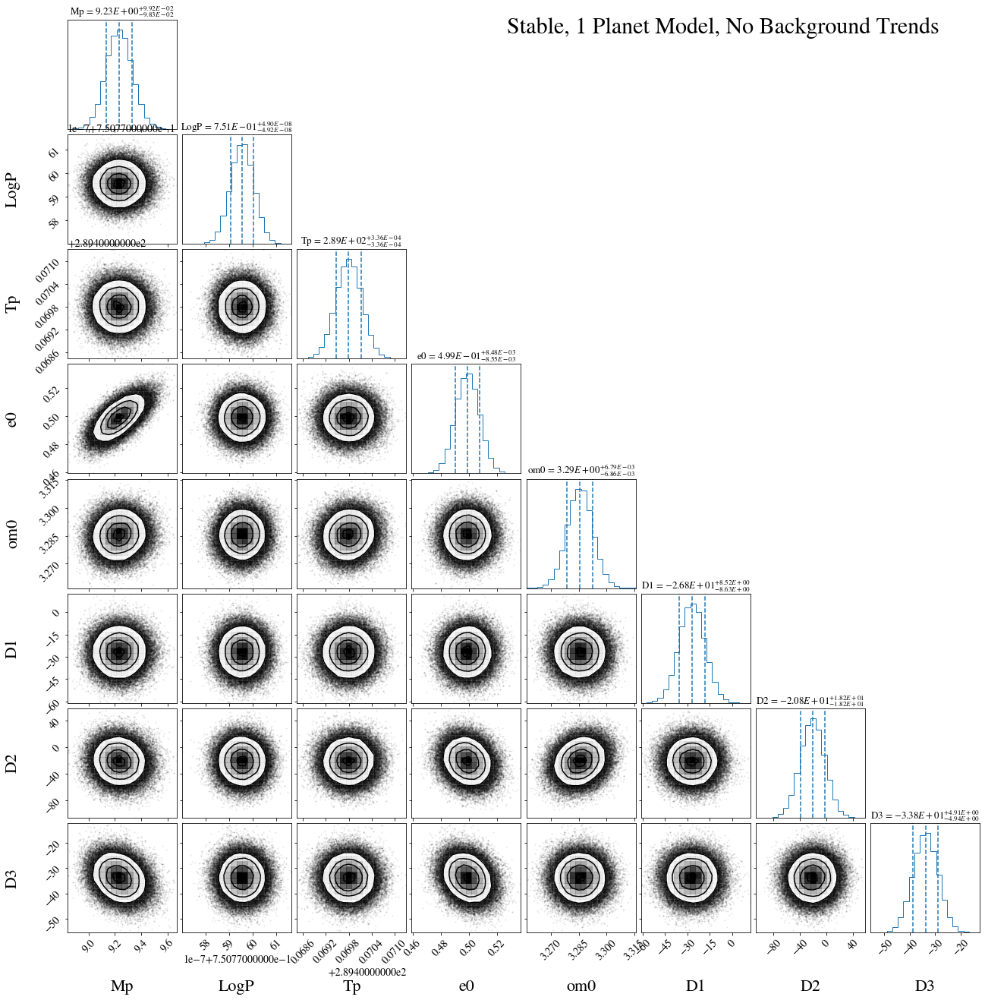

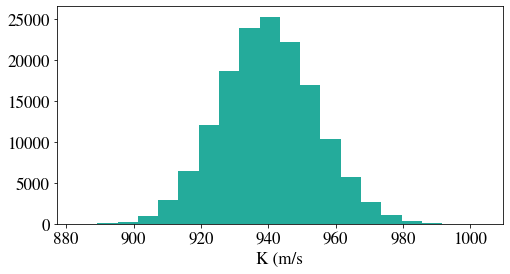

0.4989904144880183 3.2856916865427355


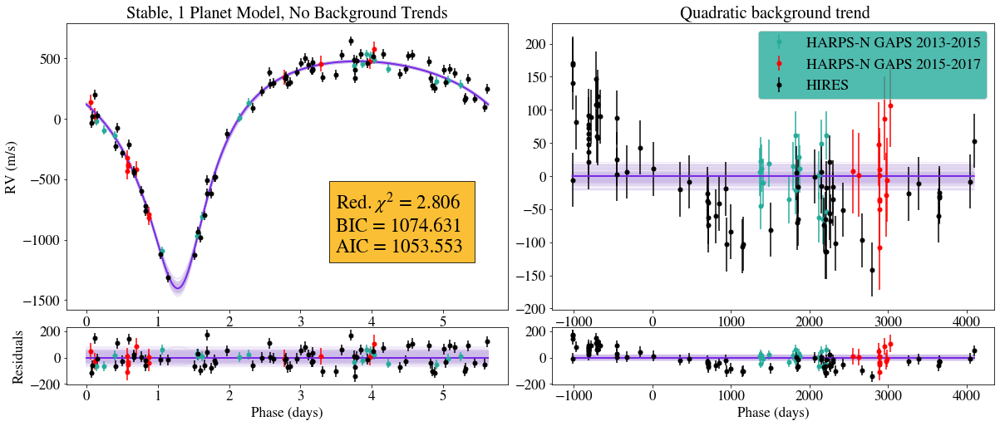

0.4989904144880183 3.2856916865427355


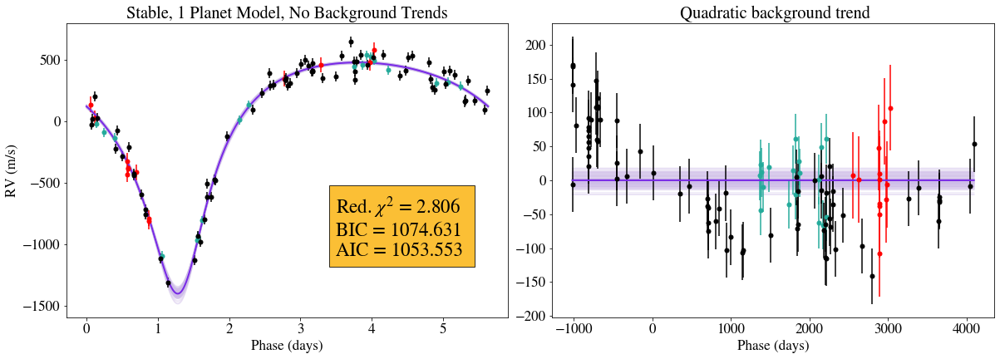

In [138]:
# retrieve eval metrics
loglikelihood, chisq, AIC, BIC, gelman_values, gelman_labels, om_list, e_list, sigma2, chisq_k, K_list, K2_list = wobble.metrics(out, nburnin)
print("_____________________________")

# Display mcmc 16th, 50th, and 86th percentiles AND write results to a file
df, varying_labels, varying_chains_np, df_p = display_mcmc_percentiles(out, labels, nburnin, loglikelihood, chisq_k, AIC, BIC, gelman_values, gelman_labels, 
                         eval_method,csv_name, csv_name_p)

# Save the mcmc results such that plots can be made later with the mcmc samples
flat_samples = out.get_chains(nthin =5, nburnin = nburnin, flat=True)
np.savez(npz_name_chains,
        flat_samples=flat_samples)

# Save Figures into pdf file
with PdfPages(pdf_name) as pdf: 

    # plot chains. Set varying_only=True to only display varying params
    chains_plot(out, labels, nburnin, varying_only=True)
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()
    
    # produce corner plots. Specify label_indexes to only plot a subset of varying params.
    #label_indexes = [0,1,2]
    if corner:
        corner_plot(out, nburnin, labels, eval_method)#, label_indexes)
        pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
        plt.show()
        plt.close()
    
    # Plot a histogram of planet mass(es)
    K1 = K_hist(out, nburnin)
    K1
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()
    
    time_chunk = ""
    fair_draws_plot(time_np, rv_np, s_rv_np, out, 100, 10, instrument, time_chunk, eval_method, phase_plot=0.15,
                    legendfontsize=18, chisq=chisq_k, BIC=BIC, AIC=AIC, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig()  # saves the current figure into a pdf page
    plt.savefig(png_name)
    plt.show()
    plt.close()
    
    time_chunk = ""
    fair_draws_plot(time_np, rv_np, s_rv_np, out, 100, 10, instrument, time_chunk, eval_method, phase_plot=0.15,
                   residuals=False, legendfontsize=18, chisq=chisq_k, BIC=BIC, AIC=AIC, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig()  # saves the current figure into a pdf page
    plt.savefig(png_name_p)
    plt.show()
    plt.close()



Text(0.5, 0, '$M_p$ ($M_j$)')

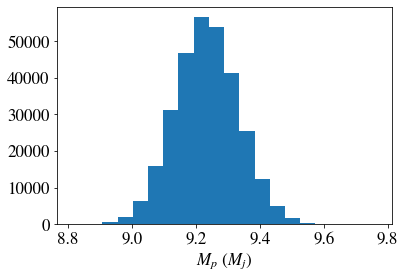

In [14]:
plt.hist(flat_samples.T[0], bins=20)
plt.xlabel(r"$M_p$ ($M_j$)")

<a id='2planet_stable'></a>
## Modular Stable Orbit Model, 2 Planet Model (2nd companion = Keplerian)

In [10]:
single_instrument = False
if single_instrument == True:

    # Optional. Only select one instrument
    df_used = df_used[df_used["instrument_merged"]=="HIRES"]
    df_used

    # format data for mcmc fit
    rv_np = np.array(list(df_used["mnvel_merged"]-np.mean(df_used["mnvel_merged"])))
    s_rv_np = np.array(list(df_used["errvel_merged"]))
    time_np = np.array(df_used["bjd_merged"])-min_time_sub#-np.min(df_used["bjd_merged"])
    time_min = np.min(df_used["bjd_merged"])
    time_np_plus_min = time_np+time_min
    instrument = df_used["instrument_merged"]
    
df_used, np.unique(df_used["instrument_merged"])

(       bjd_merged  mnvel_merged  errvel_merged  svalue_merged  \
 0    2.453982e+06    -30.097458       7.779639         0.1940   
 1    2.453983e+06   -324.109256       7.003154         0.1900   
 2    2.453984e+06    479.981040       7.503201         0.1910   
 3    2.453985e+06    826.893013       7.308160         0.1780   
 4    2.454024e+06    684.765442       7.514108         0.1930   
 ..            ...           ...            ...            ...   
 98   2.458649e+06    586.108263       6.544405         0.1949   
 99   2.458649e+06    588.855060       6.728044         0.1942   
 100  2.458649e+06    594.181109       6.208573         0.1940   
 101  2.459043e+06    534.451073       7.187874         0.1936   
 102  2.459093e+06     58.626849       7.349805         0.1967   
 
     instrument_merged  
 0               HIRES  
 1               HIRES  
 2               HIRES  
 3               HIRES  
 4               HIRES  
 ..                ...  
 98              HIRES  
 99   

In [11]:
# Change this
num_instr = len(np.unique(instrument))
if num_instr ==1:
    eval_method = "Stable, 2 Planet Model, %.f Instrument(s)"%num_instr
else:
     eval_method = "Stable, 2 Planet Model"
    
#freeze_jitter = True
use_mass_parametrization = True # False

# Set fixed params 
#jitterpar = 40#80#41.808
M1 = 1.34 # Msolar
nwalkers = 200
#nlinks = 1000#3000 #0
#nburnin = 800#2000#1000#00

# params that go into theta
K = 919.2038402526844#925.6799325047316
Mp = 9.007#9.021
logP =np.log10(5.63346961) # Ivshina & Winn 2022 # 0.7507755352581353#np.log10(5.633473128700384)
e0 = 0.5005 # 0.4980169926340284#0.5058640617808413 #0.52
om0 = 188.01*(np.pi/180) #(Ment et al 2018) #187.890*(np.pi/180)#3.280893202442646
tp =  get_periastron_time(5.63346961, om0, e0, 2455288.84910)-min_time_sub#
#tp =  get_periastron_time(5.63346961, om0, e0, 2455756.42709)-min_time_sub#2463982.4915-min_time_sub-0.5#(Ment et al 2018) #get_periastron_time(10**logP, om0, e0, 2455288.84969-min_time_sub)#288.0376218364072-0.11 #289.9##-0.2#289.7#-2# -1.8#-0.1# 288.1-0.2#

K2 = 94.54200841836193#100
Mp2 = 10.7
logP2 = 3.880863601614623#np.log10(5249.345671)
tp2 = 2454150 - min_time_sub #-1000#-74.73223860395828-min_time_sub#-9.57589212e+01
e02 =  0.37#0.3052418939102423#0.5
om02 = 38*(np.pi/180)#0.35552277312944597#-0.1

extra_offset = -40#50
D1 = 46.355709021875086+extra_offset#152.8624732#-20 #120#-35#-5#25.48987114398128
D2 = 35.698511504884095+extra_offset#-100 
D3 = -22.67212060096864+extra_offset#0
#jit1 = 38.62723780659935#40
#jit2 = 64.52246373390295#40
#jit3 = 40.58

# jit1 = 37.45343836780902#40
# jit2 = 68.41894749724969#40
# jit3 = 37.28477499406473#40

#jit1 = 36.55859407372054#38.33785541106814
#jit2 = 71.19850356700195#64.06138479584696
#jit3 = 37.12727298608082#40.684212702777955

lin = 0#-0.12012280074458673#-1.1e-1
quad = 0#2.008e-05 #2.0065437331192983e-05#2e-5


# REDEFINE ALL VARIABLES BASED on evolving, 2 planet model (where 2nd companion = Keplerian)
Mp = 9.02935788756908
LogP = 0.7507759581488365
tp = 289.4864308197888
e0 = 0.502441925097167
#de/dt 0.0
om0 = 3.2953818319870027
#dom/dt 0.0
#de^2/dt^2 0.0
#dom^2/dt^2 0.0
Mp2 = 11.670610433030248
logP2 = 3.9433739494104723
tp2 =  -906.7724045323704
e02 =  0.34442390759665753
#de/dt_2 0.0
om02 =  0.7571056193281251
#dom/dt_2 0.0
D1 = 46.565143216653134
D2 = 42.11193803074988
D3 = -20.37942842595474
#jit1 35.62
#jit2 63.34
#jit3 40.03
lin = 0.0
quad = 0.0


#theta =  np.array([K,logP, tp, e0, om0, D1,D2,D3, lin, quad])

# priors
pr_K=[800,1300]
pr_Mp = [Mp-1, Mp+1]
pr_logP=[0, np.log10(10)]
pr_tp=[tp-1.5, tp+1.5]
pr_e=[0.2,0.7]
pr_D1=[-500, 500]
pr_D2 = [-500, 500]
pr_D3 = [np.nan, np.nan]
pr_jit1 = [0,100]
pr_jit2 = [0,100]
pr_jit3 = [0,100]
pr_om=[0, 6.28]

pr_K2 = [0, 200]#[89-13, 89+39]
pr_Mp2 = [Mp2-6, Mp2+6]
pr_logP2 = [np.log10(8500-1500), np.log10(8500+2600)]#[np.log10(4000), np.log10(9000)]#[np.log10(4000), np.log10(6000)]

pr_e2 = [e02-0.15, e02+0.15]
pr_om2 = [om02-32*(np.pi/180), om02+32*(np.pi/180)]
pr_tp2 = [tp2-800, tp2+430]


# gauss priors
gausspriors =True      #P, tp, D1, 'jit1', 'lin', 'quad'
gauss_theta_indexes = [1,2, 10, 12]#[1,2, 11, 12]#, 16, 19, 22, 23]#, 3]
#gauss_theta_priors =[5.63346961, tp, tp2, e02]#, D1, jit1, lin, quad]#, e0]#, 0.50833] # Ivshina & Winn 2022, Bonomo et al. 2017
#gauss_theta_err = [6.4e-07,3.4e-4, 800, 0.13]#, 1.076e+01, 4.371e+00, 1.883e-02, 5.574e-06]#, 4.2e-4] #8.2e-4 Ivshina & Winn 2022, de Wit et al. 2017, Bonomo et al. 2017
gauss_theta_priors =[5.63346961, tp, logP2, e02]#, D1, jit1, lin, quad]#, e0]#, 0.50833] # Ivshina & Winn 2022, Bonomo et al. 2017
gauss_theta_err = [6.4e-07,3.4e-4, np.log10(2600), 0.13]

# widths
w_K=15.29315435493163#0.01*
w_Mp = 0.01*Mp
w_logP =1.5523555112473275e-06#0.1*10**(logP)*1e-5#np.log10(5e-5)
w_tp = 2e-6#0.012318579226075599#2e-6#1e-3
w_e = 2e-2#0.009579965578327132#0.02
w_om = 5e-2#0.01656866857696837#0.01#5e-3
w_lin=0#1e-2 #0
w_quad=0#1e-5 #0
w_D1 = 25.427521293478364#5#7
# Define withd of offsets based on instrument number
w_jit1 = 9.09600859442638#5

if num_instr ==1:
    w_D2 = 0
    w_D3 = 0
    w_jit2 = 0
    w_jit3 = 0
elif num_instr ==2:
    w_D2 = 30.30606192151322#5
    w_D3 = 0
    w_jit2 = 15.510732183544008#5
    w_jit3 = 0
else:
    w_D2 = 30.30606192151322#5
    w_D3 = 22.931532430320487#5
    w_jit2 = 15.510732183544008#5
    w_jit3 = 4.256#5
    
    
if freeze_jitter:
    #jit1 = 35.15721038710301
    #jit2 = 62.63228448817992
    #jit3 = 40.76037629904555
    w_jit1 = 0
    w_jit2 = 0
    w_jit3 = 0

w_K2 = 39.25617419423416#10
w_Mp2 = 0.01*Mp2
w_logP2 = 0.07089260356469129#np.log10(1e-5)
w_tp2 = 100#750.3129542923062#1e-2
w_e2 =  2e-2#0.12132846588859841#0.02#0.005
w_om2 = 2e-2 #0.5894181692820075#1e-2

widths = np.array([w_Mp, w_logP, w_tp, w_e, w_om, w_lin, w_quad, w_D1, w_D2, w_D3, w_jit1, w_jit2, w_jit3,
         w_Mp2, w_logP2, w_tp2, w_e2, w_om2])

nfree_params = len(widths[np.nonzero(widths)])

print("widths:",[w_K, w_D1, 10**w_logP, w_tp, w_e, w_om, w_K2, 10**w_logP2, w_tp2, w_e2, w_om2])


if use_mass_parametrization:
    labels = ["Mp", "LogP", "Tp", "e0", "de/dt","om0","dom/dt","de^2/dt^2", "dom^2/dt^2",
          "Mp2", "LogP2", "Tp2", "e02", "de/dt_2","om02","dom/dt_2",
          "D1","D2","D3", "jit1","jit2","jit3","lin", "quad"]
else:
    labels = ["Amplitude", "LogP", "Tp", "e0", "de/dt","om0","dom/dt","de^2/dt^2", "dom^2/dt^2",
          "Amplitude2", "LogP2", "Tp2", "e02", "de/dt_2","om02","dom/dt_2",
          "D1","D2","D3", "jit1","jit2","jit3","lin", "quad"]

nfree_params
labels[11]

widths: [15.29315435493163, 25.427521293478364, 1.0000035744370475, 2e-06, 0.02, 0.05, 39.25617419423416, 1.1773148000132432, 100, 0.02, 0.02]


'Tp2'

In [12]:
labels[10]

'LogP2'

In [13]:
Mp2

11.670610433030248

[-1018.221759 -1018.121759 -1018.021759 ...  4092.478241  4092.578241
  4092.678241]
[-1018.221759 -1018.121759 -1018.021759 ...  4092.478241  4092.578241
  4092.678241]
1.0938850966746256
Mp 9.02935788756908
LogP 0.7507759558387136
Tp 289.4864308197888
e0 0.502441925097167
de/dt 0
om0 3.2953818319870027
dom/dt 0
de^2/dt^2 0
dom^2/dt^2 0
Mp2 11.670610433030248
LogP2 3.9433739494104723
Tp2 -906.7724045323704
e02 0.34442390759665753
de/dt_2 0
om02 0.7571056193281251
dom/dt_2 0
D1 46.565143216653134
D2 42.11193803074988
D3 -20.37942842595474
jit1 35.62
jit2 63.34
jit3 40.03
lin 0.0
quad 0.0


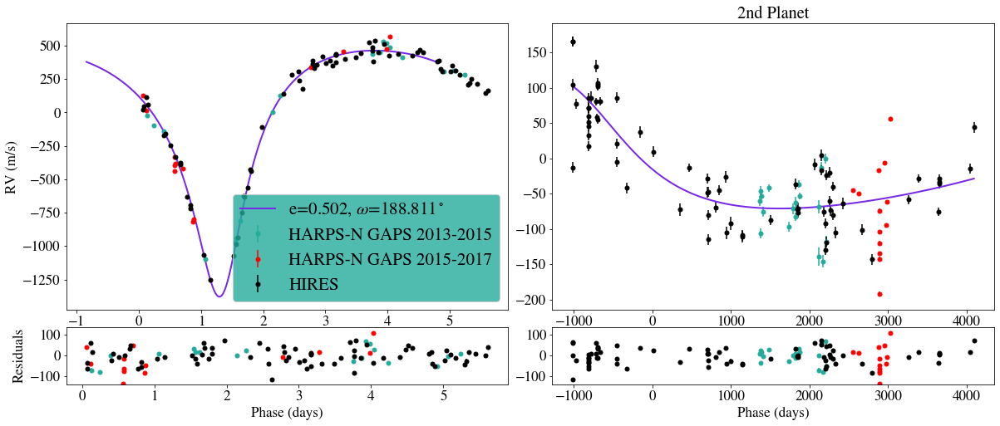

In [14]:
wobble = wobble_edmcmc_ttv.wobble_edmcmc(time_np, rv_np, s_rv_np,labels,
                                    M1, nwalkers, nlinks, nburnin,nfree_params, ncores=num_cpus_to_use,
                                    w_Mp=w_Mp, w_logP=w_logP, w_tp=w_tp, w_e=w_e, w_om=w_om, 
                                    w_Mp2=w_Mp2, w_logP2=w_logP2, w_tp2=w_tp2, w_e2=w_e2, w_om2=w_om2,
                                    w_jit1 = w_jit1, w_jit2= w_jit2,w_jit3=w_jit3, w_D1=w_D1, w_D2 =w_D2, w_D3 = w_D3,
                                    w_lin = w_lin, w_quad = w_quad, 
                                    K=K, Mp=Mp, logP=logP, tp=tp, e0=e0, om0=om0,
                                    Mp2 = Mp2, logP2=logP2, tp2=tp2, e02=e02, om02=om02,
                                    jit1 = jit1, jit2=jit2, jit3=jit3, D1=D1, D2=D2, D3=D3,
                                    lin=lin, quad=quad,
                                    pr_Mp=pr_Mp, pr_logP = pr_logP,pr_tp = pr_tp,pr_e=pr_e, pr_om=pr_om,
                                    pr_Mp2=pr_Mp2, pr_logP2=pr_logP2, pr_e2=pr_e2, pr_om2=pr_om2, pr_tp2=pr_tp2,
                                    pr_jit1 = pr_jit1, pr_jit2 = pr_jit2, pr_jit3 = pr_jit3,pr_D1=pr_D1, 
                                    pr_D2= pr_D2, pr_D3 = pr_D3,
                                    telescopes = instrument, phase_plot =0.15,
                                    gausspriors=gausspriors, gauss_theta_indexes=gauss_theta_indexes,
                                    gauss_theta_priors=gauss_theta_priors, gauss_theta_err=gauss_theta_err,
                                    use_mass_parametrization=use_mass_parametrization)
df_di_sorted, df_ti_sorted2 = wobble.initial_guess_plot()

theta = wobble.theta
print(wobble.loglikelihood(theta, time_np, rv_np, s_rv_np, nfree_params)[-4])

for i in range(0, len(theta)):
    #print(labels[i], theta_mcmc[i], theta[i])
    print(labels[i], theta[i])



In [15]:
# Run mcmc
out = wobble.wobble_mcmc()

# write results to file

# create a folder and file structure based on eval_method and date_time
date = datetime.today()#.isoformat()
dir_day = "Results/csvs_"+date.strftime("%y_%m_%d")

# check if directory exists. Otherwise, create directory
if not os.path.isdir(dir_day):
    os.mkdir(dir_day)
    
if use_mass_parametrization:
    extra_file_name = "mass_parametrization_"
else:
    extra_file_name = "K_parametization_"
    
if freeze_jitter:
    time_name = date.strftime("%H_%M_%S%p")   
    csv_name = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+".csv"
    csv_name_p = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.csv"
    csv_name_p_signif = dir_day+"/Signif_"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.csv"
    npz_name_chains = dir_day+"/"+eval_method+"freeze_jitter"+extra_file_name+time_name+"_chains.npz"
    pdf_name = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+".pdf"
    png_name = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+".png"
    png_name_p = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.png"  
    signif_name_p = dir_day+"/signif_"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.png"
else:
    time_name = date.strftime("%H_%M_%S%p")   
    csv_name = dir_day+"/"+eval_method+" "+extra_file_name+time_name+".csv"
    csv_name_p = dir_day+"/"+eval_method+" "+extra_file_name+time_name+"_PAPER.csv"
    csv_name_p_signif = dir_day+"/Signif_"+eval_method+" "+extra_file_name+time_name+"_PAPER.csv"
    npz_name_chains = dir_day+"/"+eval_method+" "+extra_file_name+time_name+"_chains.npz"
    pdf_name = dir_day+"/"+eval_method+" "+extra_file_name+time_name+".pdf"
    png_name = dir_day+"/"+eval_method+" "+extra_file_name+time_name+".png"
    png_name_p = dir_day+"/"+eval_method+" "+extra_file_name+time_name+"_PAPER.png"
    signif_name_p = dir_day+"/signif_"+eval_method+" "+extra_file_name+time_name+"_PAPER.png"

0 days, 00:00:00.0 remains. Link 5000 of 5000. Acceptance rate = 0.19
9.032725852861642 +/- 0.10112194890240504 ;     0.7507759554262591 +/- 4.926597328546375e-08


In [16]:
theta_priors = wobble.theta_priors
theta = wobble.theta

def log_prior(theta, theta_priors):
    logprior = 0
    
    # check which priors are not NaNs
    indexes = np.where(np.isnan(np.array(theta_priors)[:,0])==False)[0]
    
    # Check priors for those indexes
    for i in indexes:
        #print(i)
        if theta_priors[i][0]<theta[i]<theta_priors[i][1]:
            #print(theta_priors[0][i][0],theta[0][i],theta_priors[0][i][1])
            logprior += 0.0
        else:
            print(theta_priors[i][0],theta[i],theta_priors[i][1])
            logprior += -np.inf

    return logprior

log_prior(theta, theta_priors)

0.0

In [19]:
plt.rcParams['font.size'] =17

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

_____________________________


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

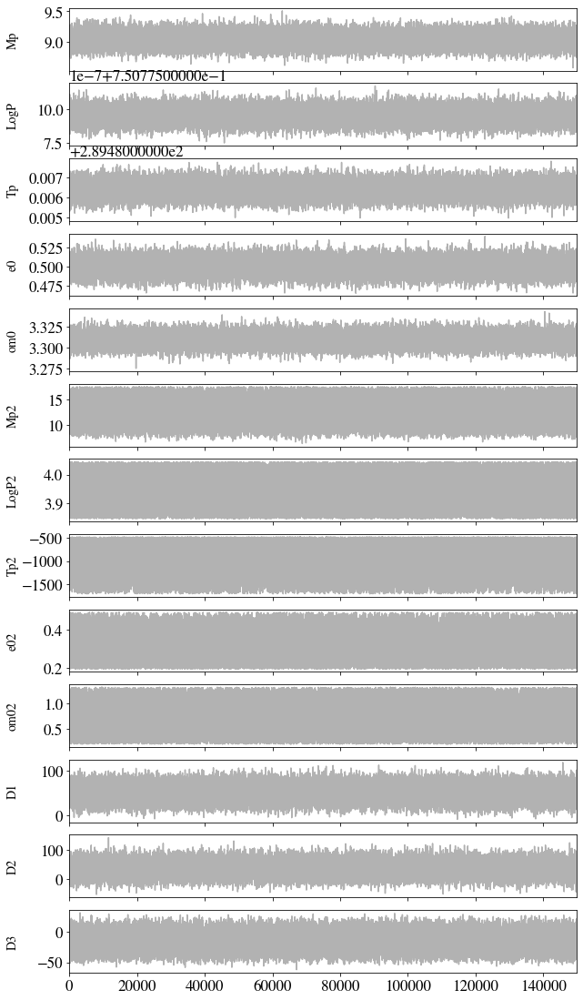

0.5002681085047997 3.3095141312866634


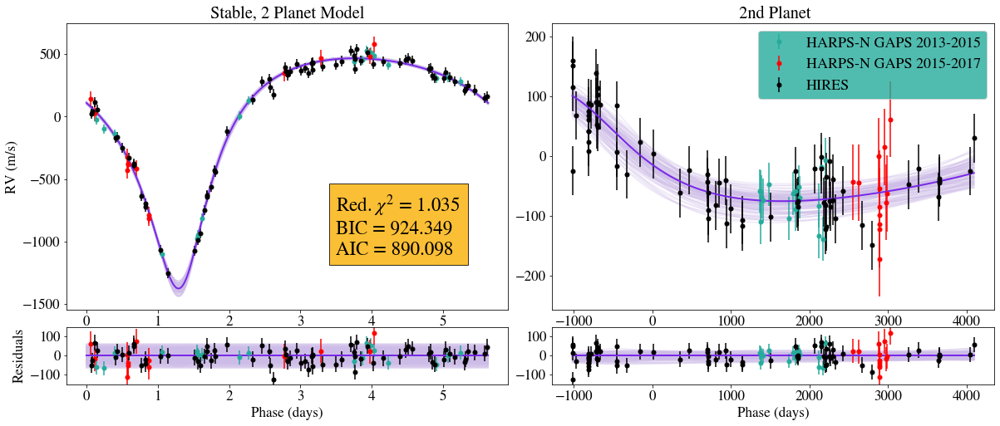

0.5002681085047997 3.3095141312866634


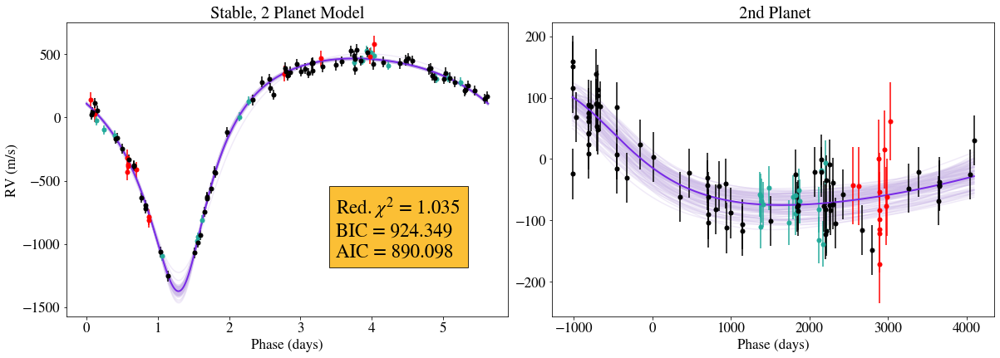

(array([931.77623067, 931.77623067, 908.29771903, ..., 924.40820462,
       917.65197819, 944.22341791]), 0)


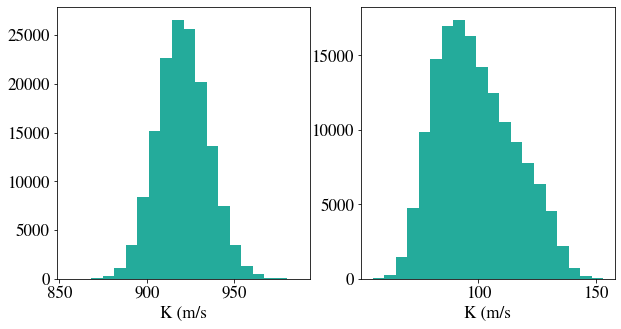

In [20]:
#nburnin = 2000

corner_plot_make = False

# retrieve eval metrics
loglikelihood, chisq, AIC, BIC, gelman_values, gelman_labels, om_list, e_list, sigma1, chisq_k, K_list, K2_list = wobble.metrics(out, nburnin)
print("_____________________________")

# Display mcmc 16th, 50th, and 86th percentiles AND write results to a file
df, varying_labels, varying_chains_np, df_p = display_mcmc_percentiles(out, labels, nburnin, loglikelihood, chisq_k, AIC, BIC, gelman_values, gelman_labels, 
                         eval_method,csv_name, csv_name_p)

# Save the mcmc results such that plots can be made later with the mcmc samples
flat_samples = out.get_chains(nthin =5, nburnin = nburnin, flat=True)

np.savez(npz_name_chains,
        flat_samples=flat_samples)

# Save Figures into pdf file
with PdfPages(pdf_name) as pdf:

    # plot chains. Set varying_only=True to only display varying params
    chains_plot(out, labels, nburnin, varying_only=True)
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()
    
    # make phase_folded plot
    time_chunk = ""
    fair_draws_plot(time_np, rv_np, s_rv_np, out, 100, 10, instrument, time_chunk, eval_method, phase_plot=0.15,
                    legendfontsize=18, chisq=chisq_k, BIC=BIC, AIC=AIC, err_inflate=True, use_mass_parametrization=True)
    plt.savefig(png_name)
    pdf.savefig()  # saves the current figure into a pdf page
    plt.show()
    plt.close()
    
    # make fair draws plot without residuals
    time_chunk = ""
    fair_draws_plot(time_np, rv_np, s_rv_np, out, 100, 10, instrument, time_chunk, eval_method, phase_plot=0.15,
                   residuals=False,
                   legendfontsize=18, chisq=chisq_k, BIC=BIC, AIC=AIC, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig()  # saves the current figure into a pdf page
    plt.savefig(png_name_p)
    plt.show()
    plt.close()
    
    # Plot a histogram of planet mass(es)
    K1 = K_hist(out, nburnin)
    K1
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()
    
    
    # produce corner plots. Specify label_indexes to only plot a subset of varying params.
    #label_indexes = [0,1,2]
    if corner_plot_make:
        corner_plot(out, nburnin, labels, eval_method)#, label_indexes)
        pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
        plt.show()
        plt.close()

In [18]:
theta_mcmc = np.percentile(flat_samples.T, 50, axis=1)

# set de/dt = 0 and dom/dt=0
#theta_mcmc[4] =0
#theta_mcmc[6] =0

wobble.loglikelihood(theta_mcmc, time_np, rv_np, s_rv_np, nfree_params)[-4]
for i in range(0, len(theta_mcmc)):
    print(labels[i], theta_mcmc[i], theta[i])
    
theta_mod = theta_mcmc.copy()
wobble.loglikelihood(theta_mod, time_np, rv_np, s_rv_np, nfree_params)[-4], wobble.loglikelihood(theta_mod, time_np, rv_np, s_rv_np, nfree_params)[2]

Mp 9.032576426192765 9.02935788756908
LogP 0.7507759554845707 0.7507759558387136
Tp 289.48641998664993 289.4864308197888
e0 0.5002687805078199 0.502441925097167
de/dt 0.0 0
om0 3.309536656444694 3.2953818319870027
dom/dt 0.0 0
de^2/dt^2 0.0 0
dom^2/dt^2 0.0 0
Mp2 12.101248076292952 11.670610433030248
LogP2 3.940552659086286 3.9433739494104723
Tp2 -909.2224405437659 -906.7724045323704
e02 0.3129144784083346 0.34442390759665753
de/dt_2 0.0 0
om02 0.7730211112085319 0.7571056193281251
dom/dt_2 0.0 0
D1 50.842550511236205 46.565143216653134
D2 35.35462958926929 42.11193803074988
D3 -17.041505224441266 -20.37942842595474
jit1 35.62 35.62
jit2 63.34 63.34
jit3 40.03 40.03
lin 0.0 0.0
quad 0.0 0.0


(1.0347427572947567, 890.0977014316964)

In [23]:
theta_mcmc[5]*180/np.pi

189.6224825581189

<a id='1planet_evolving'></a>
## 1 Planet Model, evolving orbit model for primary

In [169]:
# Re-Load 5 RV datasets without RM measurements

# open npz file
outfile = 'data/Five_RV_datasets.npz'#'NEW_DRS2_3_1_10s_norm.npz'

min_time_sub = 2455000#3980

npzfile = np.load(outfile, allow_pickle=True)
npzfile.files

data = {npzfile.files[0]: npzfile[npzfile.files[0]],
       npzfile.files[1]: npzfile[npzfile.files[1]],
       npzfile.files[2]: npzfile[npzfile.files[2]],
       npzfile.files[3]: npzfile[npzfile.files[3]],
       npzfile.files[4]: npzfile[npzfile.files[4]]}
df_used = pd.DataFrame(data=data)
df_used.head(10)
df_used = df_used[df_used['instrument_merged']!="Lick"][df_used['instrument_merged']!="SOPHIE"]
df_used = df_used.reset_index(drop=True)
df_used = df_used.sort_values(by=['bjd_merged']).reset_index(drop=True)
print(np.unique(df_used['instrument_merged']))


# format data for mcmc fit
rv_np = np.array(list(df_used["mnvel_merged"]-np.mean(df_used["mnvel_merged"])))
s_rv_np = np.array(list(df_used["errvel_merged"]))
time_np = np.array(df_used["bjd_merged"])-min_time_sub#-np.min(df_used["bjd_merged"])
time_min = np.min(df_used["bjd_merged"])
time_np_plus_min = time_np+time_min
instrument = df_used["instrument_merged"]

['HARPS-N GAPS 2013-2015' 'HARPS-N GAPS 2015-2017' 'HIRES']


In [170]:
# CHANGE THIS
num_instr = len(np.unique(instrument))
eval_method = "Evolving, 1 Planet Model"#, "+str(num_instr)+" Instruments"
#freeze_jitter = True
tp_288 = False#True
use_mass_parametrization = True # False

#if tp_288:
#    eval_method = "Evolving, 2 Planets Model, T_p=288 "+str(num_instr)+" Instruments"

# Set fixed params 
jitterpar = 40#80#41.808
M1 = 1.34 # Msolar
nwalkers = 200
nlinks = 4000#4000#5000#7000#5000#2000 #0
nburnin = 3000#4000#5000#4000#500#1000#00

# params that go into theta
K = 932.3
Mp = 9.021
logP = np.log10(5.633473128700384)
e0 = 0.5005 #0.52
de_dt = 4.419e-6
dom_dt = 2e-6
om0 = 188.01*(np.pi/180) #(Ment et al 2018) #187.890*(np.pi/180)#3.280893202442646
#tp =  get_periastron_time(5.63346961, om0, e0, 2455756.42709)-min_time_sub#2463982.4915-min_time_sub-0.5#(Ment et al 2018) #get_periastron_time(10**logP, om0, e0, 2455288.84969-min_time_sub)#288.0376218364072-0.11 #289.9##-0.2#289.7#-2# -1.8#-0.1# 288.1-0.2#
tp =  get_periastron_time(5.63346961, om0, e0, 2455288.84910)-min_time_sub#2463982.4915-min_time_sub-0.5#(Ment et al 2018) #get_periastron_time(10**logP, om0, e0, 2455288.84969-min_time_sub)#288.0376218364072-0.11 #289.9##-0.2#289.7#-2# -1.8#-0.1# 288.1-0.2#


if tp_288:
    tp =  get_periastron_time(5.63346961, om0, e0, 2455288.84910)-min_time_sub#2463982.4915-min_time_sub-0.5#(Ment et al 2018) #get_periastron_time(10**logP, om0, e0, 2455288.84969-min_time_sub)#288.0376218364072-0.11 #289.9##-0.2#289.7#-2# -1.8#-0.1# 288.1-0.2#


#eval_method += ", tp = %.2f"%tp
extra_offset = -100  
D1 = 69+50 + extra_offset #69.48684878396841+70#140.88431672328488#1.485e2#152.86247321588866 #120#-35#-5#25.48987114398128
D2 = 129.56572438802945 + extra_offset   #1.386e2#+120
D3 = 69.48684878396841 + extra_offset  #7.685e1#70

if num_instr==1:
    D1 = 69-50

#D1=1.485𝑒+021.680𝑒+01−1.685𝑒+01
#D2=1.386𝑒+022.367𝑒+01−2.387𝑒+01
#D3=7.685𝑒+011.012𝑒+01−9.748𝑒+00

jit1 = 37.45343836780902#40
jit2 = 68.41894749724969#40
jit3 = 37.28477499406473#40
# D1 = 50#152.86247321588866 #120#-35#-5#25.48987114398128
# D2 = -100 
# D3 = 0
# jit1 = 40
# jit2 = 40
# jit3 = 40
lin = 0 #-1.2e-1##-0.8e-1#-1.1e-1#-1.1e-1     - frozen version -4.546e-02
quad = 0#1.8e-5 #2.0065437331192983e-05#2e-5

tp2 =0


#theta =  np.array([K,logP, tp, e0, de_dt, om0, dom_dt, D1,D2,D3, lin, quad])
#nfree_params = len(theta)

# priors
pr_K=[800,1300]
w_Mp = 0.01*Mp
pr_Mp = [Mp-1, Mp+1]
pr_logP=[np.nan,np.nan ]#[0, np.log10(10)]
pr_tp=[tp-1.5, tp+1.5]
#pr_tp=[np.nan,np.nan ]#[285, 290]
pr_e=[0.3,0.7]
pr_D1=[-200, 200]
pr_D2 = [-500, 200]
pr_D3 = [-200, 200]
pr_om=[0, 6.28]
pr_jit1 = [0,100]#[0,100]
pr_jit2 = [-1,100]
pr_jit3 = [-1,100]

# gauss priors
gausspriors =False      #P, tp, D1, 'jit1', 'lin', 'quad'
gauss_theta_indexes = [1,2]#, 16, 19, 22, 23]#, 3]
gauss_theta_priors =[5.63346961, tp]#, D1, jit1, lin, quad]#, e0]#, 0.50833] # Ivshina & Winn 2022, Bonomo et al. 2017
gauss_theta_err = [6.4e-07,3.4e-4]#, 1.076e+01, 4.371e+00, 1.883e-02, 5.574e-06]#, 4.2e-4] #8.2e-4 Ivshina & Winn 2022, de Wit et al. 2017, Bonomo et al. 2017

#if gausspriors:
#    eval_method += ", Gauss priors on P, tp"
#else:
#    eval_method += ", No Gauss priors on P, tp"


# e and omega priors from Spitzer
transitpriors = False
de_dt_transits = 8.9e-4/365.24  #8.9e-4 per year (de Wit et al 2017)
e0_transits = 0.51023-(de_dt_transits)*1000
e_med_list = (e0_transits + de_dt_transits*(df_transit_times_with_eclipses["transit_time"]-min_time_sub)).tolist()
e_err =  4e-3 # uncertainty de Wit et al 2017

dom_dt_transits = 0.91/365.24/180*np.pi #0.91 degrees per year(de Wit et al 2017)
om0_transits = (188.44/180*np.pi)-(dom_dt_transits)*1000
om_med_list = (om0_transits + dom_dt_transits*(df_transit_times_with_eclipses["transit_time"]-min_time_sub)).tolist()
om_err =  (0.31/180*np.pi) # uncertainty de Wit et al 2017

transit_times_list = (df_transit_times_with_eclipses["transit_time"]-min_time_sub).tolist()


# widths
w_K=0.01*K
w_logP =10**(logP)*1e-7
w_tp = 2e-6#0.02*10**(logP)
w_e = 2e-2
w_de_dt = 2e-6
w_om = 5e-2
w_dom_dt = 2e-5
w_D1 = 2
w_lin=0#1e-2 #0
w_quad=0#1e-5 #0
w_jit1 = 5

if num_instr ==1:
    w_D2 = 0
    w_D3 = 0
    w_jit2 = 0
    w_jit3 = 0
elif num_instr ==2:
    w_D2 = 5
    w_D3 = 0
    w_jit2 = 5
    w_jit3 = 0
else:
    w_D2 = 5
    w_D3 = 5
    w_jit2 = 5
    w_jit3 = 5
    
if freeze_jitter:
    
    if num_instr == 1:
        jit1 = 40.76037629904555
        w_jit1 = 0
    else:
        jit1 = 35.15721038710301
        jit2 = 62.63228448817992
        jit3 = 40.76037629904555
        w_jit1 = 0
        w_jit2 = 0
        w_jit3 = 0


print("widths:",[w_K, w_D1, w_logP, w_tp, w_de_dt, w_e, w_dom_dt, w_om])

widths = np.array([w_K, w_logP, w_tp, w_e,w_de_dt, w_om, w_dom_dt,w_lin, w_quad, w_D1, w_D2, w_D3, w_jit1, w_jit2, w_jit3])
nfree_params = len(widths[np.nonzero(widths)])

if use_mass_parametrization:
    labels = ["Mp", "LogP", "Tp", "e0", "de/dt","om0","dom/dt","de^2/dt^2", "dom^2/dt^2",
          "Mp2", "LogP2", "Tp2", "e02", "de/dt_2","om02","dom/dt_2",
          "D1","D2","D3", "jit1","jit2","jit3","lin", "quad"]
else:
    labels = ["Amplitude", "LogP", "Tp", "e0", "de/dt","om0","dom/dt","de^2/dt^2", "dom^2/dt^2",
          "Amplitude2", "LogP2", "Tp2", "e02", "de/dt_2","om02","dom/dt_2",
          "D1","D2","D3", "jit1","jit2","jit3","lin", "quad"]


# labels = ["Amplitude", "LogP", "Tp", "e0", "de/dt","om0","dom/dt",
#           "Amplitude2", "LogP2", "Tp2", "e02", "de/dt_2","om02","dom/dt_2",
#           "D1","D2","D3","jit1","jit2","jit3", "lin", "quad"]

len([w_K, w_D1, w_logP, w_tp, w_de_dt, w_e, w_dom_dt, w_om])
nfree_params

e_med_list, tp, eval_method

widths: [9.323, 2, 5.633473128700384e-07, 2e-06, 2e-06, 0.02, 2e-05, 0.05]


([0.5084971040370713,
  0.5096364700287487,
  0.5096501998202786,
  0.513521320052181],
 289.4864387465641,
 'Evolving, 1 Planet Model')

[-1018.221759 -1018.121759 -1018.021759 ...  4092.478241  4092.578241
  4092.678241]


2.878205472764424

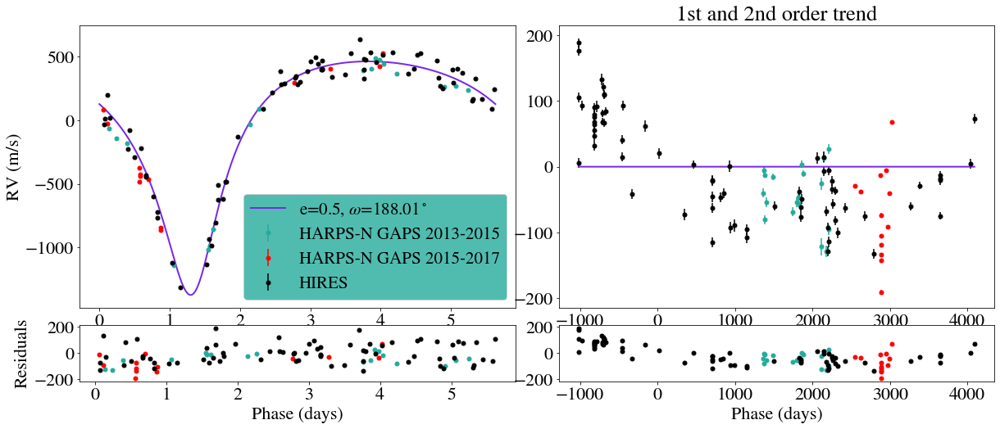

In [171]:
wobble = wobble_edmcmc_ttv.wobble_edmcmc(time_np, rv_np, s_rv_np,labels,
                                    M1, nwalkers, nlinks, nburnin,nfree_params, ncores=num_cpus_to_use,
                                    w_K=w_K, w_Mp = w_Mp, w_logP=w_logP, w_tp=w_tp, w_e=w_e,w_de_dt=w_de_dt, w_om=w_om,
                                    w_dom_dt =w_dom_dt, w_jit1 = w_jit1, w_jit2= w_jit2,w_jit3=w_jit3, 
                                    w_D1=w_D1, w_D2 =w_D2, w_D3 = w_D3,
                                    w_lin = w_lin, w_quad = w_quad, 
                                    K=K, Mp=Mp, logP=logP, tp=tp, e0=e0,de_dt=de_dt, D1=D1, D2=D2, D3=D3,
                                    jit1 = jit1, jit2=jit2, jit3=jit3, 
                                    om0=om0,dom_dt=dom_dt, lin=lin, quad=quad,
                                    pr_Mp=pr_Mp, pr_K=pr_K, pr_logP = pr_logP,pr_tp = pr_tp,pr_e=pr_e, 
                                    pr_D1=pr_D1, pr_D2= pr_D2, pr_D3 = pr_D3, 
                                    pr_om=pr_om, pr_jit1 = pr_jit1, pr_jit2 = pr_jit2, pr_jit3 = pr_jit3,
                                    telescopes = instrument,phase_plot=0.15,
                                    gausspriors=gausspriors, gauss_theta_indexes=gauss_theta_indexes,
                                    gauss_theta_priors=gauss_theta_priors, gauss_theta_err=gauss_theta_err,
                                    use_mass_parametrization=True)#,

df1, df2 = wobble.initial_guess_plot()

wobble.loglikelihood(theta, time_np, rv_np, s_rv_np, nfree_params)[1]

In [172]:
# Run mcmc
out = wobble.wobble_mcmc()

# write results to file

# create a folder and file structure based on eval_method and date_time
date = datetime.today()#.isoformat()
dir_day = "Results/csvs_"+date.strftime("%y_%m_%d")

# check if directory exists. Otherwise, create directory
if not os.path.isdir(dir_day):
    os.mkdir(dir_day)
    
if use_mass_parametrization:
    extra_file_name = "mass_parametrization_"
else:
    extra_file_name = "K_parametization_"
    
if freeze_jitter:
    time_name = date.strftime("%H_%M_%S%p")   
    csv_name = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+".csv"
    csv_name_p = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.csv"
    npz_name_chains = dir_day+"/"+eval_method+"freeze_jitter"+extra_file_name+time_name+"_chains.npz"
    csv_name_p_signif = dir_day+"/Signif_"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.csv"
    pdf_name = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+".pdf"
    png_name = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+".png"
    png_name_p = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.png"  
    signif_name_p = dir_day+"/signif_"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.png"
else:
    time_name = date.strftime("%H_%M_%S%p")   
    csv_name = dir_day+"/"+eval_method+" "+extra_file_name+time_name+".csv"
    csv_name_p = dir_day+"/"+eval_method+" "+extra_file_name+time_name+"_PAPER.csv"
    csv_name_p_signif = dir_day+"/Signif_"+eval_method+" "+extra_file_name+time_name+"_PAPER.csv"
    npz_name_chains = dir_day+"/"+eval_method+" "+extra_file_name+time_name+"_chains.npz"
    pdf_name = dir_day+"/"+eval_method+" "+extra_file_name+time_name+".pdf"
    png_name = dir_day+"/"+eval_method+" "+extra_file_name+time_name+".png"
    png_name_p = dir_day+"/"+eval_method+" "+extra_file_name+time_name+"_PAPER.png"
    signif_name_p = dir_day+"/signif_"+eval_method+" "+extra_file_name+time_name+"_PAPER.png"

0 days, 00:00:00.0 remains. Link 4000 of 4000. Acceptance rate = 0.26
9.268309807978966 +/- 0.10498826309945868 ;     0.750789893193004 +/- 3.1083497965734127e-06


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

_____________________________


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

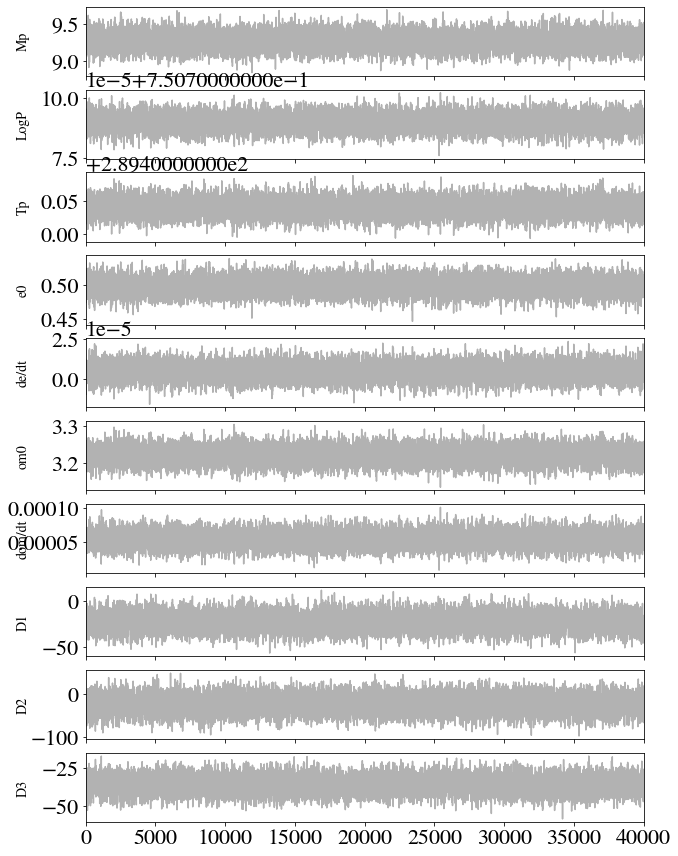

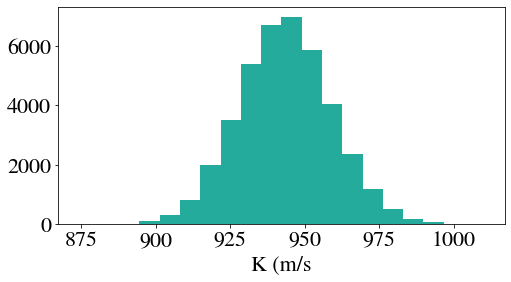

0.4983843029991103 3.2226331594959747


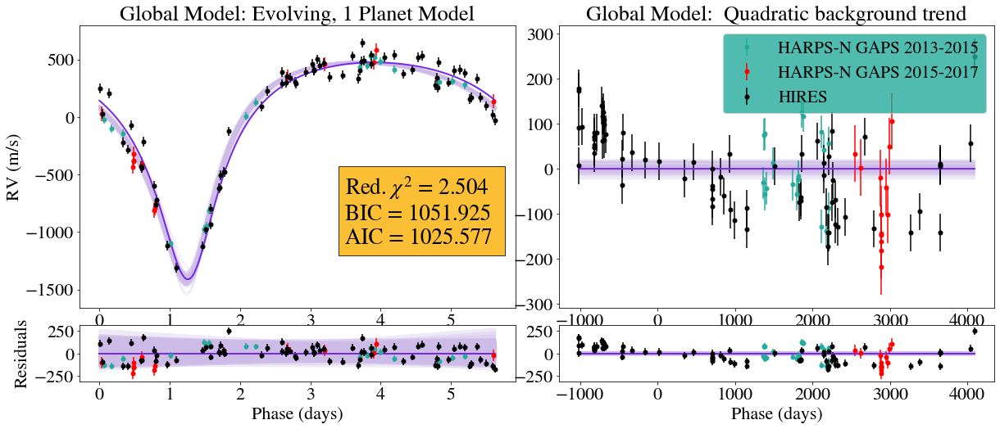

0.4983843029991103 3.2226331594959747


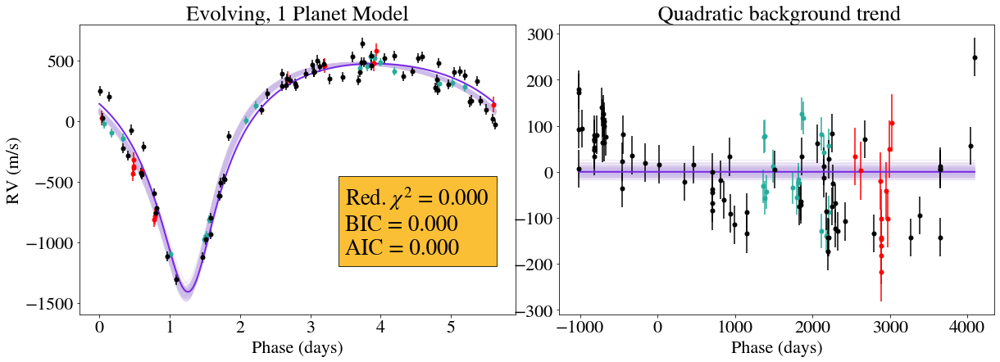

0.49505212619251104 3.1807346713062636


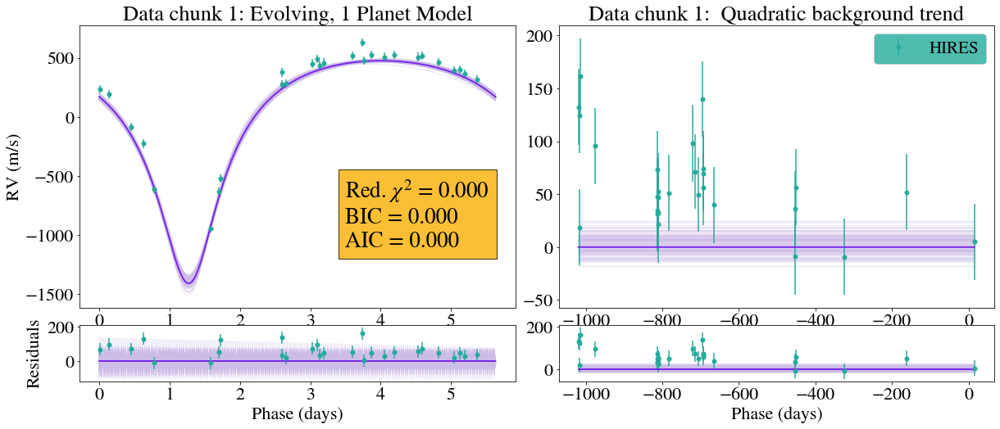

0.5031990236518462 3.271746101446832


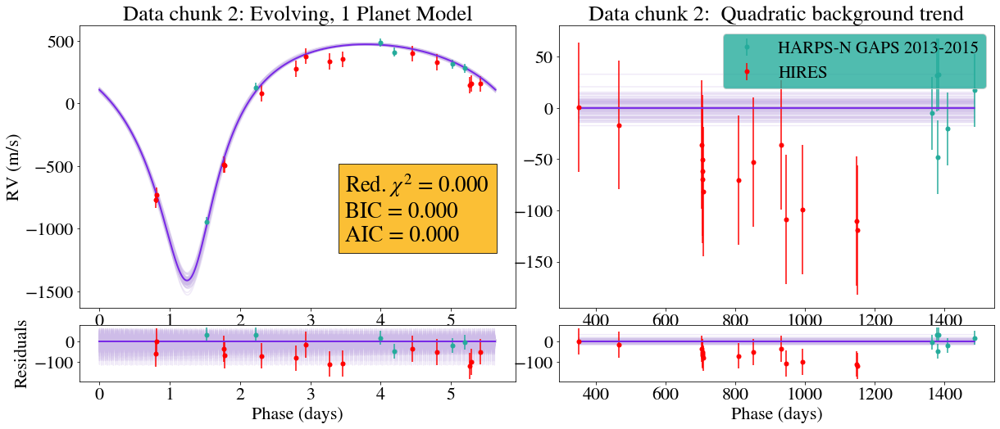

0.509161180909691 3.3383511448351775


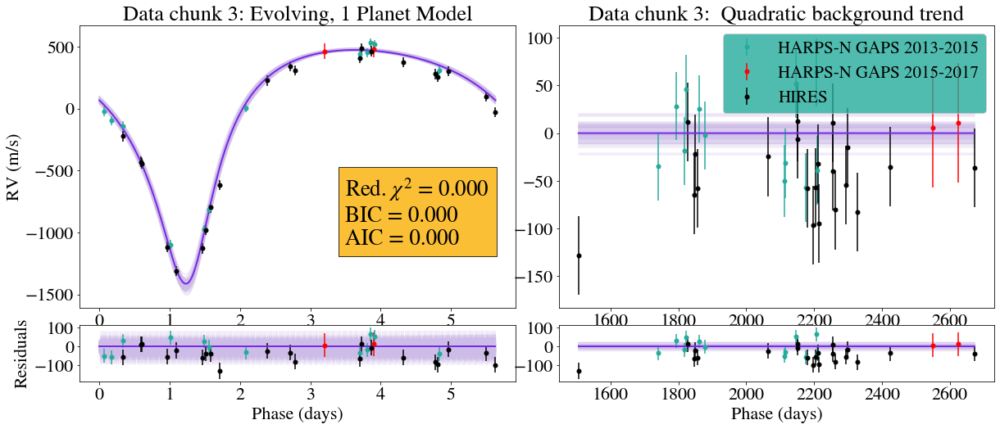

0.5130499136400448 3.3817933421858255


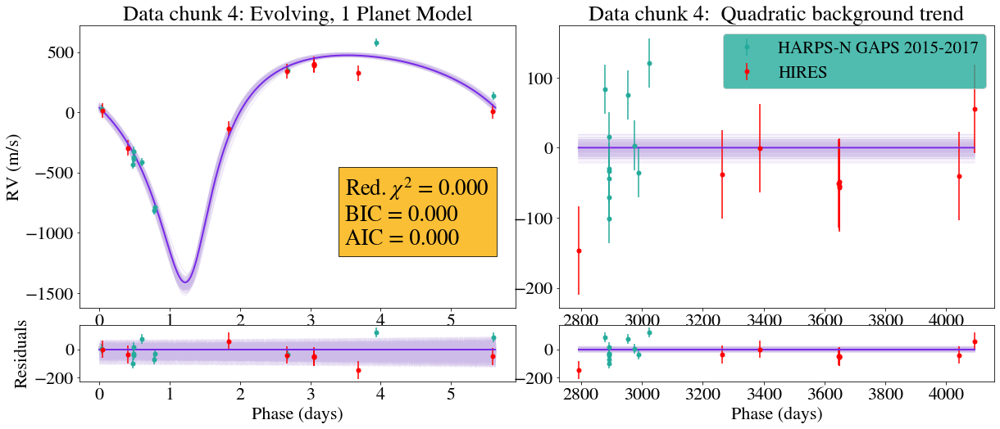

In [173]:
# retrieve eval metrics
# optional to change burnin
#nburnin = 1800

loglikelihood, chisq, AIC, BIC, gelman_values, gelman_labels, om_list, e_list, sigma1, chisq_k, K_list, K2_list = wobble.metrics(out, nburnin)
print("_____________________________")

# Display mcmc 16th, 50th, and 86th percentiles AND write results to a file
df, varying_labels, varying_chains_np, df_p= display_mcmc_percentiles(out, labels, nburnin, loglikelihood, chisq_k, AIC, BIC, gelman_values, gelman_labels, 
                         eval_method,csv_name, csv_name_p)

# Save the mcmc results such that plots can be made later with the mcmc samples
flat_samples = out.get_chains(nthin =5, nburnin = nburnin, flat=True)

np.savez(npz_name_chains,
        flat_samples=flat_samples)

# Save Figures into pdf file
with PdfPages(pdf_name) as pdf:

    # plot chains. Set varying_only=True to only display varying params
    chains_plot(out, labels, nburnin, varying_only=True)
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()
    
    # produce corner plots. Specify label_indexes to only plot a subset of varying params.
    #label_indexes = [0,1,2]
    #corner_plot(out, nburnin, labels, eval_method)#, label_indexes)
    #pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    #plt.show()
    #plt.close()
    
    # Plot a histogram of planet mass(es)
    K1 = K_hist(out, nburnin)
    K1
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()
    
    time_chunk = "Global Model: "
    fair_draws_plot(time_np, rv_np, s_rv_np, out, 100, 10, instrument, time_chunk, eval_method, phase_plot=0.15,
                   chisq=chisq_k, AIC=AIC, BIC=BIC, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig()  # saves the current figure into a pdf page
    plt.savefig(png_name)
    plt.show()
    plt.close()
    
    time_chunk = ""
    fair_draws_plot(time_np, rv_np, s_rv_np, out, 100, 10, instrument, time_chunk, eval_method, phase_plot=0.15,
                   residuals=False, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig()  # saves the current figure into a pdf page
    plt.savefig(png_name_p)
    plt.show()
    plt.close()
    
    # plot individual 1/4th chunks
    plt.rcParams['font.size'] =22
    num_subsets = 4
    len_data = len(time_np)
    cutoff = int(len_data/num_subsets)
    time_ti = np.linspace(np.min(time_np), np.max(time_np), 10000)
    index_cutoff_1 = np.argmin(np.abs(time_ti-time_np[cutoff]))
    index_cutoff_2 = np.argmin(np.abs(time_ti-time_np[2*cutoff]))
    index_cutoff_3 = np.argmin(np.abs(time_ti-time_np[3*cutoff]))
    
    cutoff_even = int(len(time_ti)/num_subsets)
    index_cutoff_e_1 = np.argmin(np.abs(time_np-time_ti[cutoff_even]))
    index_cutoff_e_2 = np.argmin(np.abs(time_np-time_ti[2*cutoff_even]))
    index_cutoff_e_3 = np.argmin(np.abs(time_np-time_ti[3*cutoff_even]))
    
    cutoff_20 = int(len_data/num_subsets)
    index_cutoff_20_1 = np.argmin(np.abs(time_np-time_ti[cutoff_20]))
    index_cutoff_20_2 = np.argmin(np.abs(time_np-time_ti[2*cutoff_20]))
    index_cutoff_20_3 = np.argmin(np.abs(time_np-time_ti[3*cutoff_20]))


    time_chunk ="Data chunk 1: "
    indexes = np.arange(0,index_cutoff_e_1)
    e1 = np.median(np.array(e_list)[indexes])
    om1 = np.median(np.array(om_list)[indexes])
    fair_draws_plot(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                    out, 100, 10, instrument[indexes], time_chunk, eval_method,
                   e1=e1, om1=om1, phase_plot=0.15, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()


    time_chunk ="Data chunk 2: "
    indexes = np.arange(index_cutoff_e_1, index_cutoff_e_2)
    e1 = np.median(np.array(e_list)[indexes])
    om1 = np.median(np.array(om_list)[indexes])
    fair_draws_plot(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                    out, 100, 10, instrument[indexes], time_chunk, eval_method,
                   e1=e1, om1=om1, phase_plot=0.15, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()

    time_chunk ="Data chunk 3: "
    indexes = np.arange(index_cutoff_e_2, index_cutoff_e_3)
    e1 = np.median(np.array(e_list)[indexes])
    om1 = np.median(np.array(om_list)[indexes])
    fair_draws_plot(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                    out, 100, 10, instrument[indexes], time_chunk, eval_method,
                   e1=e1, om1=om1, phase_plot=0.15, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()

    time_chunk ="Data chunk 4: "
    indexes = np.arange(index_cutoff_e_3, len_data)
    e1 = np.median(np.array(e_list)[indexes])
    om1 = np.median(np.array(om_list)[indexes])
    fair_draws_plot(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                    out, 100, 10, instrument[indexes], time_chunk, eval_method,
                   e1=e1, om1=om1, phase_plot=0.15, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()

In [174]:
# Check wheher e and omega adhered to transit priors
flat_samples = out.get_chains(nthin =5, nburnin = nburnin, flat=True)
Mp_mcmc, logperiod_mcmc, tp_mcmc, e_mcmc, de_dt_mcmc_lb, om_mcmc,dom_dt_mcmc_lb, de2_dt2_mcmc, dom2_dt2_mcmc, Mp2_mcmc, logperiod2_mcmc, tp2_mcmc, e02_mcmc, de2_dt_mcmc, om02_mcmc,dom2_dt_mcmc, D1_mcmc,D2_mcmc,D3_mcmc, jit1_mcmc, jit2_mcmc, jit3_mcmc,  lin_mcmc, quad_mcmc = np.percentile(flat_samples[:, :], [16], axis=0)[0]
Mp_mcmc, logperiod_mcmc, tp_mcmc, e_mcmc, de_dt_mcmc_ub, om_mcmc,dom_dt_mcmc_ub, de2_dt2_mcmc, dom2_dt2_mcmc, Mp2_mcmc, logperiod2_mcmc, tp2_mcmc, e02_mcmc, de2_dt_mcmc, om02_mcmc,dom2_dt_mcmc, D1_mcmc,D2_mcmc,D3_mcmc, jit1_mcmc, jit2_mcmc, jit3_mcmc,  lin_mcmc, quad_mcmc = np.percentile(flat_samples[:, :], [84], axis=0)[0]
Mp_mcmc, logperiod_mcmc, tp_mcmc, e_mcmc, de_dt_mcmc, om_mcmc,dom_dt_mcmc, de2_dt2_mcmc, dom2_dt2_mcmc, Mp2_mcmc, logperiod2_mcmc, tp2_mcmc, e02_mcmc, de2_dt_mcmc, om02_mcmc,dom2_dt_mcmc, D1_mcmc,D2_mcmc,D3_mcmc, jit1_mcmc, jit2_mcmc, jit3_mcmc,  lin_mcmc, quad_mcmc = np.percentile(flat_samples[:, :], [50], axis=0)[0]

    
# for i in range(0, len(transit_times_list)):
#     print("e_transit:[%.4f, %.4f, %.4f], e_rv:%.4f "% (e_med_list[i], 
#                                                        e_med_list[i]-e_err,e_med_list[i]+e_err, 
#                                                        e_mcmc+de_dt_mcmc*transit_times_list[i]), 
#                                                        e_med_list[i]-e_err<e_mcmc+de_dt_mcmc*transit_times_list[i])<e_med_list[i]+e_err)
#     print("om_transit:[%.4f, %.4f, %.4f], om_rv:%.4f "% (om_med_list[i], 
#                                                          om_med_list[i]-om_err, om_med_list[i]+om_err, 
#                                                          om_mcmc+dom_dt_mcmc*transit_times_list[i])
#                                                          om_med_list[i]-om_err<om_mcmc+dom_dt_mcmc*transit_times_list[i])<om_med_list[i]+om_err)
#     print("             ")

dom_dt_mcmc*180/np.pi/(np.diff([dom_dt_mcmc,dom_dt_mcmc_lb])*180/np.pi)
dom_dt_mcmc*180/np.pi, np.diff([dom_dt_mcmc*180/np.pi, dom_dt_mcmc_lb*180/np.pi])[0], dom_dt_mcmc*180/np.pi/(np.diff([dom_dt_mcmc,dom_dt_mcmc_lb])*180/np.pi)


# compute significance of dom/dt and de/dt trends
de_dt_sigma = np.mean(np.abs([de_dt_mcmc_lb-de_dt_mcmc, de_dt_mcmc_ub-de_dt_mcmc]))
dom_dt_sigma = np.mean(np.abs([dom_dt_mcmc_lb-dom_dt_mcmc, dom_dt_mcmc_ub-dom_dt_mcmc]))

de_dt_signif = np.abs(de_dt_mcmc)/de_dt_sigma
dom_dt_signif = np.abs(dom_dt_mcmc)/dom_dt_sigma

print("$de/dt$ = %.3e  (%.1f$\sigma$),  $d\omega/dt$ = %.3e (%.1f$\sigma$)"%(de_dt_mcmc, de_dt_signif, dom_dt_mcmc, dom_dt_signif))

print(de_dt_mcmc,de_dt_sigma, dom_dt_mcmc, dom_dt_sigma)

$de/dt$ = 4.820e-06  (1.0$\sigma$),  $d\omega/dt$ = 5.385e-05 (5.1$\sigma$)
4.820003532269539e-06 4.681415616455251e-06 5.3845702237455005e-05 1.05727325355562e-05


0.4947664907419179 3.1775437521880248
0.5031677733975346 3.2713969955017346
0.5090162922387864 3.336732550122772
0.512611273498513 3.3768931618660005


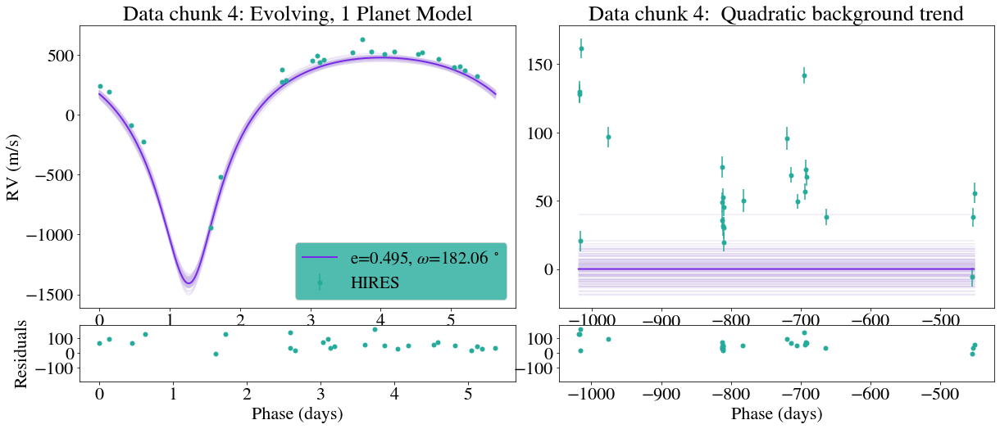

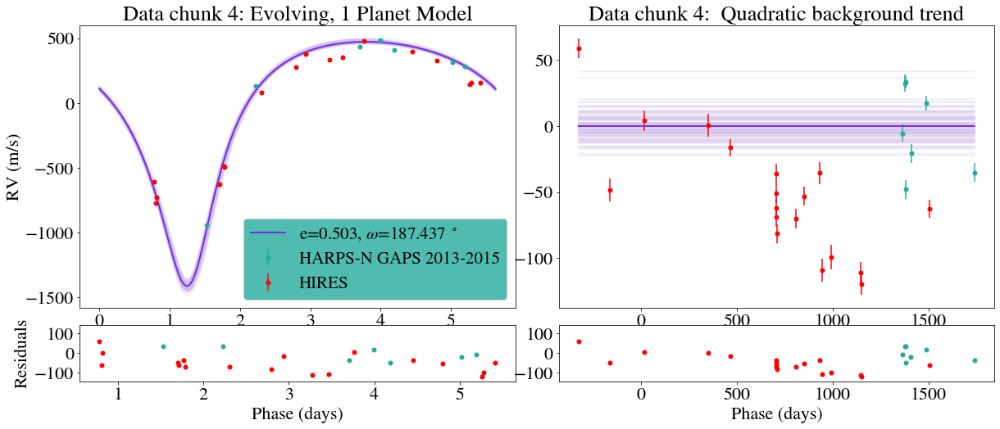

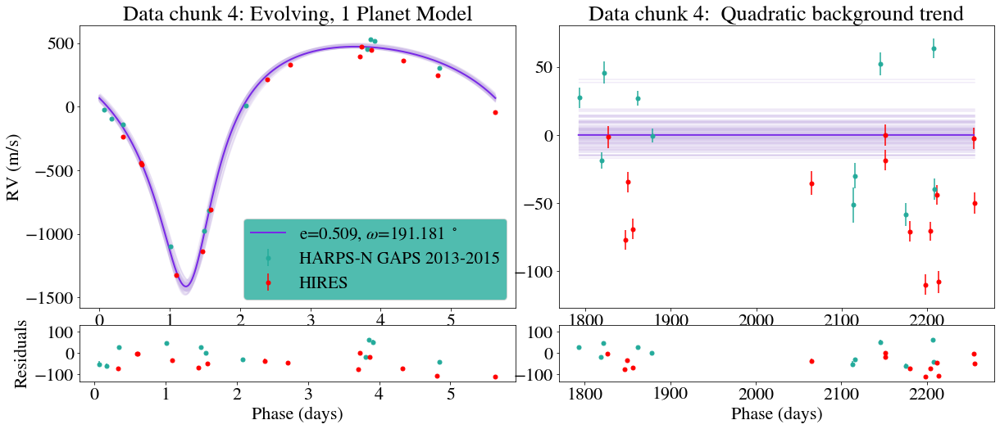

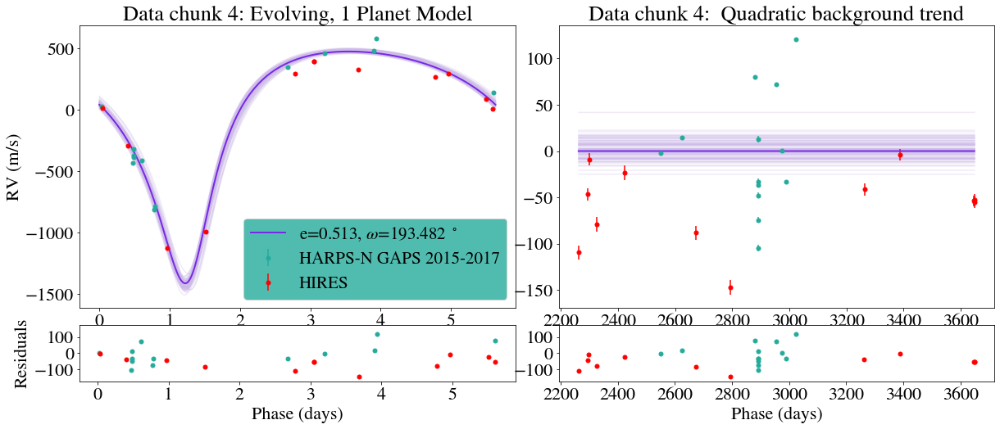

In [175]:
# Make de Wit et al 2017 Figure 5
# 'HARPS-N GAPS 2013-2015', 'HARPS-N GAPS 2015-2017', 'HIRES'
# D_s = 44.14370092191518, 33.058867850110786,-24.817984531672646
# 141.3616907226685, 129.30096314992323, 69.61191521448582


num_subsets = 4
len_data = len(time_np)
cutoff = int(len_data/num_subsets)
index_cutoff_1 = np.argmin(np.abs(time_ti-time_np[cutoff]))
index_cutoff_2 = np.argmin(np.abs(time_ti-time_np[2*cutoff]))
index_cutoff_3 = np.argmin(np.abs(time_ti-time_np[3*cutoff]))

time_chunk_d1 ="Data chunk 1: "
indexes = np.arange(0,cutoff)
e1 = np.median(np.array(e_list)[indexes])
om1 = np.median(np.array(om_list)[indexes])
D_s1,period_mcmc, df_di_sorted1, time_np1, rv_np1,y_preds_time_np_1, y_preds_time_np2_1, s_rv_np_1, instrument1= fair_draws_plot_chunk(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                out, 100, 10, instrument[indexes], time_chunk, eval_method,
               e1=e1, om1=om1, phase_plot=0.15, use_mass_parametrization=True)#, D_s=[69.61191521448582])

time_chunk_d2 ="Data chunk 2: "
indexes = np.arange(cutoff,2*cutoff)
e2 = np.median(np.array(e_list)[indexes])
om2 = np.median(np.array(om_list)[indexes])
D_s2, period_mcmc,df_di_sorted2, time_np2, rv_np2, y_preds_time_np_2, y_preds_time_np2_2, s_rv_np_2, instrument2= fair_draws_plot_chunk(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                out, 100, 10, instrument[indexes], time_chunk, eval_method,
                e1=e2, om1=om2, phase_plot=0.15, use_mass_parametrization=True)#, D_s=[141.3616907226685,69.61191521448582])#[141.3616907226685-50,69.61191521448582-50])#D_s=[141.3616907226685,69.61191521448582])

time_chunk_d3 ="Data chunk 3: "
indexes = np.arange(2*cutoff,3*cutoff)
e3 = np.median(np.array(e_list)[indexes])
om3 = np.median(np.array(om_list)[indexes])
D_s3, period_mcmc,df_di_sorted3, time_np3, rv_np3, y_preds_time_np_3, y_preds_time_np2_3, s_rv_np_3, instrument3= fair_draws_plot_chunk(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                out, 100, 10, instrument[indexes], time_chunk, eval_method,
                e1=e3, om1=om3, phase_plot=0.15, use_mass_parametrization=True)#, D_s=[141.3616907226685,69.61191521448582])#[141.3616907226685-150,69.61191521448582-100])

time_chunk_d4 ="Data chunk 4: "
indexes = np.arange(3*cutoff, 4*cutoff,)
e4 = np.median(np.array(e_list)[indexes])
om4 = np.median(np.array(om_list)[indexes])
D_s4, period_mcmc,df_di_sorted4, time_np4, rv_np4, y_preds_time_np_4, y_preds_time_np2_4, s_rv_np_4, instrument4= fair_draws_plot_chunk(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                out, 100, 10, instrument[indexes], time_chunk, eval_method,
                e1=e4, om1=om4, phase_plot=0.15, use_mass_parametrization=True)#,D_s=[129.30096314992323, 69.61191521448582])#[129.30096314992323-100, 69.61191521448582-100])


$de/dt$ = 4.820e-06  (1.0$\sigma$),  $d\omega/dt$ = 5.385e-05 (5.1$\sigma$)


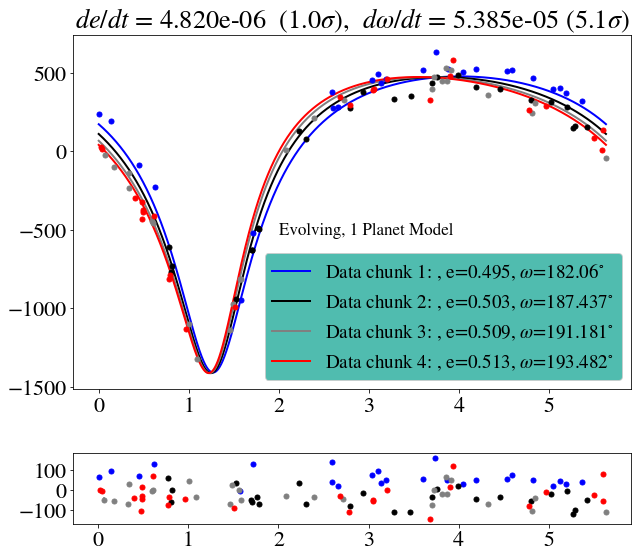

In [176]:
fig, axes = plt.subplots(2,1, figsize=(10, 9),  gridspec_kw={'height_ratios': [3, 0.6]})
fig.subplots_adjust(hspace=0.3, wspace=0.0)

extra_offset = 0#120#50#100

color1 = 'b'
RV_plotter_without_offset_corr(instrument1, D_s1, axes, color1, rv_np1+extra_offset, s_rv_np_1, time_np1, period_mcmc,
                                  y_preds_time_np_1, y_preds_time_np2_1)
ax = axes[0]
ax.plot(df_di_sorted1['phase'], df_di_sorted1['rvs'], color=color1, linewidth=2,
        label=time_chunk_d1+", e="+str(round(e1,3))+", $\omega$="+str(round(om1*180/np.pi,3))+"$^{\circ}$")


color2 = 'k'
RV_plotter_without_offset_corr(instrument2, D_s2, axes, color2, rv_np2+extra_offset, s_rv_np_2, time_np2, period_mcmc,
                                  y_preds_time_np_2, y_preds_time_np2_2)
ax = axes[0]
ax.plot(df_di_sorted2['phase'], df_di_sorted2['rvs'], color=color2, linewidth=2,
        label=time_chunk_d2+", e="+str(round(e2,3))+", $\omega$="+str(round(om2*180/np.pi,3))+"$^{\circ}$")

color3 = 'grey'
RV_plotter_without_offset_corr(instrument3, D_s3, axes, color3, rv_np3+extra_offset, s_rv_np_3, time_np3, period_mcmc,
                                  y_preds_time_np_3, y_preds_time_np2_3)
ax = axes[0]
ax.plot(df_di_sorted3['phase'], df_di_sorted3['rvs'], color=color3, linewidth=2,
        label=time_chunk_d3+", e="+str(round(e3,3))+", $\omega$="+str(round(om3*180/np.pi,3))+"$^{\circ}$")

color4 = 'red'
RV_plotter_without_offset_corr(instrument4, D_s4, axes, color4, rv_np4+extra_offset, s_rv_np_4, time_np4, period_mcmc,
                                  y_preds_time_np_4, y_preds_time_np2_4)
ax = axes[0]
ax.plot(df_di_sorted4['phase'], df_di_sorted4['rvs'], color=color4, linewidth=2,
        label=time_chunk_d4+", e="+str(round(e4,3))+", $\omega$="+str(round(om4*180/np.pi,3))+"$^{\circ}$")



ax.legend(loc="lower right")
legend = ax.legend(loc="lower right", prop={'size': 19}, facecolor='#24ab9b')
plt.setp(legend.get_texts(), color='k')
len(rv_np1)

axes[0].set_title("$de/dt$ = %.3e  (%.1f$\sigma$),  $d\omega/dt$ = %.3e (%.1f$\sigma$)"%(de_dt_mcmc, de_dt_signif, dom_dt_mcmc, dom_dt_signif))

txt = axes[0].text(2, -530, s=(eval_method), ha='left', wrap=True, size = 17)
txt._get_wrap_line_width = lambda : 350.  #  wrap to 600 screen pixels

print("$de/dt$ = %.3e  (%.1f$\sigma$),  $d\omega/dt$ = %.3e (%.1f$\sigma$)"%(de_dt_mcmc, de_dt_signif, dom_dt_mcmc, dom_dt_signif))

eval_method, "red chi^2 = %.3f, BIC = %.3f, AIC = %.3f,"%(chisq, BIC, AIC)

plt.savefig(signif_name_p)


In [177]:
data_signficance ={'model': eval_method,
                'chisq':chisq_k, 
                'AIC':AIC, 
                'BIC': BIC, 
                'de_dt': df_p['de/dt_mcmc'],
                'de_dt_sig':de_dt_signif,
                'dom_dt': df_p["dom/dt_mcmc"],
                'dom_dt_sig': dom_dt_signif,
                }

df_significance = pd.DataFrame(data = data_signficance, index=[0])
df_significance.to_csv(csv_name_p_signif)

<a id='2planet_stable_quad'></a>
## Modular Stable Orbit Model, 2 Planet Model (2nd companion = Quadratic)

In [62]:
single_instrument = False
if single_instrument == True:

    # Optional. Only select one instrument
    df_used = df_used[df_used["instrument_merged"]=="HIRES"]
    df_used

    # format data for mcmc fit
    rv_np = np.array(list(df_used["mnvel_merged"]-np.mean(df_used["mnvel_merged"])))
    s_rv_np = np.array(list(df_used["errvel_merged"]))
    time_np = np.array(df_used["bjd_merged"])-min_time_sub#-np.min(df_used["bjd_merged"])
    time_min = np.min(df_used["bjd_merged"])
    time_np_plus_min = time_np+time_min
    instrument = df_used["instrument_merged"]
    
df_used, np.unique(df_used["instrument_merged"])

(       bjd_merged  mnvel_merged  errvel_merged  svalue_merged  \
 0    2.453982e+06    -30.097458       7.779639         0.1940   
 1    2.453983e+06   -324.109256       7.003154         0.1900   
 2    2.453984e+06    479.981040       7.503201         0.1910   
 3    2.453985e+06    826.893013       7.308160         0.1780   
 4    2.454024e+06    684.765442       7.514108         0.1930   
 ..            ...           ...            ...            ...   
 98   2.458649e+06    586.108263       6.544405         0.1949   
 99   2.458649e+06    588.855060       6.728044         0.1942   
 100  2.458649e+06    594.181109       6.208573         0.1940   
 101  2.459043e+06    534.451073       7.187874         0.1936   
 102  2.459093e+06     58.626849       7.349805         0.1967   
 
     instrument_merged  
 0               HIRES  
 1               HIRES  
 2               HIRES  
 3               HIRES  
 4               HIRES  
 ..                ...  
 98              HIRES  
 99   

In [71]:
# Change this
num_instr = len(np.unique(instrument))
if num_instr ==1:
    eval_method = "Stable, 2 Planet Model, %.f Instrument(s)"%num_instr
else:
     eval_method = "Stable, 2 Planet Model, 2nd Companion is Quadratic Trend"
    
#freeze_jitter = True
use_mass_parametrization = True # False

# Set fixed params 
#jitterpar = 40#80#41.808
M1 = 1.34 # Msolar
# nwalkers = 200
# nlinks = 10000#3000 #0
# nburnin = 8000#2000#1000#00

# params that go into theta
K = 919.2038402526844#925.6799325047316
Mp = 9.007#9.021
logP =np.log10(5.63346961) # Ivshina & Winn 2022 # 0.7507755352581353#np.log10(5.633473128700384)
e0 = 0.5005 # 0.4980169926340284#0.5058640617808413 #0.52
om0 = 188.01*(np.pi/180) #(Ment et al 2018) #187.890*(np.pi/180)#3.280893202442646
tp =  get_periastron_time(5.63346961, om0, e0, 2455288.84910)-min_time_sub#
#tp =  get_periastron_time(5.63346961, om0, e0, 2455756.42709)-min_time_sub#2463982.4915-min_time_sub-0.5#(Ment et al 2018) #get_periastron_time(10**logP, om0, e0, 2455288.84969-min_time_sub)#288.0376218364072-0.11 #289.9##-0.2#289.7#-2# -1.8#-0.1# 288.1-0.2#

K2 = 0#94.54200841836193#100
Mp2 = 0#10.7
logP2 = 3.880863601614623#np.log10(5249.345671)
tp2 = 2454150 - min_time_sub #-1000#-74.73223860395828-min_time_sub#-9.57589212e+01
e02 =  0.37#0.3052418939102423#0.5
om02 = 38*(np.pi/180)#0.35552277312944597#-0.1

extra_offset = 20#50
#D1 = 46.355709021875086+extra_offset#152.8624732#-20 #120#-35#-5#25.48987114398128
#D2 = 35.698511504884095+extra_offset#-100 
#D3 = -22.67212060096864+extra_offset#0
D1 = 69+50+extra_offset#69.48684878396841+70#140.88431672328488#1.485e2#152.86247321588866 #120#-35#-5#25.48987114398128
D2 = 129.56572438802945+extra_offset#1.386e2#+120
D3 = 69.48684878396841+extra_offset#7.685e1#70

#jit1 = 38.62723780659935#40
#jit2 = 64.52246373390295#40
#jit3 = 40.58

# jit1 = 37.45343836780902#40
# jit2 = 68.41894749724969#40
# jit3 = 37.28477499406473#40

#jit1 = 36.55859407372054#38.33785541106814
#jit2 = 71.19850356700195#64.06138479584696
#jit3 = 37.12727298608082#40.684212702777955

#lin = -0.12012280074458673#-1.1e-1
#quad = 2.008e-05 #2.0065437331192983e-05#2e-5
lin = -1.2e-1##-0.8e-1#-1.1e-1#-1.1e-1     - frozen version -4.546e-02
quad = 1.8e-5 #2.0065437331192983e-05#2e-5


#theta =  np.array([K,logP, tp, e0, om0, D1,D2,D3, lin, quad])

# priors
pr_K=[800,1300]
pr_Mp = [Mp-1, Mp+1]
pr_logP=[0, np.log10(10)]
pr_tp=[tp-1.5, tp+1.5]
pr_e=[0.2,0.7]
pr_D1=[-500, 500]
pr_D2 = [-500, 500]
pr_D3 = [np.nan, np.nan]
pr_jit1 = [0,100]
pr_jit2 = [0,100]
pr_jit3 = [0,100]
pr_om=[0, 6.28]

pr_K2 = [0, 200]#[89-13, 89+39]
pr_Mp2 = [Mp2-6, Mp2+6]
pr_logP2 = [np.log10(8500-1500), np.log10(8500+2600)]#[np.log10(4000), np.log10(9000)]#[np.log10(4000), np.log10(6000)]

pr_e2 = [e02-0.15, e02+0.15]
pr_om2 = [om02-32*(np.pi/180), om02+32*(np.pi/180)]
pr_tp2 = [tp2-800, tp2+430]


# gauss priors
gausspriors =True      #P, tp, D1, 'jit1', 'lin', 'quad'
gauss_theta_indexes = [1,2, 11, 12]#, 16, 19, 22, 23]#, 3]
gauss_theta_priors =[5.63346961, tp, tp2, e02]#, D1, jit1, lin, quad]#, e0]#, 0.50833] # Ivshina & Winn 2022, Bonomo et al. 2017
gauss_theta_err = [6.4e-07,3.4e-4, 800, 0.13]#, 1.076e+01, 4.371e+00, 1.883e-02, 5.574e-06]#, 4.2e-4] #8.2e-4 Ivshina & Winn 2022, de Wit et al. 2017, Bonomo et al. 2017


# widths
w_K=15.29315435493163#0.01*
w_Mp = 0.01*Mp
w_logP =1.5523555112473275e-06#0.1*10**(logP)*1e-5#np.log10(5e-5)
w_tp = 0.012318579226075599#2e-6#1e-3
w_e = 0.009579965578327132#0.02
w_om = 0.01656866857696837#0.01#5e-3
w_lin=1e-2 #0
w_quad=1e-5 #0
w_D1 = 25.427521293478364#5#7
# Define withd of offsets based on instrument number
w_jit1 = 9.09600859442638#5

if num_instr ==1:
    w_D2 = 0
    w_D3 = 0
    w_jit2 = 0
    w_jit3 = 0
elif num_instr ==2:
    w_D2 = 30.30606192151322#5
    w_D3 = 0
    w_jit2 = 15.510732183544008#5
    w_jit3 = 0
else:
    w_D2 = 30.30606192151322#5
    w_D3 = 22.931532430320487#5
    w_jit2 = 15.510732183544008#5
    w_jit3 = 4.256#5
    
    
if freeze_jitter:
    #jit1 = 35.15721038710301
    #jit2 = 62.63228448817992
    #jit3 = 40.76037629904555
    w_jit1 = 0
    w_jit2 = 0
    w_jit3 = 0

w_K2 = 0#39.25617419423416#10
w_Mp2 = 0#0.01*Mp2
w_logP2 = 0.07089260356469129#np.log10(1e-5)
w_tp2 = 100#750.3129542923062#1e-2
w_e2 =  0.12132846588859841#0.02#0.005
w_om2 = 0.5894181692820075#1e-2

widths = np.array([w_Mp, w_logP, w_tp, w_e, w_om, w_lin, w_quad, w_D1, w_D2, w_D3, w_jit1, w_jit2, w_jit3,
         w_Mp2, w_logP2, w_tp2, w_e2, w_om2])

nfree_params = len(widths[np.nonzero(widths)])

print("widths:",[w_K, w_D1, 10**w_logP, w_tp, w_e, w_om, w_K2, 10**w_logP2, w_tp2, w_e2, w_om2])


if use_mass_parametrization:
    labels = ["Mp", "LogP", "Tp", "e0", "de/dt","om0","dom/dt","de^2/dt^2", "dom^2/dt^2",
          "Mp2", "LogP2", "Tp2", "e02", "de/dt_2","om02","dom/dt_2",
          "D1","D2","D3", "jit1","jit2","jit3","lin", "quad"]
else:
    labels = ["Amplitude", "LogP", "Tp", "e0", "de/dt","om0","dom/dt","de^2/dt^2", "dom^2/dt^2",
          "Amplitude2", "LogP2", "Tp2", "e02", "de/dt_2","om02","dom/dt_2",
          "D1","D2","D3", "jit1","jit2","jit3","lin", "quad"]

nfree_params
labels[11]

widths: [15.29315435493163, 25.427521293478364, 1.0000035744370475, 0.012318579226075599, 0.009579965578327132, 0.01656866857696837, 0, 1.1773148000132432, 100, 0.12132846588859841, 0.5894181692820075]


'Tp2'

[-1018.221759 -1018.121759 -1018.021759 ...  4092.478241  4092.578241
  4092.678241]


1.26877414879559

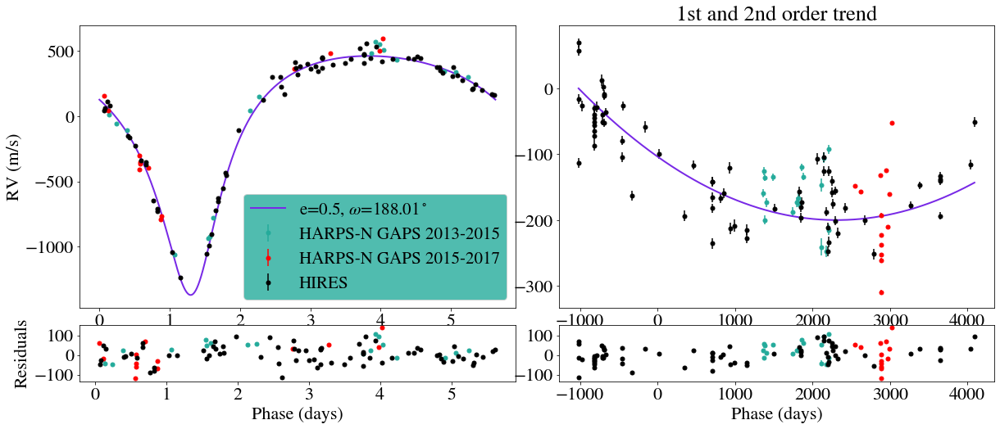

In [72]:
wobble = wobble_edmcmc_ttv.wobble_edmcmc(time_np, rv_np, s_rv_np,labels,
                                    M1, nwalkers, nlinks, nburnin,nfree_params, ncores=num_cpus_to_use,
                                    w_Mp=w_Mp, w_K=w_K, w_logP=w_logP, w_tp=w_tp, w_e=w_e, w_om=w_om, 
                                    w_Mp2=w_Mp2, w_K2=w_K2, w_logP2=w_logP2, w_tp2=w_tp2, w_e2=w_e2, w_om2=w_om2,
                                    w_jit1 = w_jit1, w_jit2= w_jit2,w_jit3=w_jit3, w_D1=w_D1, w_D2 =w_D2, w_D3 = w_D3,
                                    w_lin = w_lin, w_quad = w_quad, 
                                    K=K,  Mp=Mp, logP=logP, tp=tp, e0=e0, om0=om0,
                                    Mp2 = Mp2, logP2=logP2, tp2=tp2, e02=e02, om02=om02,
                                    jit1 = jit1, jit2=jit2, jit3=jit3, D1=D1,D2=D2, D3=D3,
                                    lin=lin, quad=quad,
                                    pr_Mp=pr_Mp, pr_K=pr_K, pr_logP = pr_logP,pr_tp = pr_tp,pr_e=pr_e, pr_om=pr_om,
                                    pr_Mp2=pr_Mp2, pr_K2=pr_K2, pr_logP2=pr_logP2, pr_e2=pr_e2, pr_om2=pr_om2, pr_tp2=pr_tp2,
                                    pr_jit1 = pr_jit1, pr_jit2 = pr_jit2, pr_jit3 = pr_jit3,pr_D1=pr_D1, 
                                    pr_D2= pr_D2, pr_D3 = pr_D3,
                                    telescopes = instrument,
                                    phase_plot =0.15,
                                    gausspriors=gausspriors, gauss_theta_indexes = gauss_theta_indexes,
                                    gauss_theta_priors =gauss_theta_priors, gauss_theta_err = gauss_theta_err, 
                                    use_mass_parametrization=True)
df_di_sorted, df_ti_sorted2 = wobble.initial_guess_plot()

theta = wobble.theta
wobble.loglikelihood(theta, time_np, rv_np, s_rv_np, nfree_params)[1]


In [73]:
# Run mcmc
out = wobble.wobble_mcmc()

# write results to file

# create a folder and file structure based on eval_method and date_time
date = datetime.today()#.isoformat()
dir_day = "Results/csvs_"+date.strftime("%y_%m_%d")

# check if directory exists. Otherwise, create directory
if not os.path.isdir(dir_day):
    os.mkdir(dir_day)
    
if use_mass_parametrization:
    extra_file_name = "mass_parametrization_"
else:
    extra_file_name = "K_parametization_"
    
if freeze_jitter:
    time_name = date.strftime("%H_%M_%S%p")   
    csv_name = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+".csv"
    csv_name_p = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.csv"
    csv_name_p_signif = dir_day+"/Signif_"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.csv"
    npz_name_chains = dir_day+"/"+eval_method+"freeze_jitter"+extra_file_name+time_name+"_chains.npz"
    pdf_name = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+".pdf"
    png_name = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+".png"
    png_name_p = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.png"  
    signif_name_p = dir_day+"/signif_"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.png"
else:
    time_name = date.strftime("%H_%M_%S%p")   
    csv_name = dir_day+"/"+eval_method+" "+extra_file_name+time_name+".csv"
    csv_name_p = dir_day+"/"+eval_method+" "+extra_file_name+time_name+"_PAPER.csv"
    csv_name_p_signif = dir_day+"/Signif_"+eval_method+" "+extra_file_name+time_name+"_PAPER.csv"
    npz_name_chains = dir_day+"/"+eval_method+" "+extra_file_name+time_name+"_chains.npz"
    pdf_name = dir_day+"/"+eval_method+" "+extra_file_name+time_name+".pdf"
    png_name = dir_day+"/"+eval_method+" "+extra_file_name+time_name+".png"
    png_name_p = dir_day+"/"+eval_method+" "+extra_file_name+time_name+"_PAPER.png"
    signif_name_p = dir_day+"/signif_"+eval_method+" "+extra_file_name+time_name+"_PAPER.png"

0 days, 00:00:00.0 remains. Link 5000 of 5000. Acceptance rate = 0.18
8.998148683978108 +/- 0.10028939026101862 ;     0.7507759548357382 +/- 4.973206312071238e-08


In [74]:
theta_priors = wobble.theta_priors
theta = wobble.theta

def log_prior(theta, theta_priors):
    logprior = 0
    
    # check which priors are not NaNs
    indexes = np.where(np.isnan(np.array(theta_priors)[:,0])==False)[0]
    
    # Check priors for those indexes
    for i in indexes:
        #print(i)
        if theta_priors[i][0]<theta[i]<theta_priors[i][1]:
            #print(theta_priors[0][i][0],theta[0][i],theta_priors[0][i][1])
            logprior += 0.0
        else:
            print(theta_priors[i][0],theta[i],theta_priors[i][1])
            logprior += -np.inf

    return logprior

log_prior(theta, theta_priors)

0.0

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

_____________________________


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

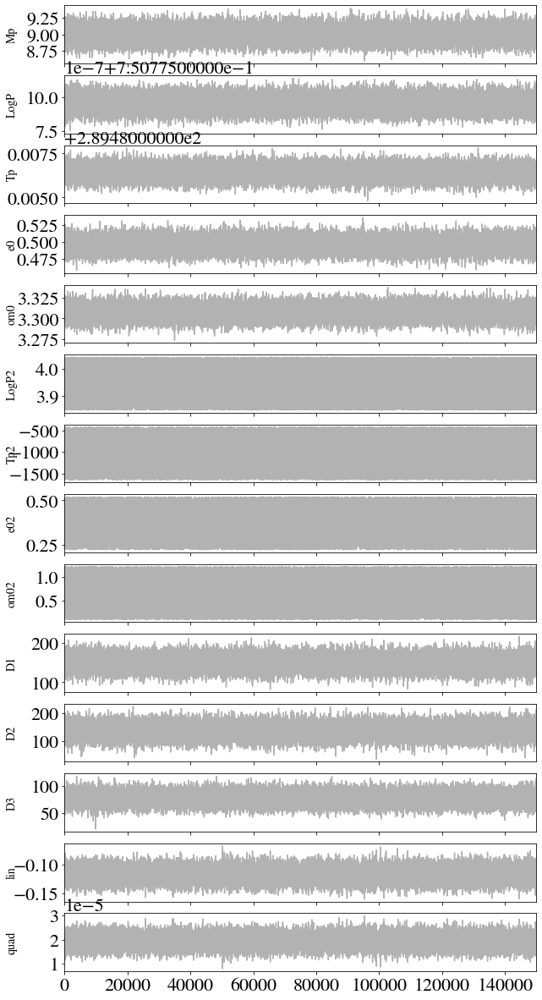

0.4960828554024724 3.307161141286357


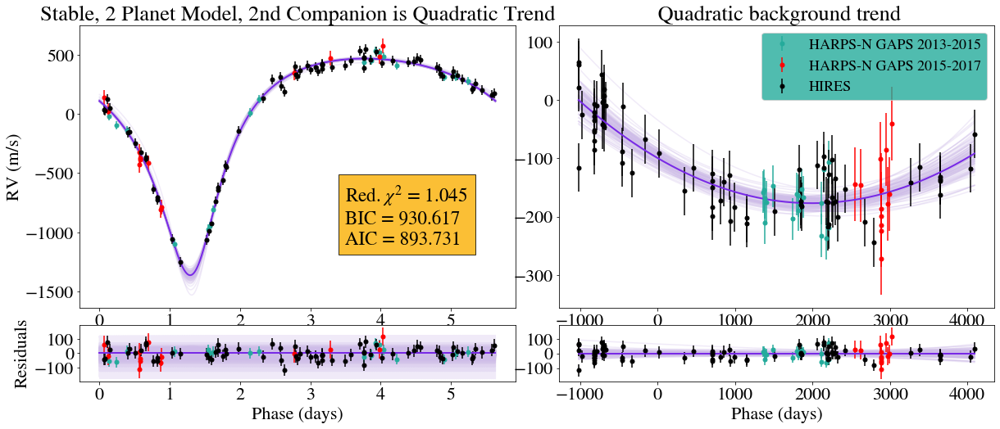

0.4960828554024724 3.307161141286357


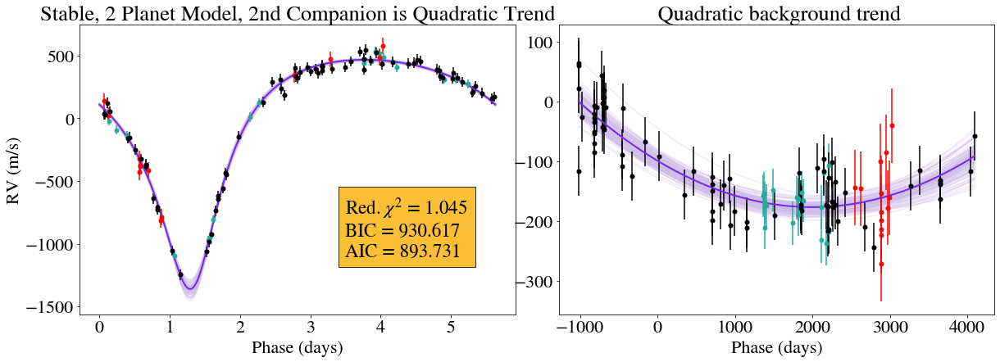

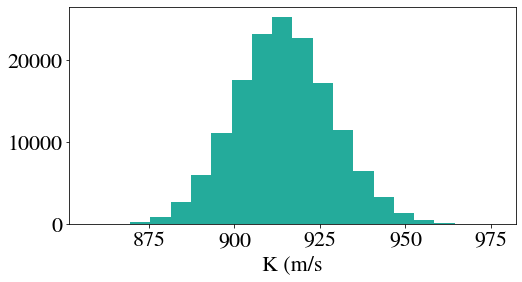

In [75]:
#nburnin = 2000

corner_plot_make = False

# retrieve eval metrics
loglikelihood, chisq, AIC, BIC, gelman_values, gelman_labels, om_list, e_list, sigma1, chisq_k, K_list, K2_list = wobble.metrics(out, nburnin)
print("_____________________________")

# Display mcmc 16th, 50th, and 86th percentiles AND write results to a file
df, varying_labels, varying_chains_np, df_p = display_mcmc_percentiles(out, labels, nburnin, loglikelihood, chisq_k, AIC, BIC, gelman_values, gelman_labels, 
                         eval_method,csv_name, csv_name_p)

# Save the mcmc results such that plots can be made later with the mcmc samples
flat_samples = out.get_chains(nthin =5, nburnin = nburnin, flat=True)

np.savez(npz_name_chains,
        flat_samples=flat_samples)

# Save Figures into pdf file
with PdfPages(pdf_name) as pdf:

    # plot chains. Set varying_only=True to only display varying params
    chains_plot(out, labels, nburnin, varying_only=True)
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()
    
    # make phase_folded plot
    time_chunk = ""
    fair_draws_plot(time_np, rv_np, s_rv_np, out, 100, 10, instrument, time_chunk, eval_method, phase_plot=0.15,
                    legendfontsize=18, chisq=chisq_k, BIC=BIC, AIC=AIC, err_inflate=True, use_mass_parametrization=True)
    plt.savefig(png_name)
    pdf.savefig()  # saves the current figure into a pdf page
    plt.show()
    plt.close()
    
    # make fair draws plot without residuals
    time_chunk = ""
    fair_draws_plot(time_np, rv_np, s_rv_np, out, 100, 10, instrument, time_chunk, eval_method, phase_plot=0.15,
                   residuals=False,
                   legendfontsize=18, chisq=chisq_k, BIC=BIC, AIC=AIC, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig()  # saves the current figure into a pdf page
    plt.savefig(png_name_p)
    plt.show()
    plt.close()
    
    # Plot a histogram of planet mass(es)
    K1 = K_hist(out, nburnin)
    K1
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()
    
    
    # produce corner plots. Specify label_indexes to only plot a subset of varying params.
    #label_indexes = [0,1,2]
    if corner_plot_make:
        corner_plot(out, nburnin, labels, eval_method)#, label_indexes)
        pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
        plt.show()
        plt.close()

<a id='2planet_evolving_kep'></a>
## 2 Planet Model, evolving orbit model for primary, 2nd companion = Keplerian

In [77]:
# Re-Load 5 RV datasets without RM measurements

# open npz file
outfile = 'data/Five_RV_datasets.npz'#'NEW_DRS2_3_1_10s_norm.npz'

min_time_sub = 2455000#3980

npzfile = np.load(outfile, allow_pickle=True)
npzfile.files

data = {npzfile.files[0]: npzfile[npzfile.files[0]],
       npzfile.files[1]: npzfile[npzfile.files[1]],
       npzfile.files[2]: npzfile[npzfile.files[2]],
       npzfile.files[3]: npzfile[npzfile.files[3]],
       npzfile.files[4]: npzfile[npzfile.files[4]]}
df_used = pd.DataFrame(data=data)
df_used.head(10)
df_used = df_used[df_used['instrument_merged']!="Lick"][df_used['instrument_merged']!="SOPHIE"]
df_used = df_used.reset_index(drop=True)
df_used = df_used.sort_values(by=['bjd_merged']).reset_index(drop=True)
print(np.unique(df_used['instrument_merged']))


# format data for mcmc fit
rv_np = np.array(list(df_used["mnvel_merged"]-np.mean(df_used["mnvel_merged"])))
s_rv_np = np.array(list(df_used["errvel_merged"]))
time_np = np.array(df_used["bjd_merged"])-min_time_sub#-np.min(df_used["bjd_merged"])
time_min = np.min(df_used["bjd_merged"])
time_np_plus_min = time_np+time_min
instrument = df_used["instrument_merged"]

['HARPS-N GAPS 2013-2015' 'HARPS-N GAPS 2015-2017' 'HIRES']


In [78]:
single_instrument = False
if single_instrument == True:

    # Optional. Only select one instrument
    df_used = df_used[df_used["instrument_merged"]=="HIRES"]
    df_used

    # format data for mcmc fit
    rv_np = np.array(list(df_used["mnvel_merged"]-np.mean(df_used["mnvel_merged"])))
    s_rv_np = np.array(list(df_used["errvel_merged"]))
    time_np = np.array(df_used["bjd_merged"])-min_time_sub#-np.min(df_used["bjd_merged"])
    time_min = np.min(df_used["bjd_merged"])
    time_np_plus_min = time_np+time_min
    instrument = df_used["instrument_merged"]
    
df_used

,bjd_merged,mnvel_merged,errvel_merged,svalue_merged,instrument_merged
0,2.453982e+06,-30.097458,7.779639,0.1940,HIRES
1,2.453983e+06,-324.109256,7.003154,0.1900,HIRES
2,2.453984e+06,479.981040,7.503201,0.1910,HIRES
3,2.453985e+06,826.893013,7.308160,0.1780,HIRES
4,2.454024e+06,684.765442,7.514108,0.1930,HIRES
...,...,...,...,...,...
98,2.458649e+06,586.108263,6.544405,0.1949,HIRES
99,2.458649e+06,588.855060,6.728044,0.1942,HIRES
100,2.458649e+06,594.181109,6.208573,0.1940,HIRES
101,2.459043e+06,534.451073,7.187874,0.1936,HIRES


In [75]:
# Change this
num_instr = len(np.unique(instrument))
#freeze_jitter = False#True
fast_run = True #False #
use_mass_parametrization = True # False

if num_instr ==1:
    eval_method = "Evolving, 2 Planets Model, %.f Instrument"%num_instr#"Stable, 1 Planet Model, %.f Instrument(s), BJ DRS"%num_instr
else:
    eval_method = "Evolving, 2 Planets Model"#, %.f Instruments"%num_instr#"Stable, 1 Planet Model, %.f Instrument(s), BJ DRS"%num_instr


# Set fixed params 
#jitterpar = 40#80#41.808
M1 = 1.34 # Msolar
# nwalkers = 200

# if fast_run:
#      nlinks = 2000
#      nburnin = 1000
    
# else:
#     nlinks = 5000#4000 #0
#     nburnin = 4000#1000#500#1000#00


# params that go into theta
K = 919.2038402526844#925.6799325047316
Mp = 9.021
logP =np.log10(5.63346961) # Ivshina & Winn 2022 #np.log10(5.633473128700384)
e0 = 0.5005 #0.52
de_dt = 4.419e-6
dom_dt = 2e-6
om0 = 188.01*(np.pi/180) #(Ment et al 2018) #187.890*(np.pi/180)#3.280893202442646
tp =  get_periastron_time(5.63346961, om0, e0, 2455288.84910)-min_time_sub#2463982.4915-min_time_sub-0.5#(Ment et al 2018) #get_periastron_time(10**logP, om0, e0, 2455288.84969-min_time_sub)#288.0376218364072-0.11 #289.9##-0.2#289.7#-2# -1.8#-0.1# 288.1-0.2#



K2 = 94.54200841836193#100
Mp2 = 10.7
logP2 = 3.880863601614623#np.log10(5249.345671)
tp2 = 2454150-min_time_sub#-940.1917273266815#-1000#-74.73223860395828-min_time_sub#-9.57589212e+01
e02 = 0.37#0.3052418939102423#0.5
om02 = 38*(np.pi/180)#0.35552277312944597#-0.1

extra_offset = 50
D1 = 46.355709021875086 +extra_offset#152.8624732#-20 #120#-35#-5#25.48987114398128
D2 = 35.698511504884095 +extra_offset#-100 
D3 = -22.67212060096864-40 +extra_offset#0
#jit1 = 38.62723780659935#40
#jit2 = 64.52246373390295#40
#jit3 = 40.58


# jit1 = 37.45343836780902#40
# jit2 = 68.41894749724969#40
# jit3 = 37.28477499406473#40
#jit1 = 36.55859407372054#38.33785541106814
#jit2 = 71.19850356700195#64.06138479584696
#jit3 = 37.12727298608082#40.684212702777955

lin = 0#-0.12012280074458673#-1.1e-1
quad = 0#2.008e-05 #2.0065437331192983e-05#2e-5



#theta =  np.array([K,logP, tp, e0, om0, D1,D2,D3, lin, quad])

# priors
pr_K=[800,1300]
pr_Mp = [Mp-1, Mp+1]
pr_logP=[0, np.log10(10)]
pr_tp=[tp-1.5, tp+1.5]
pr_e=[0.2,0.7]
pr_D1=[-500, 500]
pr_D2 = [-500, 500]
pr_D3 = [np.nan, np.nan]
pr_jit1 = [0,100]
pr_jit2 = [0,100]
pr_jit3 = [0,100]
pr_om=[0, 6.28]

pr_K2 = [0, 200]
pr_Mp2 = [Mp2-6, Mp2+6]
pr_logP2 = [np.log10(8500-1500), np.log10(8500+2600)]#[np.log10(4000), np.log10(9000)]#[np.log10(4000), np.log10(6000)]
pr_e2 = [e02-0.15, e02+0.15]
pr_om2 = [om02-32*(np.pi/180), om02+32*(np.pi/180)]
pr_tp2 = [tp2-800, tp2+430]

# gauss priors
gausspriors =True      #P, tp, D1, 'jit1', 'lin', 'quad'
gauss_theta_indexes = [1,2, 10, 12]#, 16, 19, 22, 23]#, 3]
gauss_theta_priors =[5.63346961, tp, logP2, e02]#, D1, jit1, lin, quad]#, e0]#, 0.50833] # Ivshina & Winn 2022, Bonomo et al. 2017
gauss_theta_err = [6.4e-07,3.4e-4, np.log10(2600), 0.13]#, 1.076e+01, 4.371e+00, 1.883e-02, 5.574e-06]#, 4.2e-4] #8.2e-4 Ivshina & Winn 2022, de Wit et al. 2017, Bonomo et al. 2017


# widths
w_K=15.29315435493163#0.01*K
w_Mp = 0.01*Mp
w_logP =1.5523555112473275e-06#0.1*10**(logP)*1e-5#np.log10(5e-5)
w_tp = 2e-6#0.02*10**(logP)
w_e = 2e-2
w_de_dt = 2e-6
w_om = 5e-2
w_dom_dt = 2e-5

w_lin=0#1e-2 #0
w_quad=0#1e-5 #0
w_D1 = 25.427521293478364#5#7
# Define withd of offsets based on instrument number
w_jit1 = 9.09600859442638#5

if num_instr ==1:
    w_D2 = 0
    w_D3 = 0
    w_jit2 = 0
    w_jit3 = 0
elif num_instr ==2:
    w_D2 = 30.30606192151322#5
    w_D3 = 0
    w_jit2 = 15.510732183544008#5
    w_jit3 = 0
else:
    w_D2 = 30.30606192151322#5
    w_D3 = 22.931532430320487#5
    w_jit2 = 15.510732183544008#5
    w_jit3 = 4.256#5
    
    
if freeze_jitter:
    #jit1 = 35.15721038710301
    #jit2 = 62.63228448817992
    #jit3 = 40.76037629904555
    w_jit1 = 0
    w_jit2 = 0
    w_jit3 = 0

w_K2 = 39.25617419423416#10
w_Mp2 = 0.01*Mp2
w_logP2 = 0.07089260356469129#np.log10(1e-5)
w_tp2 = 100#0#750.3129542923062#1e-2
w_e2 =  2e-2#0.12132846588859841#0.02#0.005
w_om2 = 2e-2 #0 #0.5894181692820075#1e-2

widths = np.array([w_Mp, w_logP, w_tp, w_e, w_om, w_lin, w_quad, w_D1, w_D2, w_D3, w_jit1, w_jit2, w_jit3,
         w_Mp2, w_logP2, w_tp2, w_e2, w_om2])

nfree_params = len(widths[np.nonzero(widths)])

print("widths:",[w_K, w_D1, 10**w_logP, w_tp, w_e, w_om, w_K2, 10**w_logP2, w_tp2, w_e2, w_om2])

if use_mass_parametrization:
    labels = ["Mp", "LogP", "Tp", "e0", "de/dt","om0","dom/dt","de^2/dt^2", "dom^2/dt^2",
          "Mp2", "LogP2", "Tp2", "e02", "de/dt_2","om02","dom/dt_2",
          "D1","D2","D3", "jit1","jit2","jit3","lin", "quad"]
else:
    labels = ["Amplitude", "LogP", "Tp", "e0", "de/dt","om0","dom/dt","de^2/dt^2", "dom^2/dt^2",
          "Amplitude2", "LogP2", "Tp2", "e02", "de/dt_2","om02","dom/dt_2",
          "D1","D2","D3", "jit1","jit2","jit3","lin", "quad"]

nfree_params

widths: [15.29315435493163, 25.427521293478364, 1.0000035744370475, 2e-06, 0.02, 0.05, 39.25617419423416, 1.1773148000132432, 100, 0.02, 0.02]


13

[-1018.221759 -1018.121759 -1018.021759 ...  4092.478241  4092.578241
  4092.678241]
Mp 9.02935788756908 9.021
LogP 0.7507759581488365 0.7507759558387136
Tp 289.4864308197888 289.4864387465641
e0 0.502441925097167 0.5005
de/dt 0.0 4.419e-06
om0 3.2953818319870027 3.2813935266745387
dom/dt 0.0 2e-06
de^2/dt^2 0.0 0
dom^2/dt^2 0.0 0
Mp2 11.670610433030248 0
LogP2 3.9433739494104723 3.880863601614623
Tp2 -906.7724045323704 -850
e02 0.34442390759665753 0.37
de/dt_2 0.0 0
om02 0.7571056193281251 0.6632251157578453
dom/dt_2 0.0 0
D1 46.565143216653134 51.355709021875086
D2 42.11193803074988 40.698511504884095
D3 -20.37942842595474 -57.67212060096864
jit1 35.62 35.62
jit2 63.34 63.34
jit3 40.03 40.03
lin 0.0 0
quad 0.0 0


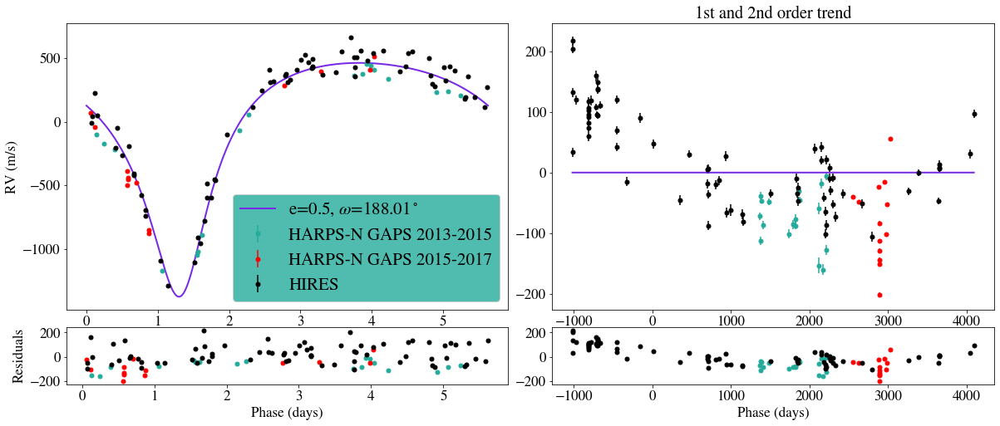

In [76]:
extra_offset = 5
D1 = 46.355709021875086 +extra_offset#152.8624732#-20 #120#-35#-5#25.48987114398128
D2 = 35.698511504884095 +extra_offset#-100 
D3 = -22.67212060096864-40 +extra_offset#0

wobble = wobble_edmcmc_ttv.wobble_edmcmc(time_np, rv_np, s_rv_np,labels,
                                    M1, nwalkers, nlinks, nburnin,nfree_params, ncores=num_cpus_to_use,
                                    w_Mp=w_Mp, w_logP=w_logP, w_tp=w_tp, w_e=w_e,w_de_dt=w_de_dt, w_om=w_om,
                                    w_dom_dt =w_dom_dt,  
                                    w_Mp2=w_Mp2, w_logP2=w_logP2, w_tp2=w_tp2, w_e2=w_e2, w_om2=w_om2,
                                    w_jit1 = w_jit1, w_jit2= w_jit2,w_jit3=w_jit3, w_D1=w_D1, w_D2 =w_D2, w_D3 = w_D3,
                                    w_lin = w_lin, w_quad = w_quad, 
                                    K=K, Mp=Mp, logP=logP, tp=tp, e0=e0,de_dt=de_dt, om0=om0,dom_dt=dom_dt,
                                    Mp2 = Mp2, logP2=logP2, tp2=tp2, e02=e02, om02=om02,
                                    jit1 = jit1, jit2=jit2, jit3=jit3, D1=D1, D2=D2, D3=D3,
                                    lin=lin, quad=quad,
                                    pr_Mp=pr_Mp, pr_logP = pr_logP,pr_tp = pr_tp,pr_e=pr_e, pr_om=pr_om,
                                    pr_Mp2=pr_Mp2, pr_logP2=pr_logP2, pr_e2=pr_e2, pr_om2=pr_om2, pr_tp2=pr_tp2,
                                    pr_jit1 = pr_jit1, pr_jit2 = pr_jit2, pr_jit3 = pr_jit3,pr_D1=pr_D1, 
                                    pr_D2= pr_D2, pr_D3 = pr_D3,
                                    telescopes = instrument, phase_plot =0.15,
                                    gausspriors=gausspriors, gauss_theta_indexes=gauss_theta_indexes,
                                    gauss_theta_priors=gauss_theta_priors, gauss_theta_err=gauss_theta_err,
                                    use_mass_parametrization=use_mass_parametrization)
df_di_sorted, df_ti_sorted2 = wobble.initial_guess_plot()


theta = wobble.theta
wobble.loglikelihood(theta, time_np, rv_np, s_rv_np, nfree_params)[1]

#for i in range(0, len(theta)):
#    print(labels[i], theta_mcmc[i], theta[i])

In [39]:
# Run mcmc
out = wobble.wobble_mcmc()

# write results to file

# create a folder and file structure based on eval_method and date_time
date = datetime.today()#.isoformat()
dir_day = "Results/csvs_"+date.strftime("%y_%m_%d")

# check if directory exists. Otherwise, create directory
if not os.path.isdir(dir_day):
    os.mkdir(dir_day)
    
if use_mass_parametrization:
    extra_file_name = "mass_parametrization_"
else:
    extra_file_name = "K_parametization_"
    
if freeze_jitter:
    time_name = date.strftime("%H_%M_%S%p")   
    csv_name = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+".csv"
    csv_name_p = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.csv"
    csv_name_p_signif = dir_day+"/Signif_"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.csv"
    npz_name_chains = dir_day+"/"+eval_method+"freeze_jitter"+extra_file_name+time_name+"_chains.npz"
    pdf_name = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+".pdf"
    png_name = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+".png"
    png_name_p = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.png"  
    signif_name_p = dir_day+"/signif_"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.png"
else:
    time_name = date.strftime("%H_%M_%S%p")   
    csv_name = dir_day+"/"+eval_method+" "+extra_file_name+time_name+".csv"
    csv_name_p = dir_day+"/"+eval_method+" "+extra_file_name+time_name+"_PAPER.csv"
    csv_name_p_signif = dir_day+"/Signif_"+eval_method+" "+extra_file_name+time_name+"_PAPER.csv"
    npz_name_chains = dir_day+"/"+eval_method+" "+extra_file_name+time_name+"_chains.npz"
    pdf_name = dir_day+"/"+eval_method+" "+extra_file_name+time_name+".pdf"
    png_name = dir_day+"/"+eval_method+" "+extra_file_name+time_name+".png"
    png_name_p = dir_day+"/"+eval_method+" "+extra_file_name+time_name+"_PAPER.png"
    signif_name_p = dir_day+"/signif_"+eval_method+" "+extra_file_name+time_name+"_PAPER.png"

0 days, 00:00:00.0 remains. Link 5000 of 5000. Acceptance rate = 0.19
9.029355801786185 +/- 0.10022655947779568 ;     0.750775958157067 +/- 4.911603605606082e-08


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

_____________________________


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

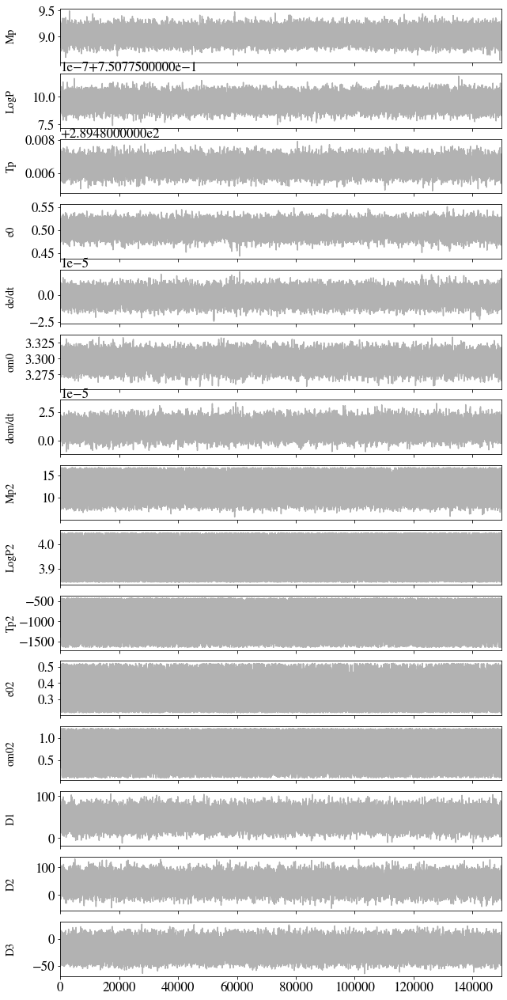

0.5023720310351414 3.295376860035623


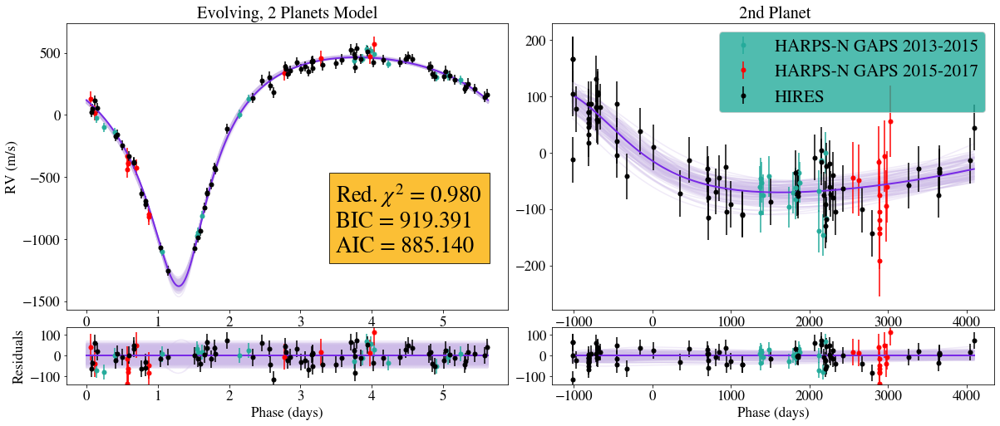

(array([916.97441294, 914.02142308, 914.02142308, ..., 923.12380353,
       923.60859025, 923.60859025]), 0)


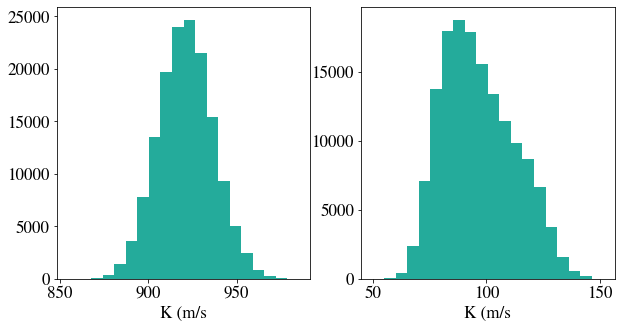

In [40]:
#nburnin = 4300

corner_plot_make = False
#eval_method = "2 Planet Model (2 Keplerians), evolving primary planet %.f Instrument(s)"%num_instr


# retrieve eval metrics
loglikelihood, chisq, AIC, BIC, gelman_values, gelman_labels, om_list, e_list, sigma1, chisq_k, K_list, K2_list = wobble.metrics(out, nburnin)
print("_____________________________")

# Display mcmc 16th, 50th, and 86th percentiles AND write results to a file
df, varying_labels, varying_chains_np, df_p = display_mcmc_percentiles(out, labels, nburnin, loglikelihood, chisq_k, AIC, BIC, gelman_values, gelman_labels, 
                         eval_method,csv_name, csv_name_p)

# Save the mcmc results such that plots can be made later with the mcmc samples
flat_samples = out.get_chains(nthin =5, nburnin = nburnin, flat=True)

np.savez(npz_name_chains,
        flat_samples=flat_samples)

# Save Figures into pdf file
with PdfPages(pdf_name) as pdf:

    # plot chains. Set varying_only=True to only display varying params
    chains_plot(out, labels, nburnin, varying_only=True)
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()
    
    # make phase_folded plot
    time_chunk = ""
    fair_draws_plot(time_np, rv_np, s_rv_np, out, 100, 10, instrument, time_chunk, eval_method, phase_plot=0.15,
                   chisq=chisq_k, AIC=AIC, BIC=BIC, err_inflate=True, use_mass_parametrization=True)
    plt.savefig(png_name)
    pdf.savefig()  # saves the current figure into a pdf page
    plt.show()
    plt.close()
    
    # Plot a histogram of planet mass(es)
    K1 = K_hist(out, nburnin)
    K1
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()
    
    
    # produce corner plots. Specify label_indexes to only plot a subset of varying params.
    #label_indexes = [0,1,2]
    if corner_plot_make:
        corner_plot(out, nburnin, labels, eval_method)#, label_indexes)
        pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
        plt.show()
        plt.close()

In [52]:
theta_mcmc = np.percentile(flat_samples.T, 50, axis=1)

# set de/dt = 0 and dom/dt=0
theta_mcmc[4] =0
theta_mcmc[6] =0

wobble.loglikelihood(theta_mcmc, time_np, rv_np, s_rv_np, nfree_params)[-4]
for i in range(0, len(theta_mcmc)):
    print(labels[i], theta_mcmc[i])


Mp 9.02935788756908
LogP 0.7507759581488365
Tp 289.4864308197888
e0 0.502441925097167
de/dt 0.0
om0 3.2953818319870027
dom/dt 0.0
de^2/dt^2 0.0
dom^2/dt^2 0.0
Mp2 11.670610433030248
LogP2 3.9433739494104723
Tp2 -906.7724045323704
e02 0.34442390759665753
de/dt_2 0.0
om02 0.7571056193281251
dom/dt_2 0.0
D1 46.565143216653134
D2 42.11193803074988
D3 -20.37942842595474
jit1 35.62
jit2 63.34
jit3 40.03
lin 0.0
quad 0.0


Text(0.5, 0, 'Time (days)')

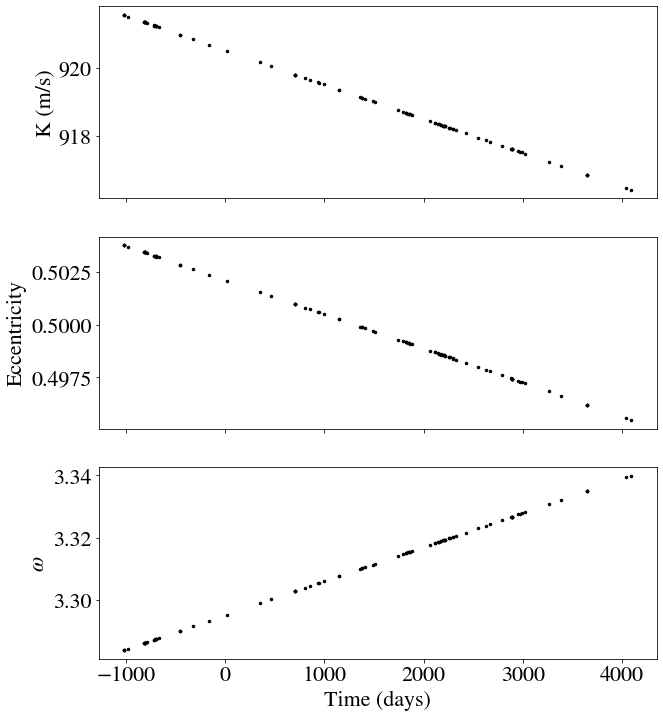

In [91]:
fig, axes = plt.subplots(3,1, figsize=(10, 12), sharex = True)

ax = axes[0]
ax.plot(time_np, K_list, ".", color='k')
ax.set_ylabel("K (m/s)")

ax = axes[1]
ax.plot(time_np, e_list, ".", color='k')
ax.set_ylabel("Eccentricity")

ax = axes[2]
ax.plot(time_np, om_list, ".", color='k')
ax.set_ylabel(r"$\omega$")
ax.set_xlabel("Time (days)")



Text(0, 0.5, 'K')

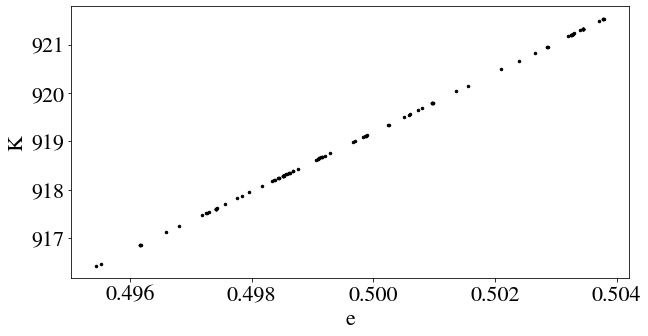

In [92]:
fig, ax = plt.subplots(1,1, figsize=(10, 5))
ax.plot(e_list, K_list, ".", color="k")
ax.set_xlabel("e")
ax.set_ylabel("K")

In [93]:
# Check wheher e and omega adhered to transit priors
flat_samples = out.get_chains(nthin =5, nburnin = nburnin, flat=True)
Mp_mcmc, logperiod_mcmc, tp_mcmc, e_mcmc, de_dt_mcmc_lb, om_mcmc,dom_dt_mcmc_lb, de2_dt2_mcmc, dom2_dt2_mcmc, Mp2_mcmc, logperiod2_mcmc, tp2_mcmc, e02_mcmc, de2_dt_mcmc, om02_mcmc,dom2_dt_mcmc, D1_mcmc,D2_mcmc,D3_mcmc, jit1_mcmc, jit2_mcmc, jit3_mcmc,  lin_mcmc, quad_mcmc= np.percentile(flat_samples[:, :], [16], axis=0)[0]
Mp_mcmc, logperiod_mcmc, tp_mcmc, e_mcmc, de_dt_mcmc_ub, om_mcmc,dom_dt_mcmc_ub, de2_dt2_mcmc, dom2_dt2_mcmc, Mp2_mcmc, logperiod2_mcmc, tp2_mcmc, e02_mcmc, de2_dt_mcmc, om02_mcmc,dom2_dt_mcmc, D1_mcmc,D2_mcmc,D3_mcmc, jit1_mcmc, jit2_mcmc, jit3_mcmc,  lin_mcmc, quad_mcmc = np.percentile(flat_samples[:, :], [84], axis=0)[0]
Mp_mcmc, logperiod_mcmc, tp_mcmc, e_mcmc, de_dt_mcmc, om_mcmc,dom_dt_mcmc, de2_dt2_mcmc, dom2_dt2_mcmc, Mp2_mcmc, logperiod2_mcmc, tp2_mcmc, e02_mcmc, de2_dt_mcmc, om02_mcmc,dom2_dt_mcmc, D1_mcmc,D2_mcmc,D3_mcmc, jit1_mcmc, jit2_mcmc, jit3_mcmc,  lin_mcmc, quad_mcmc = np.percentile(flat_samples[:, :], [50], axis=0)[0]

    
# for i in range(0, len(transit_times_list)):
#     print("e_transit:[%.4f, %.4f, %.4f], e_rv:%.4f "% (e_med_list[i], 
#                                                        e_med_list[i]-e_err,e_med_list[i]+e_err, 
#                                                        e_mcmc+de_dt_mcmc*transit_times_list[i]), 
#                                                        e_med_list[i]-e_err<e_mcmc+de_dt_mcmc*transit_times_list[i])<e_med_list[i]+e_err)
#     print("om_transit:[%.4f, %.4f, %.4f], om_rv:%.4f "% (om_med_list[i], 
#                                                          om_med_list[i]-om_err, om_med_list[i]+om_err, 
#                                                          om_mcmc+dom_dt_mcmc*transit_times_list[i])
#                                                          om_med_list[i]-om_err<om_mcmc+dom_dt_mcmc*transit_times_list[i])<om_med_list[i]+om_err)
#     print("             ")

dom_dt_mcmc*180/np.pi/(np.diff([dom_dt_mcmc,dom_dt_mcmc_lb])*180/np.pi)
dom_dt_mcmc*180/np.pi, np.diff([dom_dt_mcmc*180/np.pi, dom_dt_mcmc_lb*180/np.pi])[0], dom_dt_mcmc*180/np.pi/(np.diff([dom_dt_mcmc,dom_dt_mcmc_lb])*180/np.pi)


# compute significance of dom/dt and de/dt trends
de_dt_sigma = np.mean(np.abs([de_dt_mcmc_lb-de_dt_mcmc, de_dt_mcmc_ub-de_dt_mcmc]))
dom_dt_sigma = np.mean(np.abs([dom_dt_mcmc_lb-dom_dt_mcmc, dom_dt_mcmc_ub-dom_dt_mcmc]))

de_dt_signif = np.abs(de_dt_mcmc)/de_dt_sigma
dom_dt_signif = np.abs(dom_dt_mcmc)/dom_dt_sigma

print("$de/dt$ = %.3e  (%.1f$\sigma$),  $d\omega/dt$ = %.3e (%.1f$\sigma$)"%(de_dt_mcmc, de_dt_signif, dom_dt_mcmc, dom_dt_signif))

print(de_dt_mcmc,de_dt_sigma, dom_dt_mcmc, dom_dt_sigma)

$de/dt$ = -1.631e-06  (0.3$\sigma$),  $d\omega/dt$ = 1.094e-05 (2.1$\sigma$)
-1.6312528264007261e-06 5.040412424373588e-06 1.0939798579742694e-05 5.185640690218842e-06


0.5034465584183233 3.2862964284718825
0.5006032791581289 3.305364534843302
0.4986239418347892 3.31863871974478
0.49740727813288 3.326798126810783


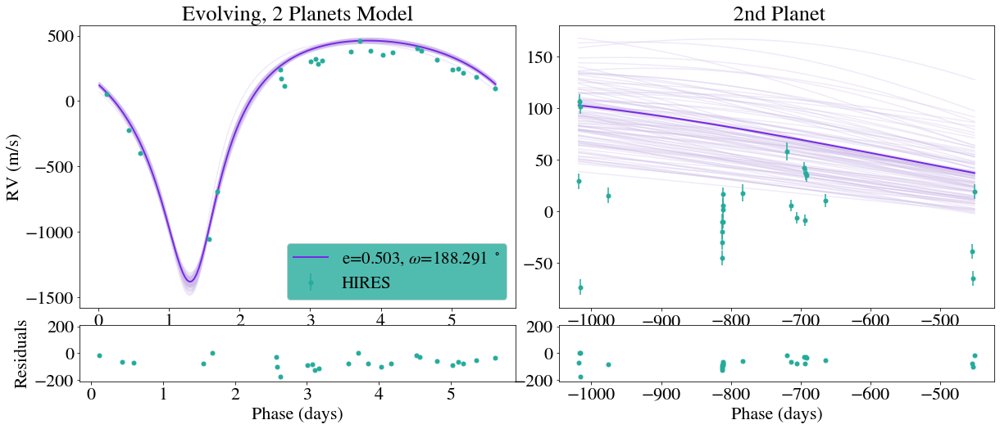

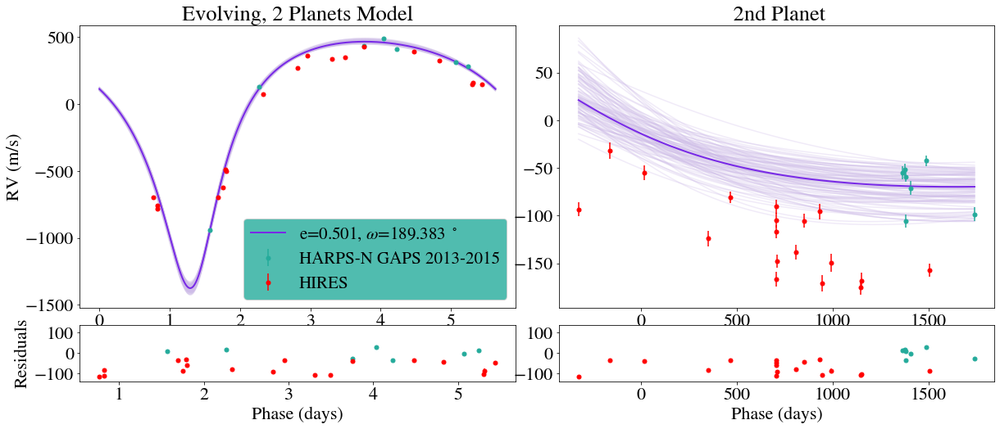

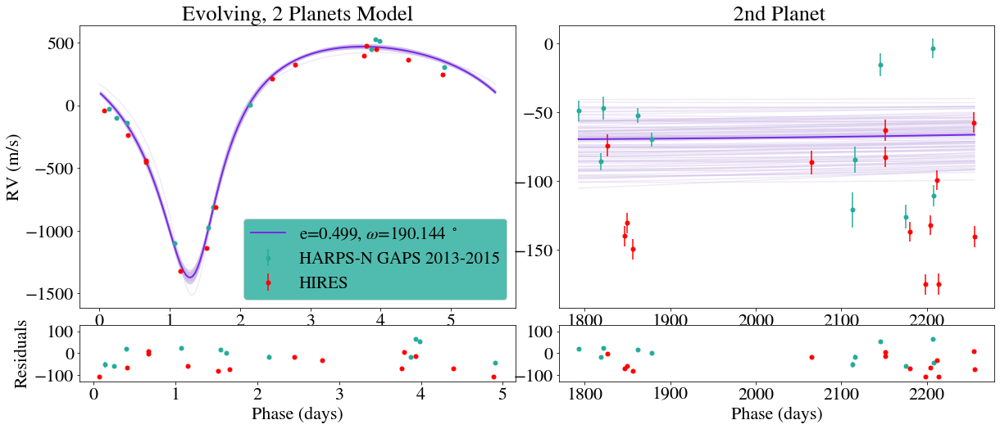

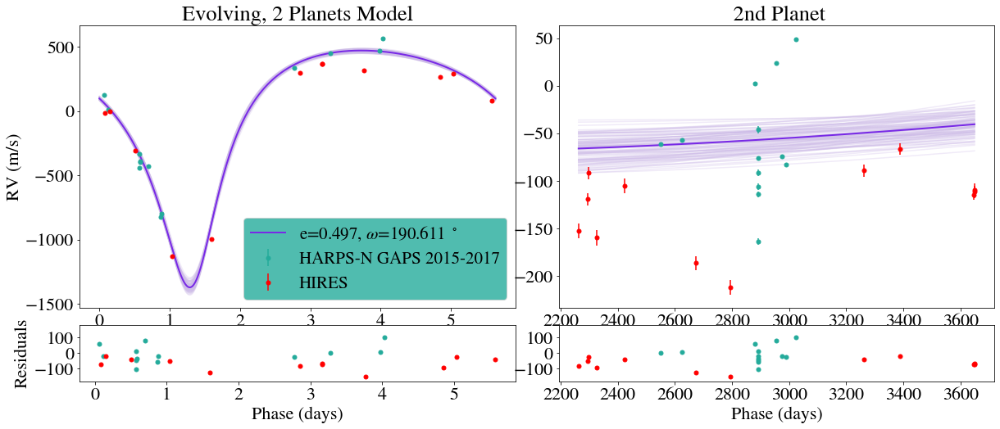

In [94]:
num_subsets = 4
len_data = len(time_np)
cutoff = int(len_data/num_subsets)
index_cutoff_1 = np.argmin(np.abs(time_ti-time_np[cutoff]))
index_cutoff_2 = np.argmin(np.abs(time_ti-time_np[2*cutoff]))
index_cutoff_3 = np.argmin(np.abs(time_ti-time_np[3*cutoff]))

time_chunk_d1 ="Data chunk 1: "
indexes = np.arange(0,cutoff)
e1 = np.median(np.array(e_list)[indexes])
om1 = np.median(np.array(om_list)[indexes])
D_s1,period_mcmc, df_di_sorted1, time_np1, rv_np1,y_preds_time_np_1, y_preds_time_np2_1, s_rv_np_1, instrument1= fair_draws_plot_chunk(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                out, 100, 10, instrument[indexes], time_chunk, eval_method,
               e1=e1, om1=om1, phase_plot=0.15, use_mass_parametrization=True)#, D_s=[69.61191521448582])

time_chunk_d2 ="Data chunk 2: "
indexes = np.arange(cutoff,2*cutoff)
e2 = np.median(np.array(e_list)[indexes])
om2 = np.median(np.array(om_list)[indexes])
D_s2, period_mcmc,df_di_sorted2, time_np2, rv_np2, y_preds_time_np_2, y_preds_time_np2_2, s_rv_np_2, instrument2= fair_draws_plot_chunk(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                out, 100, 10, instrument[indexes], time_chunk, eval_method,
                e1=e2, om1=om2, phase_plot=0.15,use_mass_parametrization=True)#, D_s=[141.3616907226685,69.61191521448582])#[141.3616907226685-50,69.61191521448582-50])#D_s=[141.3616907226685,69.61191521448582])

time_chunk_d3 ="Data chunk 3: "
indexes = np.arange(2*cutoff,3*cutoff)
e3 = np.median(np.array(e_list)[indexes])
om3 = np.median(np.array(om_list)[indexes])
D_s3, period_mcmc,df_di_sorted3, time_np3, rv_np3, y_preds_time_np_3, y_preds_time_np2_3, s_rv_np_3, instrument3= fair_draws_plot_chunk(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                out, 100, 10, instrument[indexes], time_chunk, eval_method,
                e1=e3, om1=om3, phase_plot=0.15,use_mass_parametrization=True)#, D_s=[141.3616907226685,69.61191521448582])#[141.3616907226685-150,69.61191521448582-100])

time_chunk_d4 ="Data chunk 4: "
indexes = np.arange(3*cutoff, 4*cutoff,)
e4 = np.median(np.array(e_list)[indexes])
om4 = np.median(np.array(om_list)[indexes])
D_s4, period_mcmc,df_di_sorted4, time_np4, rv_np4, y_preds_time_np_4, y_preds_time_np2_4, s_rv_np_4, instrument4= fair_draws_plot_chunk(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                out, 100, 10, instrument[indexes], time_chunk, eval_method,
                e1=e4, om1=om4, phase_plot=0.15, use_mass_parametrization=True)#,D_s=[129.30096314992323, 69.61191521448582])#[129.30096314992323-100, 69.61191521448582-100])


$de/dt$ = -1.631e-06  (0.3$\sigma$),  $d\omega/dt$ = 1.094e-05 (2.1$\sigma$)


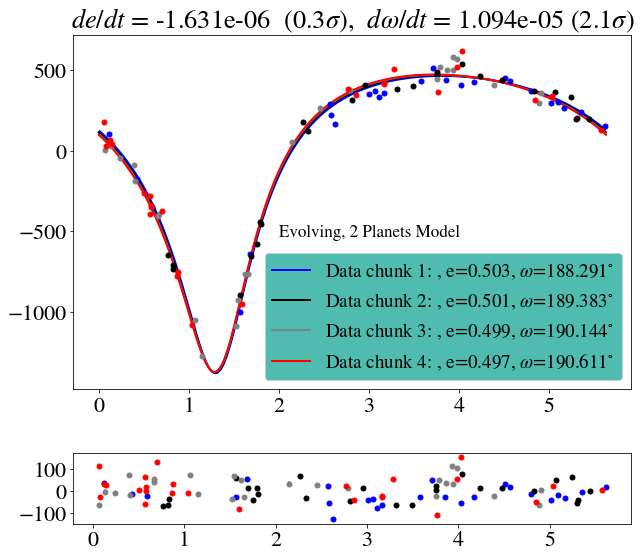

In [95]:
fig, axes = plt.subplots(2,1, figsize=(10, 9),  gridspec_kw={'height_ratios': [3, 0.6]})
fig.subplots_adjust(hspace=0.3, wspace=0.0)

extra_offset = 50

color1 = 'b'
RV_plotter_without_offset_corr(instrument1, D_s1, axes, color1, rv_np1+extra_offset, s_rv_np_1, time_np1, period_mcmc,
                                  y_preds_time_np_1, y_preds_time_np2_1)
ax = axes[0]
ax.plot(df_di_sorted1['phase'], df_di_sorted1['rvs'], color=color1, linewidth=2,
        label=time_chunk_d1+", e="+str(round(e1,3))+", $\omega$="+str(round(om1*180/np.pi,3))+"$^{\circ}$")


color2 = 'k'
RV_plotter_without_offset_corr(instrument2, D_s2, axes, color2, rv_np2+extra_offset, s_rv_np_2, time_np2, period_mcmc,
                                  y_preds_time_np_2, y_preds_time_np2_2)
ax = axes[0]
ax.plot(df_di_sorted2['phase'], df_di_sorted2['rvs'], color=color2, linewidth=2,
        label=time_chunk_d2+", e="+str(round(e2,3))+", $\omega$="+str(round(om2*180/np.pi,3))+"$^{\circ}$")

color3 = 'grey'
RV_plotter_without_offset_corr(instrument3, D_s3, axes, color3, rv_np3+extra_offset, s_rv_np_3, time_np3, period_mcmc,
                                  y_preds_time_np_3, y_preds_time_np2_3)
ax = axes[0]
ax.plot(df_di_sorted3['phase'], df_di_sorted3['rvs'], color=color3, linewidth=2,
        label=time_chunk_d3+", e="+str(round(e3,3))+", $\omega$="+str(round(om3*180/np.pi,3))+"$^{\circ}$")

color4 = 'red'
RV_plotter_without_offset_corr(instrument4, D_s4, axes, color4, rv_np4+extra_offset, s_rv_np_4, time_np4, period_mcmc,
                                  y_preds_time_np_4, y_preds_time_np2_4)
ax = axes[0]
ax.plot(df_di_sorted4['phase'], df_di_sorted4['rvs'], color=color4, linewidth=2,
        label=time_chunk_d4+", e="+str(round(e4,3))+", $\omega$="+str(round(om4*180/np.pi,3))+"$^{\circ}$")



ax.legend(loc="lower right")
legend = ax.legend(loc="lower right", prop={'size': 19}, facecolor='#24ab9b')
plt.setp(legend.get_texts(), color='k')
len(rv_np1)

axes[0].set_title("$de/dt$ = %.3e  (%.1f$\sigma$),  $d\omega/dt$ = %.3e (%.1f$\sigma$)"%(de_dt_mcmc, de_dt_signif, dom_dt_mcmc, dom_dt_signif))

txt = axes[0].text(2, -530, s=(eval_method), ha='left', wrap=True, size = 17)
txt._get_wrap_line_width = lambda : 350.  #  wrap to 600 screen pixels

print("$de/dt$ = %.3e  (%.1f$\sigma$),  $d\omega/dt$ = %.3e (%.1f$\sigma$)"%(de_dt_mcmc, de_dt_signif, dom_dt_mcmc, dom_dt_signif))

eval_method, "red chi^2 = %.3f, BIC = %.3f, AIC = %.3f,"%(chisq, BIC, AIC)
plt.savefig(signif_name_p)


In [96]:
data_signficance ={'model': eval_method,
                'chisq':chisq_k, 
                'AIC':AIC, 
                'BIC': BIC, 
                'de_dt': df_p['de/dt_mcmc'],
                'de_dt_sig':de_dt_signif,
                'dom_dt': df_p["dom/dt_mcmc"],
                'dom_dt_sig': dom_dt_signif,
                }

df_significance = pd.DataFrame(data = data_signficance, index=[0])
df_significance.to_csv(csv_name_p_signif)

<a id='2planet_evolving_lin'></a>
## 2 Planet Model, evolving orbit (de/dt, d$\omega$/dt) for primary, 2nd companion = linear background trend

In [153]:
# Re-Load 5 RV datasets without RM measurements

# open npz file
outfile = 'data/Five_RV_datasets.npz'#'NEW_DRS2_3_1_10s_norm.npz'

min_time_sub = 2455000#3980

npzfile = np.load(outfile, allow_pickle=True)
npzfile.files

data = {npzfile.files[0]: npzfile[npzfile.files[0]],
       npzfile.files[1]: npzfile[npzfile.files[1]],
       npzfile.files[2]: npzfile[npzfile.files[2]],
       npzfile.files[3]: npzfile[npzfile.files[3]],
       npzfile.files[4]: npzfile[npzfile.files[4]]}
df_used = pd.DataFrame(data=data)
df_used.head(10)
df_used = df_used[df_used['instrument_merged']!="Lick"][df_used['instrument_merged']!="SOPHIE"]
df_used = df_used.reset_index(drop=True)
df_used = df_used.sort_values(by=['bjd_merged']).reset_index(drop=True)
print(np.unique(df_used['instrument_merged']))


# format data for mcmc fit
rv_np = np.array(list(df_used["mnvel_merged"]-np.mean(df_used["mnvel_merged"])))
s_rv_np = np.array(list(df_used["errvel_merged"]))
time_np = np.array(df_used["bjd_merged"])-min_time_sub#-np.min(df_used["bjd_merged"])
time_min = np.min(df_used["bjd_merged"])
time_np_plus_min = time_np+time_min
instrument = df_used["instrument_merged"]

['HARPS-N GAPS 2013-2015' 'HARPS-N GAPS 2015-2017' 'HIRES']


In [154]:
# CHANGE THIS
num_instr = len(np.unique(instrument))
eval_method = "Evolving, 2 Planets Model (keplerian + linear)"#, "+str(num_instr)+" Instruments"
#freeze_jitter = True
tp_288 = False#True
use_mass_parametrization = True # False

#if tp_288:
#    eval_method = "Evolving, 2 Planets Model, T_p=288 "+str(num_instr)+" Instruments"

# Set fixed params 
jitterpar = 40#80#41.808
M1 = 1.34 # Msolar
#nwalkers = 200
#nlinks = 4000#4000#5000#7000#5000#2000 #0
#nburnin = 3000#4000#5000#4000#500#1000#00

# params that go into theta
K = 932.3
Mp = 9.021
logP = np.log10(5.633473128700384)
e0 = 0.5005 #0.52
de_dt = 4.419e-6
dom_dt = 2e-6
om0 = 188.01*(np.pi/180) #(Ment et al 2018) #187.890*(np.pi/180)#3.280893202442646
tp =  get_periastron_time(5.63346961, om0, e0, 2455756.42709)-min_time_sub#2463982.4915-min_time_sub-0.5#(Ment et al 2018) #get_periastron_time(10**logP, om0, e0, 2455288.84969-min_time_sub)#288.0376218364072-0.11 #289.9##-0.2#289.7#-2# -1.8#-0.1# 288.1-0.2#

if tp_288:
    tp =  get_periastron_time(5.63346961, om0, e0, 2455288.84910)-min_time_sub#2463982.4915-min_time_sub-0.5#(Ment et al 2018) #get_periastron_time(10**logP, om0, e0, 2455288.84969-min_time_sub)#288.0376218364072-0.11 #289.9##-0.2#289.7#-2# -1.8#-0.1# 288.1-0.2#


#eval_method += ", tp = %.2f"%tp
    
D1 = 69+50#69.48684878396841+70#140.88431672328488#1.485e2#152.86247321588866 #120#-35#-5#25.48987114398128
D2 = 129.56572438802945#1.386e2#+120
D3 = 69.48684878396841#7.685e1#70

if num_instr==1:
    D1 = 69-50

#D1=1.485𝑒+021.680𝑒+01−1.685𝑒+01
#D2=1.386𝑒+022.367𝑒+01−2.387𝑒+01
#D3=7.685𝑒+011.012𝑒+01−9.748𝑒+00

jit1 = 37.45343836780902#40
jit2 = 68.41894749724969#40
jit3 = 37.28477499406473#40
# D1 = 50#152.86247321588866 #120#-35#-5#25.48987114398128
# D2 = -100 
# D3 = 0
# jit1 = 40
# jit2 = 40
# jit3 = 40
lin = -1.2e-2##-0.8e-1#-1.1e-1#-1.1e-1     - frozen version -4.546e-02
quad = 0#1.8e-5 #2.0065437331192983e-05#2e-5

tp2 =0


#theta =  np.array([K,logP, tp, e0, de_dt, om0, dom_dt, D1,D2,D3, lin, quad])
#nfree_params = len(theta)

# priors
pr_K=[800,1300]
w_Mp = 0.01*Mp
pr_Mp = [Mp-1, Mp+1]
pr_logP=[np.nan,np.nan ]#[0, np.log10(10)]
pr_tp=[np.nan,np.nan ]#[285, 290]
pr_e=[0.3,0.7]
pr_D1=[-200, 200]
pr_D2 = [-500, 200]
pr_D3 = [-200, 200]
pr_om=[0, 6.28]
pr_jit1 = [0,100]#[0,100]
pr_jit2 = [-1,100]
pr_jit3 = [-1,100]

# gauss priors
gausspriors =False      #P, tp, D1, 'jit1', 'lin', 'quad'
gauss_theta_indexes = [1,2]#, 16, 19, 22, 23]#, 3]
gauss_theta_priors =[5.63346961, tp]#, D1, jit1, lin, quad]#, e0]#, 0.50833] # Ivshina & Winn 2022, Bonomo et al. 2017
gauss_theta_err = [6.4e-07,3.4e-4]#, 1.076e+01, 4.371e+00, 1.883e-02, 5.574e-06]#, 4.2e-4] #8.2e-4 Ivshina & Winn 2022, de Wit et al. 2017, Bonomo et al. 2017

#if gausspriors:
#    eval_method += ", Gauss priors on P, tp"
#else:
#    eval_method += ", No Gauss priors on P, tp"


# e and omega priors from Spitzer
transitpriors = False
de_dt_transits = 8.9e-4/365.24  #8.9e-4 per year (de Wit et al 2017)
e0_transits = 0.51023-(de_dt_transits)*1000
e_med_list = (e0_transits + de_dt_transits*(df_transit_times_with_eclipses["transit_time"]-min_time_sub)).tolist()
e_err =  4e-3 # uncertainty de Wit et al 2017

dom_dt_transits = 0.91/365.24/180*np.pi #0.91 degrees per year(de Wit et al 2017)
om0_transits = (188.44/180*np.pi)-(dom_dt_transits)*1000
om_med_list = (om0_transits + dom_dt_transits*(df_transit_times_with_eclipses["transit_time"]-min_time_sub)).tolist()
om_err =  (0.31/180*np.pi) # uncertainty de Wit et al 2017

transit_times_list = (df_transit_times_with_eclipses["transit_time"]-min_time_sub).tolist()


# widths
w_K=0.01*K
w_logP =10**(logP)*1e-7
w_tp = 2e-6#0.02*10**(logP)
w_e = 2e-2
w_de_dt = 2e-6
w_om = 5e-2
w_dom_dt = 2e-5
w_D1 = 2
w_lin=1e-2 #0
w_quad=0#1e-5 #0
w_jit1 = 5

if num_instr ==1:
    w_D2 = 0
    w_D3 = 0
    w_jit2 = 0
    w_jit3 = 0
elif num_instr ==2:
    w_D2 = 5
    w_D3 = 0
    w_jit2 = 5
    w_jit3 = 0
else:
    w_D2 = 5
    w_D3 = 5
    w_jit2 = 5
    w_jit3 = 5
    
if freeze_jitter:
    
    if num_instr == 1:
        jit1 = 40.76037629904555
        w_jit1 = 0
    else:
        jit1 = 35.15721038710301
        jit2 = 62.63228448817992
        jit3 = 40.76037629904555
        w_jit1 = 0
        w_jit2 = 0
        w_jit3 = 0


print("widths:",[w_K, w_D1, w_logP, w_tp, w_de_dt, w_e, w_dom_dt, w_om])

widths = np.array([w_K, w_logP, w_tp, w_e,w_de_dt, w_om, w_dom_dt,w_lin, w_quad, w_D1, w_D2, w_D3, w_jit1, w_jit2, w_jit3])
nfree_params = len(widths[np.nonzero(widths)])

if use_mass_parametrization:
    labels = ["Mp", "LogP", "Tp", "e0", "de/dt","om0","dom/dt","de^2/dt^2", "dom^2/dt^2",
          "Mp2", "LogP2", "Tp2", "e02", "de/dt_2","om02","dom/dt_2",
          "D1","D2","D3", "jit1","jit2","jit3","lin", "quad"]
else:
    labels = ["Amplitude", "LogP", "Tp", "e0", "de/dt","om0","dom/dt","de^2/dt^2", "dom^2/dt^2",
          "Amplitude2", "LogP2", "Tp2", "e02", "de/dt_2","om02","dom/dt_2",
          "D1","D2","D3", "jit1","jit2","jit3","lin", "quad"]


# labels = ["Amplitude", "LogP", "Tp", "e0", "de/dt","om0","dom/dt",
#           "Amplitude2", "LogP2", "Tp2", "e02", "de/dt_2","om02","dom/dt_2",
#           "D1","D2","D3","jit1","jit2","jit3", "lin", "quad"]

len([w_K, w_D1, w_logP, w_tp, w_de_dt, w_e, w_dom_dt, w_om])
nfree_params

e_med_list, tp, eval_method

widths: [9.323, 2, 5.633473128700384e-07, 2e-06, 2e-06, 0.02, 2e-05, 0.05]


([0.5084971040370713,
  0.5096364700287487,
  0.5096501998202786,
  0.513521320052181],
 757.0644287462346,
 'Evolving, 2 Planets Model (keplerian + linear)')

[-1018.221759 -1018.121759 -1018.021759 ...  4092.478241  4092.578241
  4092.678241]


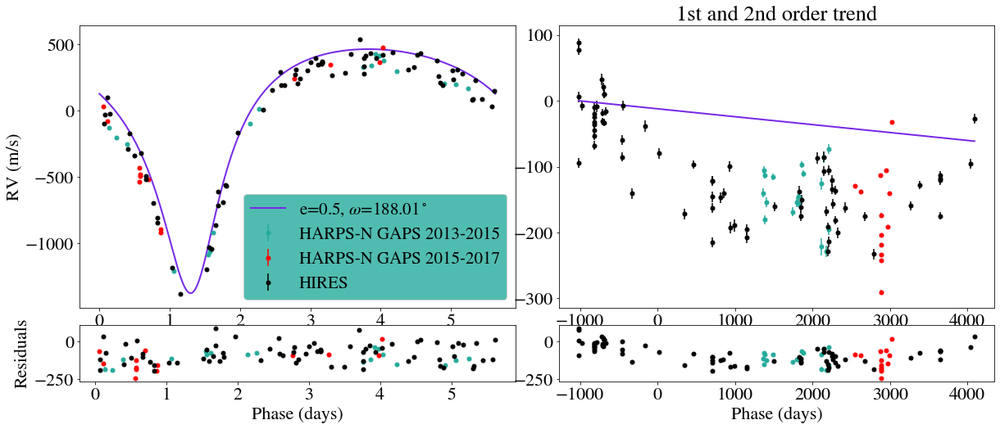

In [155]:
wobble = wobble_edmcmc_ttv.wobble_edmcmc(time_np, rv_np, s_rv_np,labels,
                                    M1, nwalkers, nlinks, nburnin,nfree_params, ncores=num_cpus_to_use,
                                    w_K=w_K, w_Mp = w_Mp, w_logP=w_logP, w_tp=w_tp, w_e=w_e,w_de_dt=w_de_dt, w_om=w_om,
                                    w_dom_dt =w_dom_dt, w_jit1 = w_jit1, w_jit2= w_jit2,w_jit3=w_jit3, 
                                    w_D1=w_D1, w_D2 =w_D2, w_D3 = w_D3,
                                    w_lin = w_lin, w_quad = w_quad, 
                                    K=K, Mp=Mp, logP=logP, tp=tp, e0=e0,de_dt=de_dt, D1=D1, D2=D2, D3=D3,
                                    jit1 = jit1, jit2=jit2, jit3=jit3, 
                                    om0=om0,dom_dt=dom_dt, lin=lin, quad=quad,
                                    pr_Mp=pr_Mp, pr_K=pr_K, pr_logP = pr_logP,pr_tp = pr_tp,pr_e=pr_e, 
                                    pr_D1=pr_D1, pr_D2= pr_D2, pr_D3 = pr_D3, 
                                    pr_om=pr_om, pr_jit1 = pr_jit1, pr_jit2 = pr_jit2, pr_jit3 = pr_jit3,
                                    telescopes = instrument,phase_plot=0.15,
                                    gausspriors=gausspriors, gauss_theta_indexes=gauss_theta_indexes,
                                    gauss_theta_priors=gauss_theta_priors, gauss_theta_err=gauss_theta_err,
                                    use_mass_parametrization=True)#,

df1, df2 = wobble.initial_guess_plot()

In [156]:

Mp = wobble.Mp_from_K()#[0]
Mp
wobble.width

# Run mcmc
out = wobble.wobble_mcmc()

# write results to file

# create a folder and file structure based on eval_method and date_time
date = datetime.today()#.isoformat()
dir_day = "Results/csvs_"+date.strftime("%y_%m_%d")

# check if directory exists. Otherwise, create directory
if not os.path.isdir(dir_day):
    os.mkdir(dir_day)
    
if use_mass_parametrization:
    extra_file_name = "mass_parametrization_"
else:
    extra_file_name = "K_parametization_"
    
if freeze_jitter:
    time_name = date.strftime("%H_%M_%S%p")   
    csv_name = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+".csv"
    csv_name_p = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.csv"
    npz_name_chains = dir_day+"/"+eval_method+"freeze_jitter"+extra_file_name+time_name+"_chains.npz"
    csv_name_p_signif = dir_day+"/Signif_"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.csv"
    pdf_name = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+".pdf"
    png_name = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+".png"
    png_name_p = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.png"  
    signif_name_p = dir_day+"/signif_"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.png"
else:
    time_name = date.strftime("%H_%M_%S%p")   
    csv_name = dir_day+"/"+eval_method+" "+extra_file_name+time_name+".csv"
    csv_name_p = dir_day+"/"+eval_method+" "+extra_file_name+time_name+"_PAPER.csv"
    csv_name_p_signif = dir_day+"/Signif_"+eval_method+" "+extra_file_name+time_name+"_PAPER.csv"
    npz_name_chains = dir_day+"/"+eval_method+" "+extra_file_name+time_name+"_chains.npz"
    pdf_name = dir_day+"/"+eval_method+" "+extra_file_name+time_name+".pdf"
    png_name = dir_day+"/"+eval_method+" "+extra_file_name+time_name+".png"
    png_name_p = dir_day+"/"+eval_method+" "+extra_file_name+time_name+"_PAPER.png"
    signif_name_p = dir_day+"/signif_"+eval_method+" "+extra_file_name+time_name+"_PAPER.png"

0 days, 00:00:00.0 remains. Link 5000 of 5000. Acceptance rate = 0.26
9.187447385850705 +/- 0.1047380467721901 ;     0.7507888855993916 +/- 3.192184931010223e-06


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

_____________________________


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

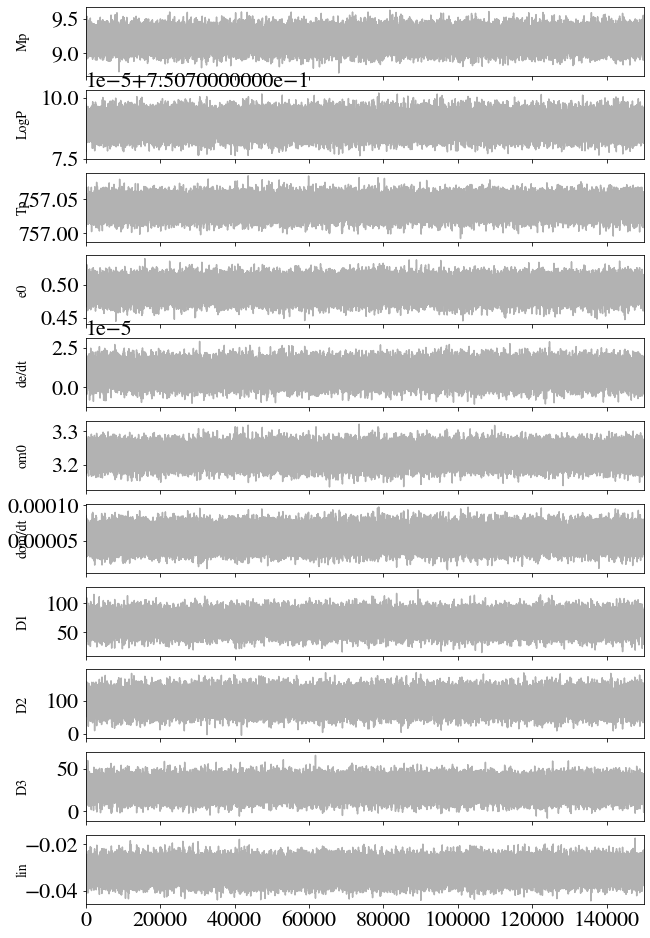

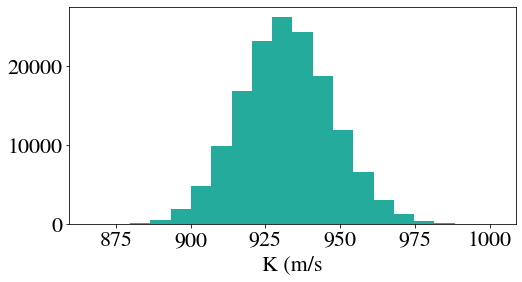

0.49354140893340126 3.2287312891401383


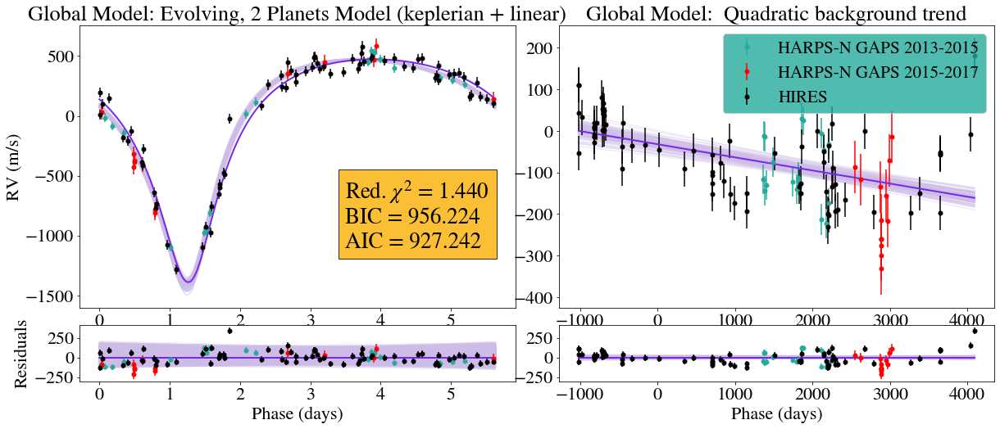

0.49354140893340126 3.2287312891401383


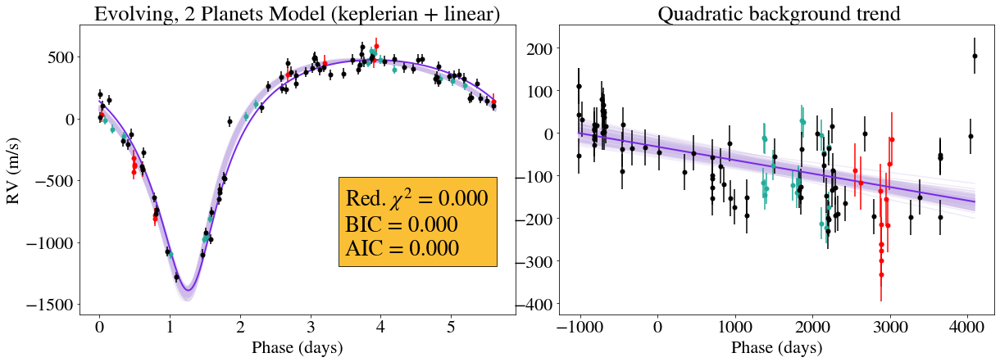

0.4867483739618946 3.187216771000114


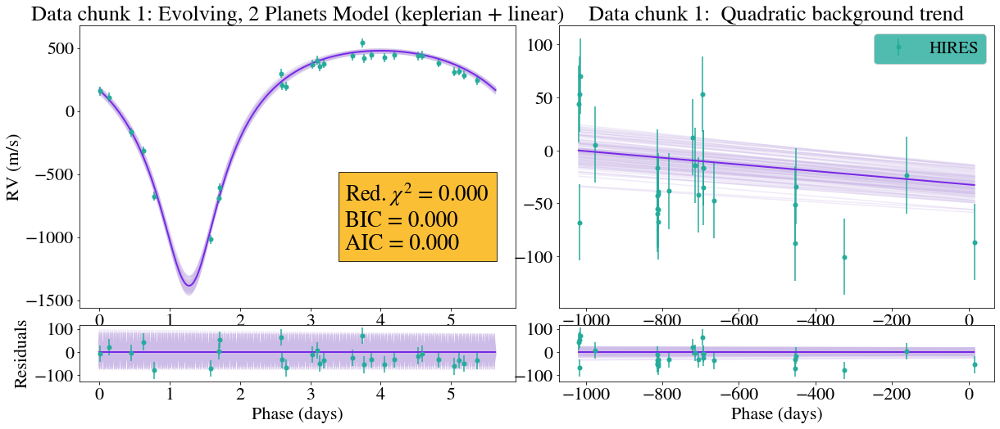

0.5019298466773199 3.2785081404157106


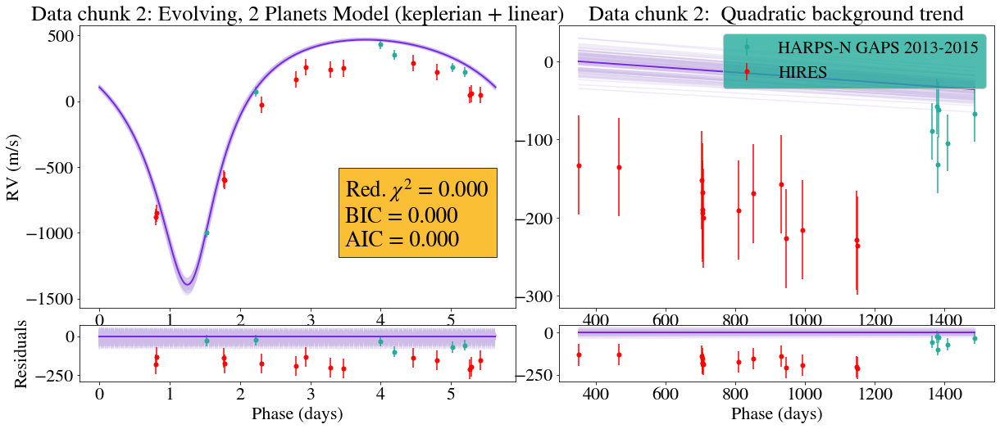

0.5130401286204574 3.345318052220371


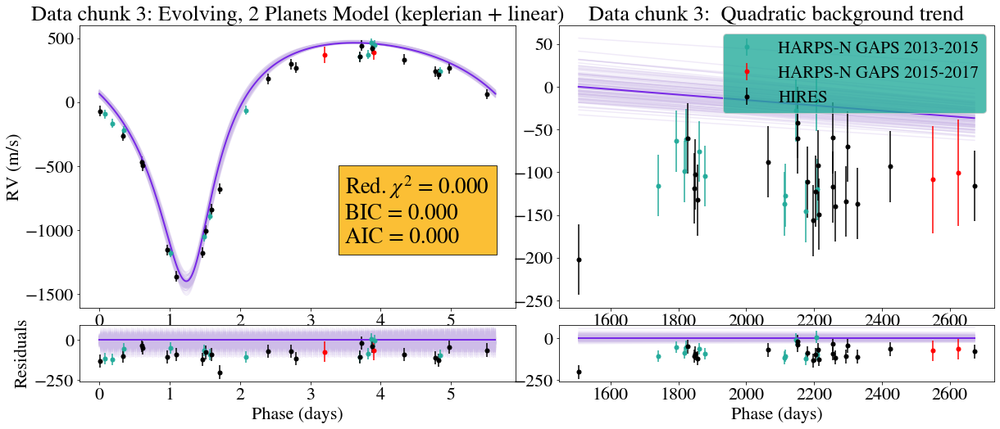

0.5202866528510771 3.3888938720974773


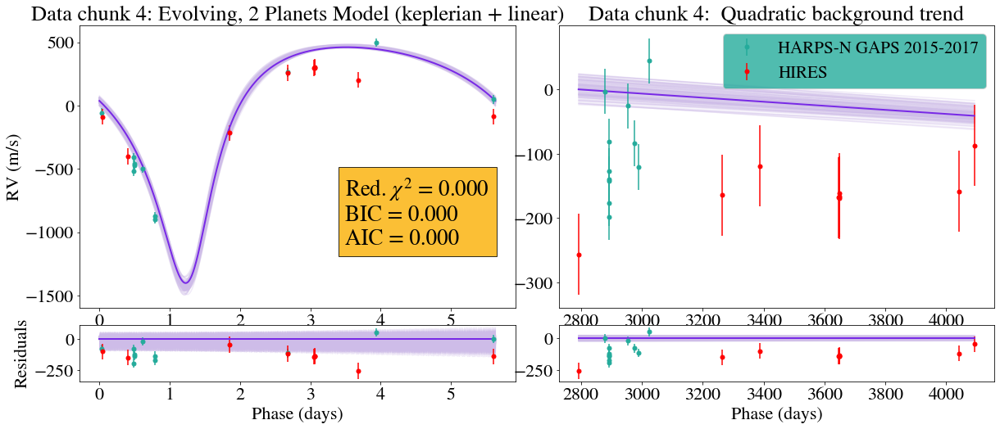

In [157]:
# retrieve eval metrics
# optional to change burnin
#nburnin = 1800

loglikelihood, chisq, AIC, BIC, gelman_values, gelman_labels, om_list, e_list, sigma1, chisq_k, K_list, K2_list = wobble.metrics(out, nburnin)
print("_____________________________")

# Display mcmc 16th, 50th, and 86th percentiles AND write results to a file
df, varying_labels, varying_chains_np, df_p= display_mcmc_percentiles(out, labels, nburnin, loglikelihood, chisq_k, AIC, BIC, gelman_values, gelman_labels, 
                         eval_method,csv_name, csv_name_p)

# Save the mcmc results such that plots can be made later with the mcmc samples
flat_samples = out.get_chains(nthin =5, nburnin = nburnin, flat=True)

np.savez(npz_name_chains,
        flat_samples=flat_samples)

# Save Figures into pdf file
with PdfPages(pdf_name) as pdf:

    # plot chains. Set varying_only=True to only display varying params
    chains_plot(out, labels, nburnin, varying_only=True)
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()
    
    # produce corner plots. Specify label_indexes to only plot a subset of varying params.
    #label_indexes = [0,1,2]
    #corner_plot(out, nburnin, labels, eval_method)#, label_indexes)
    #pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    #plt.show()
    #plt.close()
    
    # Plot a histogram of planet mass(es)
    Mass1 = K_hist(out, nburnin)
    Mass1
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()
    
    time_chunk = "Global Model: "
    fair_draws_plot(time_np, rv_np, s_rv_np, out, 100, 10, instrument, time_chunk, eval_method, phase_plot=0.15,
                   chisq=chisq_k, AIC=AIC, BIC=BIC, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig()  # saves the current figure into a pdf page
    plt.savefig(png_name)
    plt.show()
    plt.close()
    
    time_chunk = ""
    fair_draws_plot(time_np, rv_np, s_rv_np, out, 100, 10, instrument, time_chunk, eval_method, phase_plot=0.15,
                   residuals=False, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig()  # saves the current figure into a pdf page
    plt.savefig(png_name_p)
    plt.show()
    plt.close()
    
    # plot individual 1/4th chunks
    plt.rcParams['font.size'] =22
    num_subsets = 4
    len_data = len(time_np)
    cutoff = int(len_data/num_subsets)
    time_ti = np.linspace(np.min(time_np), np.max(time_np), 10000)
    index_cutoff_1 = np.argmin(np.abs(time_ti-time_np[cutoff]))
    index_cutoff_2 = np.argmin(np.abs(time_ti-time_np[2*cutoff]))
    index_cutoff_3 = np.argmin(np.abs(time_ti-time_np[3*cutoff]))
    
    cutoff_even = int(len(time_ti)/num_subsets)
    index_cutoff_e_1 = np.argmin(np.abs(time_np-time_ti[cutoff_even]))
    index_cutoff_e_2 = np.argmin(np.abs(time_np-time_ti[2*cutoff_even]))
    index_cutoff_e_3 = np.argmin(np.abs(time_np-time_ti[3*cutoff_even]))
    
    cutoff_20 = int(len_data/num_subsets)
    index_cutoff_20_1 = np.argmin(np.abs(time_np-time_ti[cutoff_20]))
    index_cutoff_20_2 = np.argmin(np.abs(time_np-time_ti[2*cutoff_20]))
    index_cutoff_20_3 = np.argmin(np.abs(time_np-time_ti[3*cutoff_20]))


    time_chunk ="Data chunk 1: "
    indexes = np.arange(0,index_cutoff_e_1)
    e1 = np.median(np.array(e_list)[indexes])
    om1 = np.median(np.array(om_list)[indexes])
    fair_draws_plot(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                    out, 100, 10, instrument[indexes], time_chunk, eval_method,
                   e1=e1, om1=om1, phase_plot=0.15, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()


    time_chunk ="Data chunk 2: "
    indexes = np.arange(index_cutoff_e_1, index_cutoff_e_2)
    e1 = np.median(np.array(e_list)[indexes])
    om1 = np.median(np.array(om_list)[indexes])
    fair_draws_plot(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                    out, 100, 10, instrument[indexes], time_chunk, eval_method,
                   e1=e1, om1=om1, phase_plot=0.15, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()

    time_chunk ="Data chunk 3: "
    indexes = np.arange(index_cutoff_e_2, index_cutoff_e_3)
    e1 = np.median(np.array(e_list)[indexes])
    om1 = np.median(np.array(om_list)[indexes])
    fair_draws_plot(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                    out, 100, 10, instrument[indexes], time_chunk, eval_method,
                   e1=e1, om1=om1, phase_plot=0.15, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()

    time_chunk ="Data chunk 4: "
    indexes = np.arange(index_cutoff_e_3, len_data)
    e1 = np.median(np.array(e_list)[indexes])
    om1 = np.median(np.array(om_list)[indexes])
    fair_draws_plot(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                    out, 100, 10, instrument[indexes], time_chunk, eval_method,
                   e1=e1, om1=om1, phase_plot=0.15, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()

In [158]:
# Check wheher e and omega adhered to transit priors
flat_samples = out.get_chains(nthin =5, nburnin = nburnin, flat=True)
Mp_mcmc, logperiod_mcmc, tp_mcmc, e_mcmc, de_dt_mcmc_lb, om_mcmc,dom_dt_mcmc_lb, de2_dt2_mcmc, dom2_dt2_mcmc, Mp2_mcmc, logperiod2_mcmc, tp2_mcmc, e02_mcmc, de2_dt_mcmc, om02_mcmc,dom2_dt_mcmc, D1_mcmc,D2_mcmc,D3_mcmc, jit1_mcmc, jit2_mcmc, jit3_mcmc,  lin_mcmc, quad_mcmc = np.percentile(flat_samples[:, :], [16], axis=0)[0]
Mp_mcmc, logperiod_mcmc, tp_mcmc, e_mcmc, de_dt_mcmc_ub, om_mcmc,dom_dt_mcmc_ub, de2_dt2_mcmc, dom2_dt2_mcmc, Mp2_mcmc, logperiod2_mcmc, tp2_mcmc, e02_mcmc, de2_dt_mcmc, om02_mcmc,dom2_dt_mcmc, D1_mcmc,D2_mcmc,D3_mcmc, jit1_mcmc, jit2_mcmc, jit3_mcmc,  lin_mcmc, quad_mcmc = np.percentile(flat_samples[:, :], [84], axis=0)[0]
Mp_mcmc, logperiod_mcmc, tp_mcmc, e_mcmc, de_dt_mcmc, om_mcmc,dom_dt_mcmc, de2_dt2_mcmc, dom2_dt2_mcmc, Mp2_mcmc, logperiod2_mcmc, tp2_mcmc, e02_mcmc, de2_dt_mcmc, om02_mcmc,dom2_dt_mcmc, D1_mcmc,D2_mcmc,D3_mcmc, jit1_mcmc, jit2_mcmc, jit3_mcmc,  lin_mcmc, quad_mcmc = np.percentile(flat_samples[:, :], [50], axis=0)[0]

    
# for i in range(0, len(transit_times_list)):
#     print("e_transit:[%.4f, %.4f, %.4f], e_rv:%.4f "% (e_med_list[i], 
#                                                        e_med_list[i]-e_err,e_med_list[i]+e_err, 
#                                                        e_mcmc+de_dt_mcmc*transit_times_list[i]), 
#                                                        e_med_list[i]-e_err<e_mcmc+de_dt_mcmc*transit_times_list[i])<e_med_list[i]+e_err)
#     print("om_transit:[%.4f, %.4f, %.4f], om_rv:%.4f "% (om_med_list[i], 
#                                                          om_med_list[i]-om_err, om_med_list[i]+om_err, 
#                                                          om_mcmc+dom_dt_mcmc*transit_times_list[i])
#                                                          om_med_list[i]-om_err<om_mcmc+dom_dt_mcmc*transit_times_list[i])<om_med_list[i]+om_err)
#     print("             ")

dom_dt_mcmc*180/np.pi/(np.diff([dom_dt_mcmc,dom_dt_mcmc_lb])*180/np.pi)
dom_dt_mcmc*180/np.pi, np.diff([dom_dt_mcmc*180/np.pi, dom_dt_mcmc_lb*180/np.pi])[0], dom_dt_mcmc*180/np.pi/(np.diff([dom_dt_mcmc,dom_dt_mcmc_lb])*180/np.pi)


# compute significance of dom/dt and de/dt trends
de_dt_sigma = np.mean(np.abs([de_dt_mcmc_lb-de_dt_mcmc, de_dt_mcmc_ub-de_dt_mcmc]))
dom_dt_sigma = np.mean(np.abs([dom_dt_mcmc_lb-dom_dt_mcmc, dom_dt_mcmc_ub-dom_dt_mcmc]))

de_dt_signif = np.abs(de_dt_mcmc)/de_dt_sigma
dom_dt_signif = np.abs(dom_dt_mcmc)/dom_dt_sigma

print("$de/dt$ = %.3e  (%.1f$\sigma$),  $d\omega/dt$ = %.3e (%.1f$\sigma$)"%(de_dt_mcmc, de_dt_signif, dom_dt_mcmc, dom_dt_signif))

print(de_dt_mcmc,de_dt_sigma, dom_dt_mcmc, dom_dt_sigma)

$de/dt$ = 8.982e-06  (1.9$\sigma$),  $d\omega/dt$ = 5.401e-05 (5.1$\sigma$)
8.98191642630231e-06 4.737069605195812e-06 5.4011324586477435e-05 1.067570287664391e-05


0.48621610179063157 3.1840160370313306
0.5018716128667743 3.2781579606663116
0.5127701333964975 3.3436944789219822
0.5194692615221947 3.383978619462844


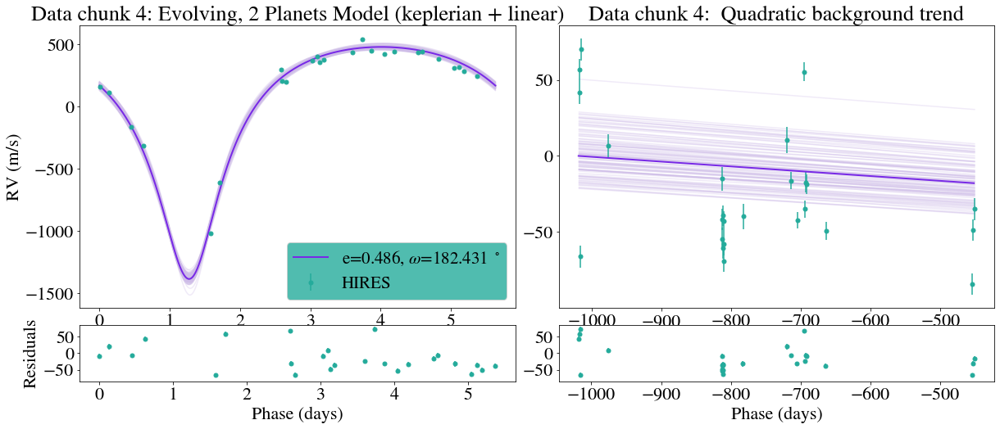

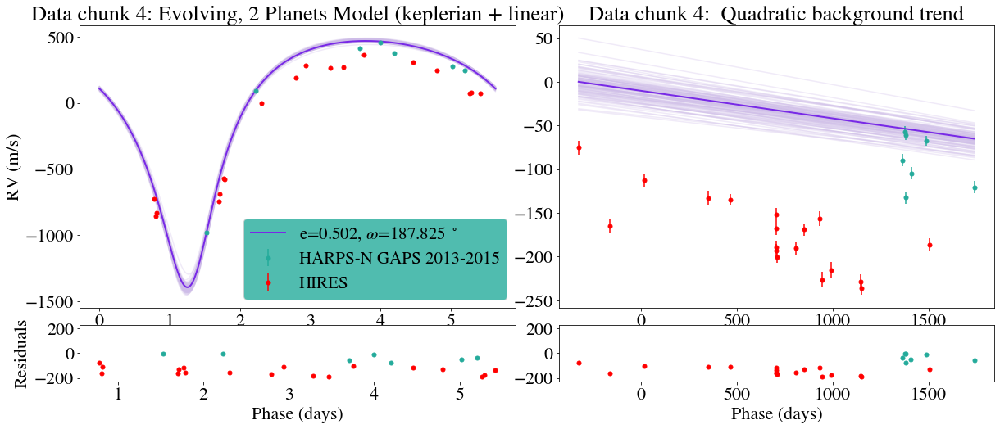

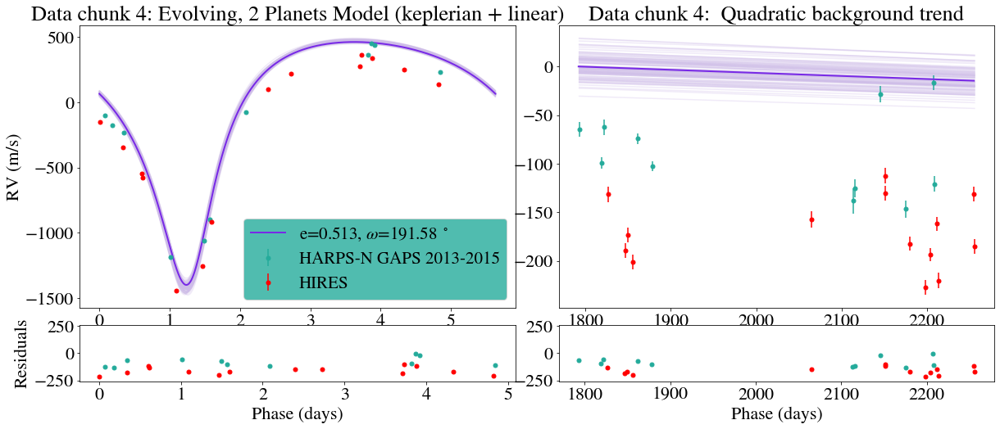

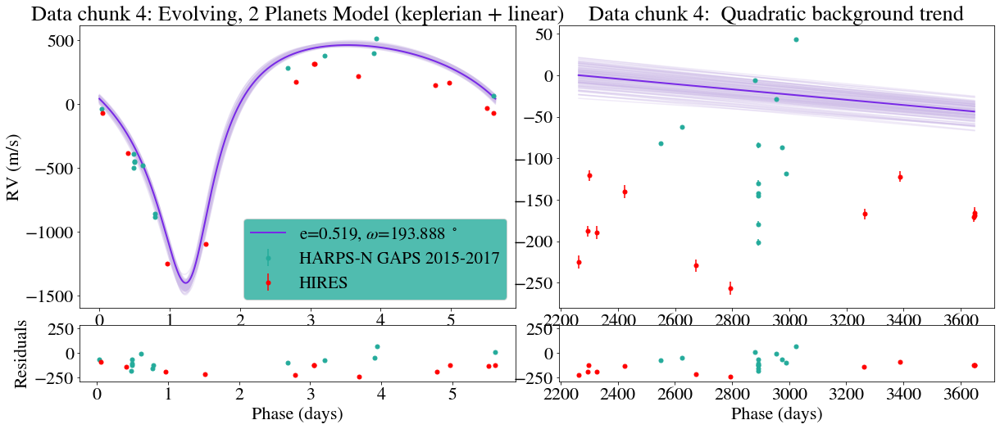

In [159]:
# Make de Wit et al 2017 Figure 5
# 'HARPS-N GAPS 2013-2015', 'HARPS-N GAPS 2015-2017', 'HIRES'
# D_s = 44.14370092191518, 33.058867850110786,-24.817984531672646
# 141.3616907226685, 129.30096314992323, 69.61191521448582


num_subsets = 4
len_data = len(time_np)
cutoff = int(len_data/num_subsets)
index_cutoff_1 = np.argmin(np.abs(time_ti-time_np[cutoff]))
index_cutoff_2 = np.argmin(np.abs(time_ti-time_np[2*cutoff]))
index_cutoff_3 = np.argmin(np.abs(time_ti-time_np[3*cutoff]))

time_chunk_d1 ="Data chunk 1: "
indexes = np.arange(0,cutoff)
e1 = np.median(np.array(e_list)[indexes])
om1 = np.median(np.array(om_list)[indexes])
D_s1,period_mcmc, df_di_sorted1, time_np1, rv_np1,y_preds_time_np_1, y_preds_time_np2_1, s_rv_np_1, instrument1= fair_draws_plot_chunk(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                out, 100, 10, instrument[indexes], time_chunk, eval_method,
               e1=e1, om1=om1, phase_plot=0.15, use_mass_parametrization=True)#, D_s=[69.61191521448582])

time_chunk_d2 ="Data chunk 2: "
indexes = np.arange(cutoff,2*cutoff)
e2 = np.median(np.array(e_list)[indexes])
om2 = np.median(np.array(om_list)[indexes])
D_s2, period_mcmc,df_di_sorted2, time_np2, rv_np2, y_preds_time_np_2, y_preds_time_np2_2, s_rv_np_2, instrument2= fair_draws_plot_chunk(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                out, 100, 10, instrument[indexes], time_chunk, eval_method,
                e1=e2, om1=om2, phase_plot=0.15, use_mass_parametrization=True)#, D_s=[141.3616907226685,69.61191521448582])#[141.3616907226685-50,69.61191521448582-50])#D_s=[141.3616907226685,69.61191521448582])

time_chunk_d3 ="Data chunk 3: "
indexes = np.arange(2*cutoff,3*cutoff)
e3 = np.median(np.array(e_list)[indexes])
om3 = np.median(np.array(om_list)[indexes])
D_s3, period_mcmc,df_di_sorted3, time_np3, rv_np3, y_preds_time_np_3, y_preds_time_np2_3, s_rv_np_3, instrument3= fair_draws_plot_chunk(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                out, 100, 10, instrument[indexes], time_chunk, eval_method,
                e1=e3, om1=om3, phase_plot=0.15, use_mass_parametrization=True)#, D_s=[141.3616907226685,69.61191521448582])#[141.3616907226685-150,69.61191521448582-100])

time_chunk_d4 ="Data chunk 4: "
indexes = np.arange(3*cutoff, 4*cutoff,)
e4 = np.median(np.array(e_list)[indexes])
om4 = np.median(np.array(om_list)[indexes])
D_s4, period_mcmc,df_di_sorted4, time_np4, rv_np4, y_preds_time_np_4, y_preds_time_np2_4, s_rv_np_4, instrument4= fair_draws_plot_chunk(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                out, 100, 10, instrument[indexes], time_chunk, eval_method,
                e1=e4, om1=om4, phase_plot=0.15, use_mass_parametrization=True)#,D_s=[129.30096314992323, 69.61191521448582])#[129.30096314992323-100, 69.61191521448582-100])


$de/dt$ = 8.982e-06  (1.9$\sigma$),  $d\omega/dt$ = 5.401e-05 (5.1$\sigma$)


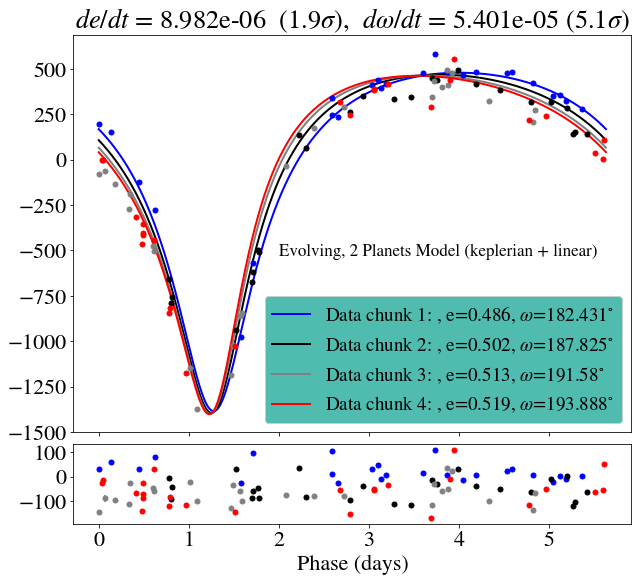

In [167]:
fig, axes = plt.subplots(2,1, figsize=(10, 9),  gridspec_kw={'height_ratios': [3, 0.6]}, sharex=True)
fig.subplots_adjust(hspace=0.05, wspace=0.0)

extra_offset = 40#120#50#100

color1 = 'b'
RV_plotter_without_offset_corr(instrument1, D_s1, axes, color1, rv_np1+extra_offset, s_rv_np_1, time_np1, period_mcmc,
                                  y_preds_time_np_1, y_preds_time_np2_1)
ax = axes[0]
ax.plot(df_di_sorted1['phase'], df_di_sorted1['rvs'], color=color1, linewidth=2,
        label=time_chunk_d1+", e="+str(round(e1,3))+", $\omega$="+str(round(om1*180/np.pi,3))+"$^{\circ}$")


color2 = 'k'
RV_plotter_without_offset_corr(instrument2, D_s2, axes, color2, rv_np2+extra_offset, s_rv_np_2, time_np2, period_mcmc,
                                  y_preds_time_np_2, y_preds_time_np2_2)
ax = axes[0]
ax.plot(df_di_sorted2['phase'], df_di_sorted2['rvs'], color=color2, linewidth=2,
        label=time_chunk_d2+", e="+str(round(e2,3))+", $\omega$="+str(round(om2*180/np.pi,3))+"$^{\circ}$")

color3 = 'grey'
RV_plotter_without_offset_corr(instrument3, D_s3, axes, color3, rv_np3+extra_offset, s_rv_np_3, time_np3, period_mcmc,
                                  y_preds_time_np_3, y_preds_time_np2_3)
ax = axes[0]
ax.plot(df_di_sorted3['phase'], df_di_sorted3['rvs'], color=color3, linewidth=2,
        label=time_chunk_d3+", e="+str(round(e3,3))+", $\omega$="+str(round(om3*180/np.pi,3))+"$^{\circ}$")

color4 = 'red'
RV_plotter_without_offset_corr(instrument4, D_s4, axes, color4, rv_np4+extra_offset, s_rv_np_4, time_np4, period_mcmc,
                                  y_preds_time_np_4, y_preds_time_np2_4)
ax = axes[0]
ax.plot(df_di_sorted4['phase'], df_di_sorted4['rvs'], color=color4, linewidth=2,
        label=time_chunk_d4+", e="+str(round(e4,3))+", $\omega$="+str(round(om4*180/np.pi,3))+"$^{\circ}$")



ax.legend(loc="lower right")
legend = ax.legend(loc="lower right", prop={'size': 19}, facecolor='#24ab9b')
plt.setp(legend.get_texts(), color='k')
len(rv_np1)

axes[0].set_title("$de/dt$ = %.3e  (%.1f$\sigma$),  $d\omega/dt$ = %.3e (%.1f$\sigma$)"%(de_dt_mcmc, de_dt_signif, dom_dt_mcmc, dom_dt_signif))


axes[1].set_xlabel("Phase (days)")
txt = axes[0].text(2, -530, s=(eval_method), ha='left', wrap=True, size = 17)
txt._get_wrap_line_width = lambda : 350.  #  wrap to 600 screen pixels

print("$de/dt$ = %.3e  (%.1f$\sigma$),  $d\omega/dt$ = %.3e (%.1f$\sigma$)"%(de_dt_mcmc, de_dt_signif, dom_dt_mcmc, dom_dt_signif))

eval_method, "red chi^2 = %.3f, BIC = %.3f, AIC = %.3f,"%(chisq, BIC, AIC)

plt.savefig(signif_name_p)


In [168]:
data_signficance ={'model': eval_method,
                'chisq':chisq_k, 
                'AIC':AIC, 
                'BIC': BIC, 
                'de_dt': df_p['de/dt_mcmc'],
                'de_dt_sig':de_dt_signif,
                'dom_dt': df_p["dom/dt_mcmc"],
                'dom_dt_sig': dom_dt_signif,
                }

df_significance = pd.DataFrame(data = data_signficance, index=[0])
df_significance.to_csv(csv_name_p_signif)

<a id='2planet_evolving_quad'></a>
## 2 Planet Model, evolving orbit (de/dt, d$\omega$/dt) for primary, 2nd companion = quadratic background trend

In [139]:
# Re-Load 5 RV datasets without RM measurements

# open npz file
outfile = 'data/Five_RV_datasets.npz'#'NEW_DRS2_3_1_10s_norm.npz'

min_time_sub = 2455000#3980

npzfile = np.load(outfile, allow_pickle=True)
npzfile.files

data = {npzfile.files[0]: npzfile[npzfile.files[0]],
       npzfile.files[1]: npzfile[npzfile.files[1]],
       npzfile.files[2]: npzfile[npzfile.files[2]],
       npzfile.files[3]: npzfile[npzfile.files[3]],
       npzfile.files[4]: npzfile[npzfile.files[4]]}
df_used = pd.DataFrame(data=data)
df_used.head(10)
df_used = df_used[df_used['instrument_merged']!="Lick"][df_used['instrument_merged']!="SOPHIE"]
df_used = df_used.reset_index(drop=True)
df_used = df_used.sort_values(by=['bjd_merged']).reset_index(drop=True)
print(np.unique(df_used['instrument_merged']))


# format data for mcmc fit
rv_np = np.array(list(df_used["mnvel_merged"]-np.mean(df_used["mnvel_merged"])))
s_rv_np = np.array(list(df_used["errvel_merged"]))
time_np = np.array(df_used["bjd_merged"])-min_time_sub#-np.min(df_used["bjd_merged"])
time_min = np.min(df_used["bjd_merged"])
time_np_plus_min = time_np+time_min
instrument = df_used["instrument_merged"]

['HARPS-N GAPS 2013-2015' 'HARPS-N GAPS 2015-2017' 'HIRES']


In [140]:
# CHANGE THIS
num_instr = len(np.unique(instrument))
eval_method = "Evolving, 2 Planets Model (keplerian + quad)"#, "+str(num_instr)+" Instruments"
#freeze_jitter = True
tp_288 = False#True
use_mass_parametrization = True # False

#if tp_288:
#    eval_method = "Evolving, 2 Planets Model, T_p=288 "+str(num_instr)+" Instruments"

# Set fixed params 
jitterpar = 40#80#41.808
M1 = 1.34 # Msolar
#nwalkers = 200
#nlinks = 4000#4000#5000#7000#5000#2000 #0
#nburnin = 3000#4000#5000#4000#500#1000#00

# params that go into theta
K = 932.3
Mp = 9.021
logP = np.log10(5.633473128700384)
e0 = 0.5005 #0.52
de_dt = 4.419e-6
dom_dt = 2e-6
om0 = 188.01*(np.pi/180) #(Ment et al 2018) #187.890*(np.pi/180)#3.280893202442646
tp =  get_periastron_time(5.63346961, om0, e0, 2455756.42709)-min_time_sub#2463982.4915-min_time_sub-0.5#(Ment et al 2018) #get_periastron_time(10**logP, om0, e0, 2455288.84969-min_time_sub)#288.0376218364072-0.11 #289.9##-0.2#289.7#-2# -1.8#-0.1# 288.1-0.2#

if tp_288:
    tp =  get_periastron_time(5.63346961, om0, e0, 2455288.84910)-min_time_sub#2463982.4915-min_time_sub-0.5#(Ment et al 2018) #get_periastron_time(10**logP, om0, e0, 2455288.84969-min_time_sub)#288.0376218364072-0.11 #289.9##-0.2#289.7#-2# -1.8#-0.1# 288.1-0.2#


#eval_method += ", tp = %.2f"%tp
    
D1 = 69+50#69.48684878396841+70#140.88431672328488#1.485e2#152.86247321588866 #120#-35#-5#25.48987114398128
D2 = 129.56572438802945#1.386e2#+120
D3 = 69.48684878396841#7.685e1#70

if num_instr==1:
    D1 = 69-50

#D1=1.485𝑒+021.680𝑒+01−1.685𝑒+01
#D2=1.386𝑒+022.367𝑒+01−2.387𝑒+01
#D3=7.685𝑒+011.012𝑒+01−9.748𝑒+00

jit1 = 37.45343836780902#40
jit2 = 68.41894749724969#40
jit3 = 37.28477499406473#40
# D1 = 50#152.86247321588866 #120#-35#-5#25.48987114398128
# D2 = -100 
# D3 = 0
# jit1 = 40
# jit2 = 40
# jit3 = 40
lin = -1.2e-1##-0.8e-1#-1.1e-1#-1.1e-1     - frozen version -4.546e-02
quad = 1.8e-5 #2.0065437331192983e-05#2e-5

tp2 =0


#theta =  np.array([K,logP, tp, e0, de_dt, om0, dom_dt, D1,D2,D3, lin, quad])
#nfree_params = len(theta)

# priors
pr_K=[800,1300]
w_Mp = 0.01*Mp
pr_Mp = [Mp-1, Mp+1]
pr_logP=[np.nan,np.nan ]#[0, np.log10(10)]
pr_tp=[np.nan,np.nan ]#[285, 290]
pr_e=[0.3,0.7]
pr_D1=[-200, 200]
pr_D2 = [-500, 200]
pr_D3 = [-200, 200]
pr_om=[0, 6.28]
pr_jit1 = [0,100]#[0,100]
pr_jit2 = [-1,100]
pr_jit3 = [-1,100]

# gauss priors
gausspriors =False      #P, tp, D1, 'jit1', 'lin', 'quad'
gauss_theta_indexes = [1,2]#, 16, 19, 22, 23]#, 3]
gauss_theta_priors =[5.63346961, tp]#, D1, jit1, lin, quad]#, e0]#, 0.50833] # Ivshina & Winn 2022, Bonomo et al. 2017
gauss_theta_err = [6.4e-07,3.4e-4]#, 1.076e+01, 4.371e+00, 1.883e-02, 5.574e-06]#, 4.2e-4] #8.2e-4 Ivshina & Winn 2022, de Wit et al. 2017, Bonomo et al. 2017

#if gausspriors:
#    eval_method += ", Gauss priors on P, tp"
#else:
#    eval_method += ", No Gauss priors on P, tp"


# e and omega priors from Spitzer
transitpriors = False
de_dt_transits = 8.9e-4/365.24  #8.9e-4 per year (de Wit et al 2017)
e0_transits = 0.51023-(de_dt_transits)*1000
e_med_list = (e0_transits + de_dt_transits*(df_transit_times_with_eclipses["transit_time"]-min_time_sub)).tolist()
e_err =  4e-3 # uncertainty de Wit et al 2017

dom_dt_transits = 0.91/365.24/180*np.pi #0.91 degrees per year(de Wit et al 2017)
om0_transits = (188.44/180*np.pi)-(dom_dt_transits)*1000
om_med_list = (om0_transits + dom_dt_transits*(df_transit_times_with_eclipses["transit_time"]-min_time_sub)).tolist()
om_err =  (0.31/180*np.pi) # uncertainty de Wit et al 2017

transit_times_list = (df_transit_times_with_eclipses["transit_time"]-min_time_sub).tolist()


# widths
w_K=0.01*K
w_logP =10**(logP)*1e-7
w_tp = 2e-6#0.02*10**(logP)
w_e = 2e-2
w_de_dt = 2e-6
w_om = 5e-2
w_dom_dt = 2e-5
w_D1 = 2
w_lin=1e-2 #0
w_quad=1e-5 #0
w_jit1 = 5

if num_instr ==1:
    w_D2 = 0
    w_D3 = 0
    w_jit2 = 0
    w_jit3 = 0
elif num_instr ==2:
    w_D2 = 5
    w_D3 = 0
    w_jit2 = 5
    w_jit3 = 0
else:
    w_D2 = 5
    w_D3 = 5
    w_jit2 = 5
    w_jit3 = 5
    
if freeze_jitter:
    
    if num_instr == 1:
        jit1 = 40.76037629904555
        w_jit1 = 0
    else:
        jit1 = 35.15721038710301
        jit2 = 62.63228448817992
        jit3 = 40.76037629904555
        w_jit1 = 0
        w_jit2 = 0
        w_jit3 = 0


print("widths:",[w_K, w_D1, w_logP, w_tp, w_de_dt, w_e, w_dom_dt, w_om])

widths = np.array([w_K, w_logP, w_tp, w_e,w_de_dt, w_om, w_dom_dt,w_lin, w_quad, w_D1, w_D2, w_D3, w_jit1, w_jit2, w_jit3])
nfree_params = len(widths[np.nonzero(widths)])

if use_mass_parametrization:
    labels = ["Mp", "LogP", "Tp", "e0", "de/dt","om0","dom/dt","de^2/dt^2", "dom^2/dt^2",
          "Mp2", "LogP2", "Tp2", "e02", "de/dt_2","om02","dom/dt_2",
          "D1","D2","D3", "jit1","jit2","jit3","lin", "quad"]
else:
    labels = ["Amplitude", "LogP", "Tp", "e0", "de/dt","om0","dom/dt","de^2/dt^2", "dom^2/dt^2",
          "Amplitude2", "LogP2", "Tp2", "e02", "de/dt_2","om02","dom/dt_2",
          "D1","D2","D3", "jit1","jit2","jit3","lin", "quad"]


# labels = ["Amplitude", "LogP", "Tp", "e0", "de/dt","om0","dom/dt",
#           "Amplitude2", "LogP2", "Tp2", "e02", "de/dt_2","om02","dom/dt_2",
#           "D1","D2","D3","jit1","jit2","jit3", "lin", "quad"]

len([w_K, w_D1, w_logP, w_tp, w_de_dt, w_e, w_dom_dt, w_om])
nfree_params

e_med_list, tp, eval_method

widths: [9.323, 2, 5.633473128700384e-07, 2e-06, 2e-06, 0.02, 2e-05, 0.05]


([0.5084971040370713,
  0.5096364700287487,
  0.5096501998202786,
  0.513521320052181],
 757.0644287462346,
 'Evolving, 2 Planets Model (keplerian + quad)')

[-1018.221759 -1018.121759 -1018.021759 ...  4092.478241  4092.578241
  4092.678241]


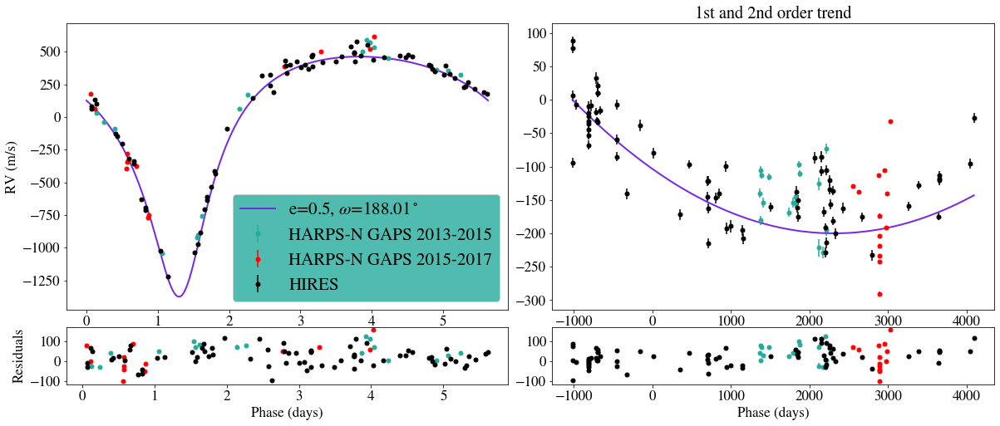

In [141]:
wobble = wobble_edmcmc_ttv.wobble_edmcmc(time_np, rv_np, s_rv_np,labels,
                                    M1, nwalkers, nlinks, nburnin,nfree_params, ncores=num_cpus_to_use,
                                    w_K=w_K, w_Mp = w_Mp, w_logP=w_logP, w_tp=w_tp, w_e=w_e,w_de_dt=w_de_dt, w_om=w_om,
                                    w_dom_dt =w_dom_dt, w_jit1 = w_jit1, w_jit2= w_jit2,w_jit3=w_jit3, 
                                    w_D1=w_D1, w_D2 =w_D2, w_D3 = w_D3,
                                    w_lin = w_lin, w_quad = w_quad, 
                                    K=K, Mp=Mp, logP=logP, tp=tp, e0=e0,de_dt=de_dt, D1=D1, D2=D2, D3=D3,
                                    jit1 = jit1, jit2=jit2, jit3=jit3, 
                                    om0=om0,dom_dt=dom_dt, lin=lin, quad=quad,
                                    pr_Mp=pr_Mp, pr_K=pr_K, pr_logP = pr_logP,pr_tp = pr_tp,pr_e=pr_e, 
                                    pr_D1=pr_D1, pr_D2= pr_D2, pr_D3 = pr_D3, 
                                    pr_om=pr_om, pr_jit1 = pr_jit1, pr_jit2 = pr_jit2, pr_jit3 = pr_jit3,
                                    telescopes = instrument,phase_plot=0.15,
                                    gausspriors=gausspriors, gauss_theta_indexes=gauss_theta_indexes,
                                    gauss_theta_priors=gauss_theta_priors, gauss_theta_err=gauss_theta_err,
                                    use_mass_parametrization=True)#,

df1, df2 = wobble.initial_guess_plot()

In [142]:

Mp = wobble.Mp_from_K()#[0]
Mp
wobble.width

# Run mcmc
out = wobble.wobble_mcmc()

# write results to file

# create a folder and file structure based on eval_method and date_time
date = datetime.today()#.isoformat()
dir_day = "Results/csvs_"+date.strftime("%y_%m_%d")

# check if directory exists. Otherwise, create directory
if not os.path.isdir(dir_day):
    os.mkdir(dir_day)
    
if use_mass_parametrization:
    extra_file_name = "mass_parametrization_"
else:
    extra_file_name = "K_parametization_"
    
if freeze_jitter:
    time_name = date.strftime("%H_%M_%S%p")   
    csv_name = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+".csv"
    csv_name_p = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.csv"
    npz_name_chains = dir_day+"/"+eval_method+"freeze_jitter"+extra_file_name+time_name+"_chains.npz"
    csv_name_p_signif = dir_day+"/Signif_"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.csv"
    pdf_name = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+".pdf"
    png_name = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+".png"
    png_name_p = dir_day+"/"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.png"  
    signif_name_p = dir_day+"/signif_"+eval_method+"_freeze_jitter_"+extra_file_name+time_name+"_PAPER.png"
else:
    time_name = date.strftime("%H_%M_%S%p")   
    csv_name = dir_day+"/"+eval_method+" "+extra_file_name+time_name+".csv"
    csv_name_p = dir_day+"/"+eval_method+" "+extra_file_name+time_name+"_PAPER.csv"
    csv_name_p_signif = dir_day+"/Signif_"+eval_method+" "+extra_file_name+time_name+"_PAPER.csv"
    npz_name_chains = dir_day+"/"+eval_method+" "+extra_file_name+time_name+"_chains.npz"
    pdf_name = dir_day+"/"+eval_method+" "+extra_file_name+time_name+".pdf"
    png_name = dir_day+"/"+eval_method+" "+extra_file_name+time_name+".png"
    png_name_p = dir_day+"/"+eval_method+" "+extra_file_name+time_name+"_PAPER.png"
    signif_name_p = dir_day+"/signif_"+eval_method+" "+extra_file_name+time_name+"_PAPER.png"

0 days, 00:00:00.0 remains. Link 5000 of 5000. Acceptance rate = 0.26
9.044010230123249 +/- 0.10377204197353132 ;     0.7507850169499222 +/- 3.3793407162908354e-06


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

_____________________________


<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

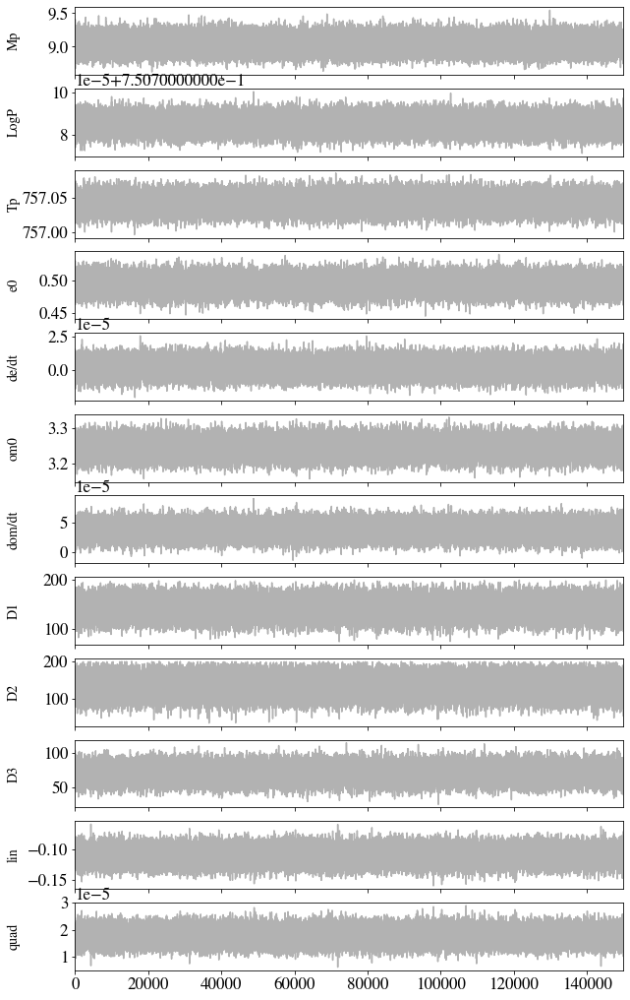

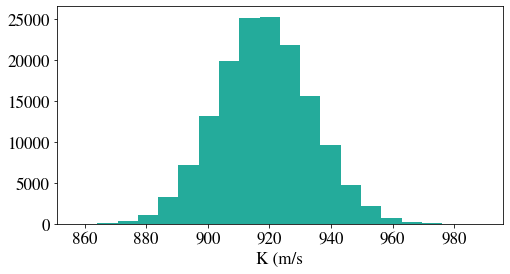

0.4950462608181035 3.245571787674205


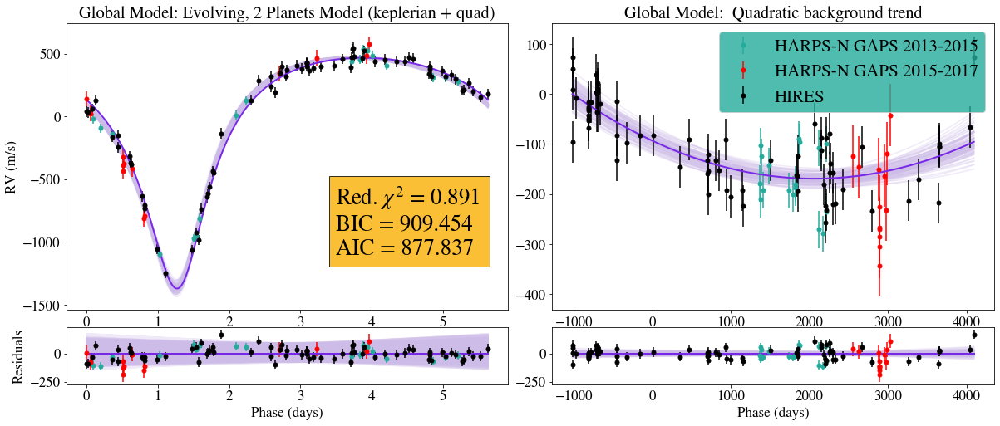

0.4950462608181035 3.245571787674205


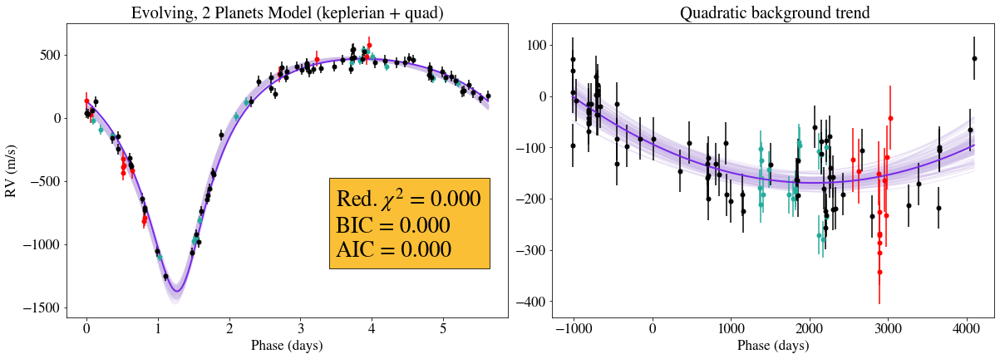

0.49350206470168145 3.217157671655233


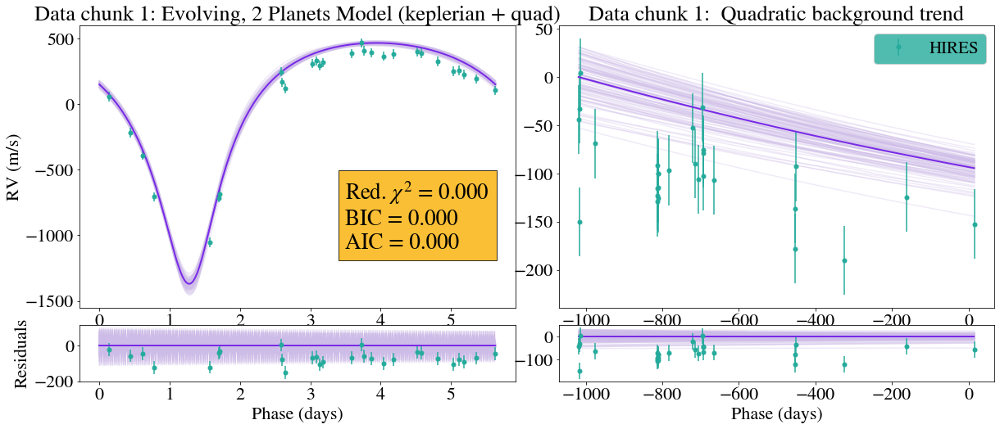

0.496919729971233 3.2788675013441004


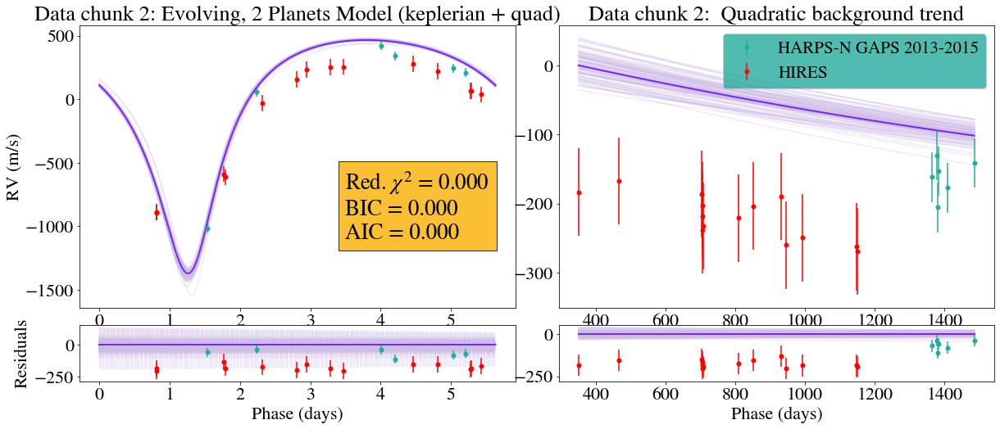

0.4994208855207474 3.3240287066736527


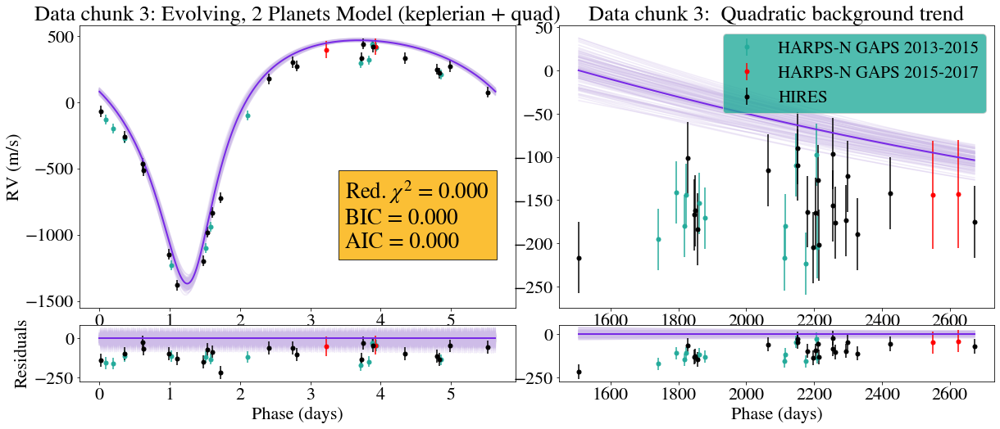

0.5010522288464044 3.3534844639964208


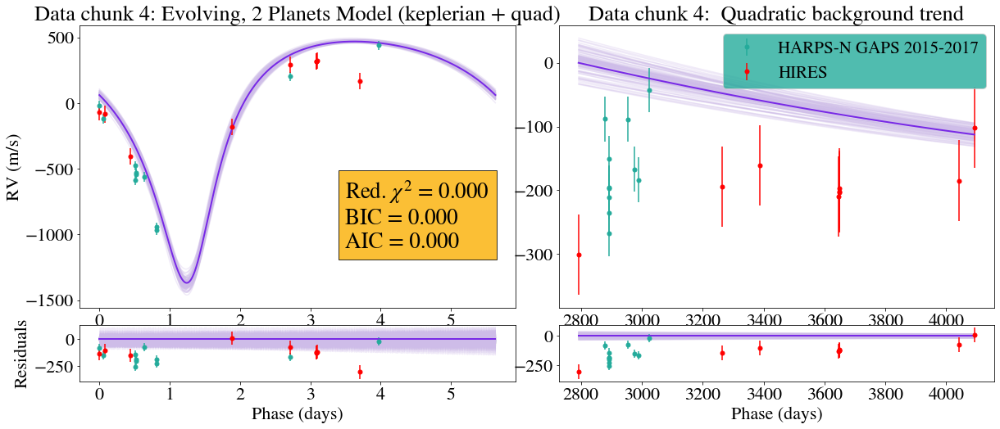

In [143]:
# retrieve eval metrics
# optional to change burnin
#nburnin = 1800

loglikelihood, chisq, AIC, BIC, gelman_values, gelman_labels, om_list, e_list, sigma1, chisq_k, K_list, K2_list = wobble.metrics(out, nburnin)
print("_____________________________")

# Display mcmc 16th, 50th, and 86th percentiles AND write results to a file
df, varying_labels, varying_chains_np, df_p= display_mcmc_percentiles(out, labels, nburnin, loglikelihood, chisq_k, AIC, BIC, gelman_values, gelman_labels, 
                         eval_method,csv_name, csv_name_p)

# Save the mcmc results such that plots can be made later with the mcmc samples
flat_samples = out.get_chains(nthin =5, nburnin = nburnin, flat=True)

np.savez(npz_name_chains,
        flat_samples=flat_samples)

# Save Figures into pdf file
with PdfPages(pdf_name) as pdf:

    # plot chains. Set varying_only=True to only display varying params
    chains_plot(out, labels, nburnin, varying_only=True)
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()
    
    # produce corner plots. Specify label_indexes to only plot a subset of varying params.
    #label_indexes = [0,1,2]
    #corner_plot(out, nburnin, labels, eval_method)#, label_indexes)
    #pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    #plt.show()
    #plt.close()
    
    # Plot a histogram of planet mass(es)
    Mass1 = K_hist(out, nburnin)
    Mass1
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()
    
    time_chunk = "Global Model: "
    fair_draws_plot(time_np, rv_np, s_rv_np, out, 100, 10, instrument, time_chunk, eval_method, phase_plot=0.15,
                   chisq=chisq_k, AIC=AIC, BIC=BIC, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig()  # saves the current figure into a pdf page
    plt.savefig(png_name)
    plt.show()
    plt.close()
    
    time_chunk = ""
    fair_draws_plot(time_np, rv_np, s_rv_np, out, 100, 10, instrument, time_chunk, eval_method, phase_plot=0.15,
                   residuals=False, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig()  # saves the current figure into a pdf page
    plt.savefig(png_name_p)
    plt.show()
    plt.close()
    
    # plot individual 1/4th chunks
    plt.rcParams['font.size'] =22
    num_subsets = 4
    len_data = len(time_np)
    cutoff = int(len_data/num_subsets)
    time_ti = np.linspace(np.min(time_np), np.max(time_np), 10000)
    index_cutoff_1 = np.argmin(np.abs(time_ti-time_np[cutoff]))
    index_cutoff_2 = np.argmin(np.abs(time_ti-time_np[2*cutoff]))
    index_cutoff_3 = np.argmin(np.abs(time_ti-time_np[3*cutoff]))
    
    cutoff_even = int(len(time_ti)/num_subsets)
    index_cutoff_e_1 = np.argmin(np.abs(time_np-time_ti[cutoff_even]))
    index_cutoff_e_2 = np.argmin(np.abs(time_np-time_ti[2*cutoff_even]))
    index_cutoff_e_3 = np.argmin(np.abs(time_np-time_ti[3*cutoff_even]))
    
    cutoff_20 = int(len_data/num_subsets)
    index_cutoff_20_1 = np.argmin(np.abs(time_np-time_ti[cutoff_20]))
    index_cutoff_20_2 = np.argmin(np.abs(time_np-time_ti[2*cutoff_20]))
    index_cutoff_20_3 = np.argmin(np.abs(time_np-time_ti[3*cutoff_20]))


    time_chunk ="Data chunk 1: "
    indexes = np.arange(0,index_cutoff_e_1)
    e1 = np.median(np.array(e_list)[indexes])
    om1 = np.median(np.array(om_list)[indexes])
    fair_draws_plot(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                    out, 100, 10, instrument[indexes], time_chunk, eval_method,
                   e1=e1, om1=om1, phase_plot=0.15, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()


    time_chunk ="Data chunk 2: "
    indexes = np.arange(index_cutoff_e_1, index_cutoff_e_2)
    e1 = np.median(np.array(e_list)[indexes])
    om1 = np.median(np.array(om_list)[indexes])
    fair_draws_plot(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                    out, 100, 10, instrument[indexes], time_chunk, eval_method,
                   e1=e1, om1=om1, phase_plot=0.15, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()

    time_chunk ="Data chunk 3: "
    indexes = np.arange(index_cutoff_e_2, index_cutoff_e_3)
    e1 = np.median(np.array(e_list)[indexes])
    om1 = np.median(np.array(om_list)[indexes])
    fair_draws_plot(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                    out, 100, 10, instrument[indexes], time_chunk, eval_method,
                   e1=e1, om1=om1, phase_plot=0.15, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()

    time_chunk ="Data chunk 4: "
    indexes = np.arange(index_cutoff_e_3, len_data)
    e1 = np.median(np.array(e_list)[indexes])
    om1 = np.median(np.array(om_list)[indexes])
    fair_draws_plot(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                    out, 100, 10, instrument[indexes], time_chunk, eval_method,
                   e1=e1, om1=om1, phase_plot=0.15, err_inflate=True, use_mass_parametrization=True)
    pdf.savefig(dpi=300,bbox_inches='tight')  # saves the current figure into a pdf page
    plt.show()
    plt.close()

In [144]:
# Check wheher e and omega adhered to transit priors
flat_samples = out.get_chains(nthin =5, nburnin = nburnin, flat=True)
Mp_mcmc, logperiod_mcmc, tp_mcmc, e_mcmc, de_dt_mcmc_lb, om_mcmc,dom_dt_mcmc_lb, de2_dt2_mcmc, dom2_dt2_mcmc, Mp2_mcmc, logperiod2_mcmc, tp2_mcmc, e02_mcmc, de2_dt_mcmc, om02_mcmc,dom2_dt_mcmc, D1_mcmc,D2_mcmc,D3_mcmc, jit1_mcmc, jit2_mcmc, jit3_mcmc,  lin_mcmc, quad_mcmc = np.percentile(flat_samples[:, :], [16], axis=0)[0]
Mp_mcmc, logperiod_mcmc, tp_mcmc, e_mcmc, de_dt_mcmc_ub, om_mcmc,dom_dt_mcmc_ub, de2_dt2_mcmc, dom2_dt2_mcmc, Mp2_mcmc, logperiod2_mcmc, tp2_mcmc, e02_mcmc, de2_dt_mcmc, om02_mcmc,dom2_dt_mcmc, D1_mcmc,D2_mcmc,D3_mcmc, jit1_mcmc, jit2_mcmc, jit3_mcmc,  lin_mcmc, quad_mcmc = np.percentile(flat_samples[:, :], [84], axis=0)[0]
Mp_mcmc, logperiod_mcmc, tp_mcmc, e_mcmc, de_dt_mcmc, om_mcmc,dom_dt_mcmc, de2_dt2_mcmc, dom2_dt2_mcmc, Mp2_mcmc, logperiod2_mcmc, tp2_mcmc, e02_mcmc, de2_dt_mcmc, om02_mcmc,dom2_dt_mcmc, D1_mcmc,D2_mcmc,D3_mcmc, jit1_mcmc, jit2_mcmc, jit3_mcmc,  lin_mcmc, quad_mcmc = np.percentile(flat_samples[:, :], [50], axis=0)[0]

    
# for i in range(0, len(transit_times_list)):
#     print("e_transit:[%.4f, %.4f, %.4f], e_rv:%.4f "% (e_med_list[i], 
#                                                        e_med_list[i]-e_err,e_med_list[i]+e_err, 
#                                                        e_mcmc+de_dt_mcmc*transit_times_list[i]), 
#                                                        e_med_list[i]-e_err<e_mcmc+de_dt_mcmc*transit_times_list[i])<e_med_list[i]+e_err)
#     print("om_transit:[%.4f, %.4f, %.4f], om_rv:%.4f "% (om_med_list[i], 
#                                                          om_med_list[i]-om_err, om_med_list[i]+om_err, 
#                                                          om_mcmc+dom_dt_mcmc*transit_times_list[i])
#                                                          om_med_list[i]-om_err<om_mcmc+dom_dt_mcmc*transit_times_list[i])<om_med_list[i]+om_err)
#     print("             ")

dom_dt_mcmc*180/np.pi/(np.diff([dom_dt_mcmc,dom_dt_mcmc_lb])*180/np.pi)
dom_dt_mcmc*180/np.pi, np.diff([dom_dt_mcmc*180/np.pi, dom_dt_mcmc_lb*180/np.pi])[0], dom_dt_mcmc*180/np.pi/(np.diff([dom_dt_mcmc,dom_dt_mcmc_lb])*180/np.pi)


# compute significance of dom/dt and de/dt trends
de_dt_sigma = np.mean(np.abs([de_dt_mcmc_lb-de_dt_mcmc, de_dt_mcmc_ub-de_dt_mcmc]))
dom_dt_sigma = np.mean(np.abs([dom_dt_mcmc_lb-dom_dt_mcmc, dom_dt_mcmc_ub-dom_dt_mcmc]))

de_dt_signif = np.abs(de_dt_mcmc)/de_dt_sigma
dom_dt_signif = np.abs(dom_dt_mcmc)/dom_dt_sigma

print("$de/dt$ = %.3e  (%.1f$\sigma$),  $d\omega/dt$ = %.3e (%.1f$\sigma$)"%(de_dt_mcmc, de_dt_signif, dom_dt_mcmc, dom_dt_signif))

print(de_dt_mcmc,de_dt_sigma, dom_dt_mcmc, dom_dt_sigma)

$de/dt$ = 2.022e-06  (0.4$\sigma$),  $d\omega/dt$ = 3.651e-05 (3.2$\sigma$)
2.0220162035398597e-06 5.063343336804725e-06 3.65098000264219e-05 1.1337122901958789e-05


0.4933822391651361 3.214994085443772
0.496906620329267 3.2786307918628617
0.49936010398017033 3.3229312268968423
0.5008682170572507 3.3501619220638954


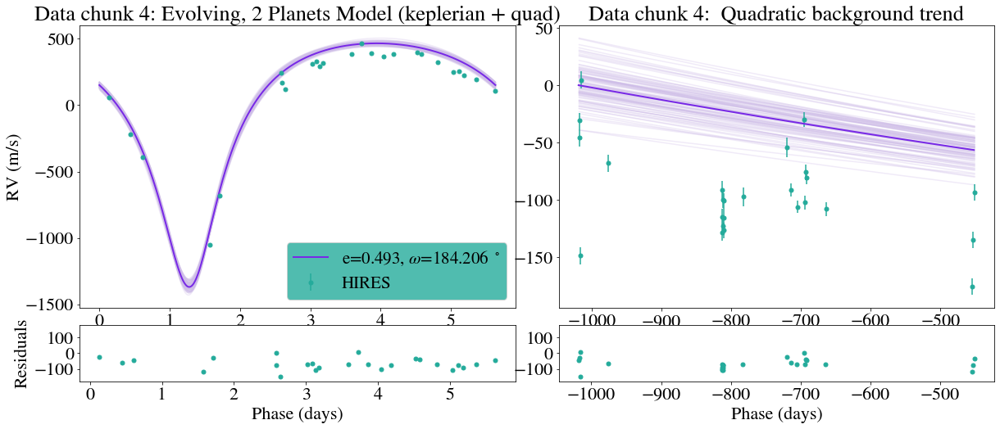

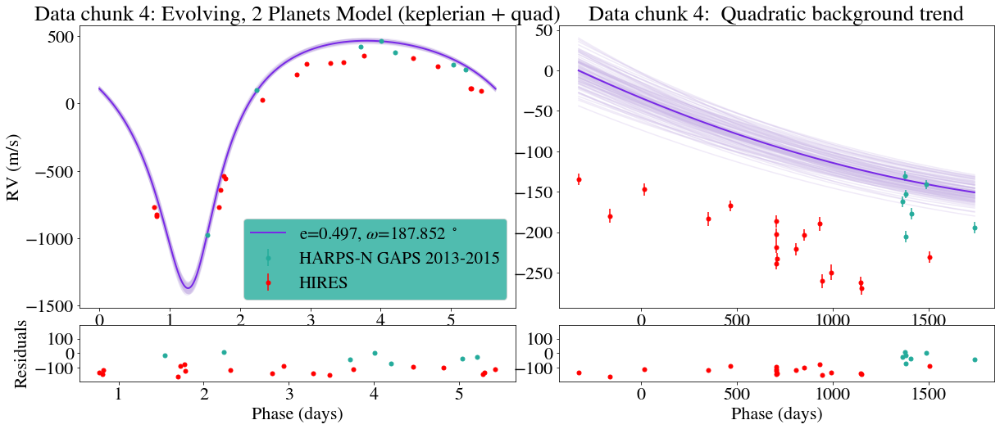

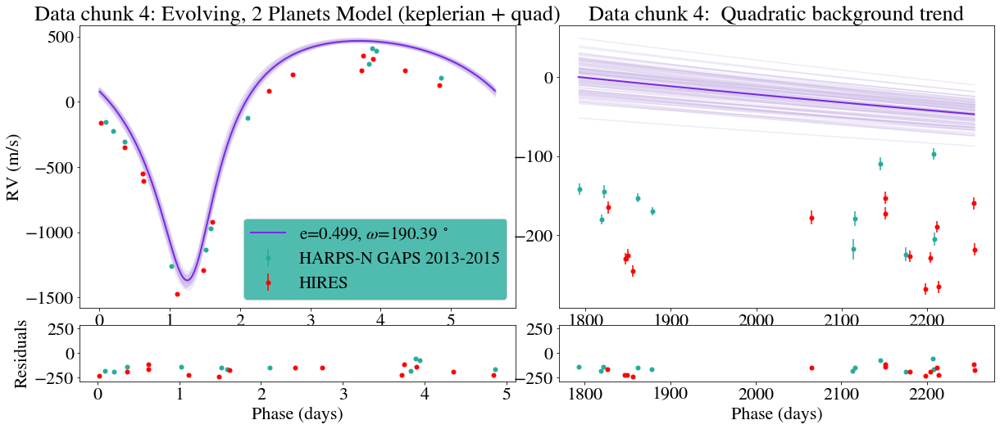

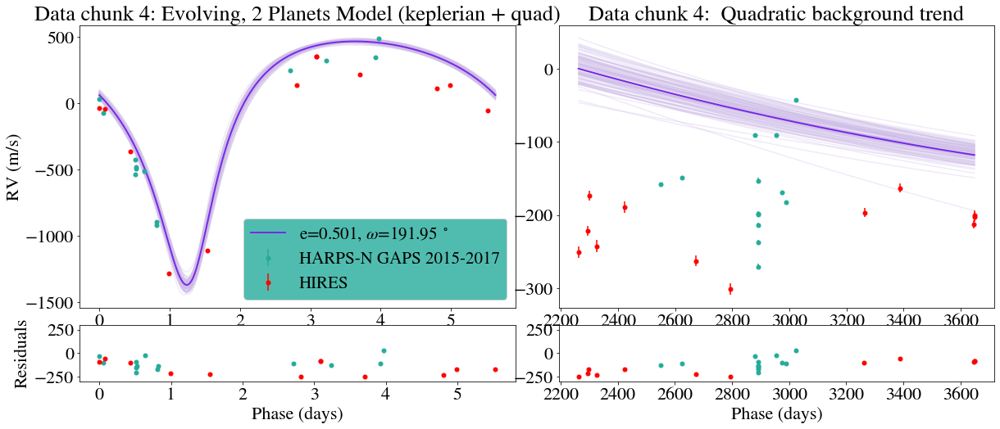

In [145]:
# Make de Wit et al 2017 Figure 5
# 'HARPS-N GAPS 2013-2015', 'HARPS-N GAPS 2015-2017', 'HIRES'
# D_s = 44.14370092191518, 33.058867850110786,-24.817984531672646
# 141.3616907226685, 129.30096314992323, 69.61191521448582


num_subsets = 4
len_data = len(time_np)
cutoff = int(len_data/num_subsets)
index_cutoff_1 = np.argmin(np.abs(time_ti-time_np[cutoff]))
index_cutoff_2 = np.argmin(np.abs(time_ti-time_np[2*cutoff]))
index_cutoff_3 = np.argmin(np.abs(time_ti-time_np[3*cutoff]))

time_chunk_d1 ="Data chunk 1: "
indexes = np.arange(0,cutoff)
e1 = np.median(np.array(e_list)[indexes])
om1 = np.median(np.array(om_list)[indexes])
D_s1,period_mcmc, df_di_sorted1, time_np1, rv_np1,y_preds_time_np_1, y_preds_time_np2_1, s_rv_np_1, instrument1= fair_draws_plot_chunk(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                out, 100, 10, instrument[indexes], time_chunk, eval_method,
               e1=e1, om1=om1, phase_plot=0.15, use_mass_parametrization=True)#, D_s=[69.61191521448582])

time_chunk_d2 ="Data chunk 2: "
indexes = np.arange(cutoff,2*cutoff)
e2 = np.median(np.array(e_list)[indexes])
om2 = np.median(np.array(om_list)[indexes])
D_s2, period_mcmc,df_di_sorted2, time_np2, rv_np2, y_preds_time_np_2, y_preds_time_np2_2, s_rv_np_2, instrument2= fair_draws_plot_chunk(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                out, 100, 10, instrument[indexes], time_chunk, eval_method,
                e1=e2, om1=om2, phase_plot=0.15, use_mass_parametrization=True)#, D_s=[141.3616907226685,69.61191521448582])#[141.3616907226685-50,69.61191521448582-50])#D_s=[141.3616907226685,69.61191521448582])

time_chunk_d3 ="Data chunk 3: "
indexes = np.arange(2*cutoff,3*cutoff)
e3 = np.median(np.array(e_list)[indexes])
om3 = np.median(np.array(om_list)[indexes])
D_s3, period_mcmc,df_di_sorted3, time_np3, rv_np3, y_preds_time_np_3, y_preds_time_np2_3, s_rv_np_3, instrument3= fair_draws_plot_chunk(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                out, 100, 10, instrument[indexes], time_chunk, eval_method,
                e1=e3, om1=om3, phase_plot=0.15, use_mass_parametrization=True)#, D_s=[141.3616907226685,69.61191521448582])#[141.3616907226685-150,69.61191521448582-100])

time_chunk_d4 ="Data chunk 4: "
indexes = np.arange(3*cutoff, 4*cutoff,)
e4 = np.median(np.array(e_list)[indexes])
om4 = np.median(np.array(om_list)[indexes])
D_s4, period_mcmc,df_di_sorted4, time_np4, rv_np4, y_preds_time_np_4, y_preds_time_np2_4, s_rv_np_4, instrument4= fair_draws_plot_chunk(time_np[indexes], rv_np[indexes], s_rv_np[indexes], 
                out, 100, 10, instrument[indexes], time_chunk, eval_method,
                e1=e4, om1=om4, phase_plot=0.15, use_mass_parametrization=True)#,D_s=[129.30096314992323, 69.61191521448582])#[129.30096314992323-100, 69.61191521448582-100])


$de/dt$ = 2.022e-06  (0.4$\sigma$),  $d\omega/dt$ = 3.651e-05 (3.2$\sigma$)


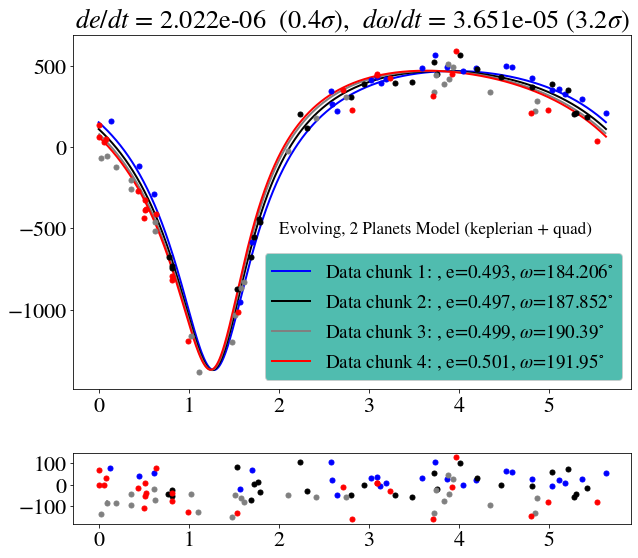

In [152]:
fig, axes = plt.subplots(2,1, figsize=(10, 9),  gridspec_kw={'height_ratios': [3, 0.6]})
fig.subplots_adjust(hspace=0.3, wspace=0.0)

extra_offset = 100#120#50#100

color1 = 'b'
RV_plotter_without_offset_corr(instrument1, D_s1, axes, color1, rv_np1+extra_offset, s_rv_np_1, time_np1, period_mcmc,
                                  y_preds_time_np_1, y_preds_time_np2_1)
ax = axes[0]
ax.plot(df_di_sorted1['phase'], df_di_sorted1['rvs'], color=color1, linewidth=2,
        label=time_chunk_d1+", e="+str(round(e1,3))+", $\omega$="+str(round(om1*180/np.pi,3))+"$^{\circ}$")


color2 = 'k'
RV_plotter_without_offset_corr(instrument2, D_s2, axes, color2, rv_np2+extra_offset, s_rv_np_2, time_np2, period_mcmc,
                                  y_preds_time_np_2, y_preds_time_np2_2)
ax = axes[0]
ax.plot(df_di_sorted2['phase'], df_di_sorted2['rvs'], color=color2, linewidth=2,
        label=time_chunk_d2+", e="+str(round(e2,3))+", $\omega$="+str(round(om2*180/np.pi,3))+"$^{\circ}$")

color3 = 'grey'
RV_plotter_without_offset_corr(instrument3, D_s3, axes, color3, rv_np3+extra_offset, s_rv_np_3, time_np3, period_mcmc,
                                  y_preds_time_np_3, y_preds_time_np2_3)
ax = axes[0]
ax.plot(df_di_sorted3['phase'], df_di_sorted3['rvs'], color=color3, linewidth=2,
        label=time_chunk_d3+", e="+str(round(e3,3))+", $\omega$="+str(round(om3*180/np.pi,3))+"$^{\circ}$")

color4 = 'red'
RV_plotter_without_offset_corr(instrument4, D_s4, axes, color4, rv_np4+extra_offset, s_rv_np_4, time_np4, period_mcmc,
                                  y_preds_time_np_4, y_preds_time_np2_4)
ax = axes[0]
ax.plot(df_di_sorted4['phase'], df_di_sorted4['rvs'], color=color4, linewidth=2,
        label=time_chunk_d4+", e="+str(round(e4,3))+", $\omega$="+str(round(om4*180/np.pi,3))+"$^{\circ}$")



ax.legend(loc="lower right")
legend = ax.legend(loc="lower right", prop={'size': 19}, facecolor='#24ab9b')
plt.setp(legend.get_texts(), color='k')
len(rv_np1)

axes[0].set_title("$de/dt$ = %.3e  (%.1f$\sigma$),  $d\omega/dt$ = %.3e (%.1f$\sigma$)"%(de_dt_mcmc, de_dt_signif, dom_dt_mcmc, dom_dt_signif))

txt = axes[0].text(2, -530, s=(eval_method), ha='left', wrap=True, size = 17)
txt._get_wrap_line_width = lambda : 350.  #  wrap to 600 screen pixels

print("$de/dt$ = %.3e  (%.1f$\sigma$),  $d\omega/dt$ = %.3e (%.1f$\sigma$)"%(de_dt_mcmc, de_dt_signif, dom_dt_mcmc, dom_dt_signif))

eval_method, "red chi^2 = %.3f, BIC = %.3f, AIC = %.3f,"%(chisq, BIC, AIC)

plt.savefig(signif_name_p)


In [126]:
data_signficance ={'model': eval_method,
                'chisq':chisq_k, 
                'AIC':AIC, 
                'BIC': BIC, 
                'de_dt': df_p['de/dt_mcmc'],
                'de_dt_sig':de_dt_signif,
                'dom_dt': df_p["dom/dt_mcmc"],
                'dom_dt_sig': dom_dt_signif,
                }

df_significance = pd.DataFrame(data = data_signficance, index=[0])
df_significance.to_csv(csv_name_p_signif)